In [1]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
import os
import matplotlib.image as mpimg

from helper_functions import *

In [2]:
test_img = mpimg.imread('test_images/straight_lines1.jpg')
nx = 9 # the number of inside corners in x
ny = 6
ret, mtx, dist = calibrate(test_img)

Total images:  20

Object points:  [array([[ 0.,  0.,  0.],
       [ 1.,  0.,  0.],
       [ 2.,  0.,  0.],
       [ 3.,  0.,  0.],
       [ 4.,  0.,  0.],
       [ 5.,  0.,  0.],
       [ 6.,  0.,  0.],
       [ 7.,  0.,  0.],
       [ 8.,  0.,  0.],
       [ 0.,  1.,  0.],
       [ 1.,  1.,  0.],
       [ 2.,  1.,  0.],
       [ 3.,  1.,  0.],
       [ 4.,  1.,  0.],
       [ 5.,  1.,  0.],
       [ 6.,  1.,  0.],
       [ 7.,  1.,  0.],
       [ 8.,  1.,  0.],
       [ 0.,  2.,  0.],
       [ 1.,  2.,  0.],
       [ 2.,  2.,  0.],
       [ 3.,  2.,  0.],
       [ 4.,  2.,  0.],
       [ 5.,  2.,  0.],
       [ 6.,  2.,  0.],
       [ 7.,  2.,  0.],
       [ 8.,  2.,  0.],
       [ 0.,  3.,  0.],
       [ 1.,  3.,  0.],
       [ 2.,  3.,  0.],
       [ 3.,  3.,  0.],
       [ 4.,  3.,  0.],
       [ 5.,  3.,  0.],
       [ 6.,  3.,  0.],
       [ 7.,  3.,  0.],
       [ 8.,  3.,  0.],
       [ 0.,  4.,  0.],
       [ 1.,  4.,  0.],
       [ 2.,  4.,  0.],
       [ 3.,  4.,  0.],
    

Image size:  (720, 1280, 3)


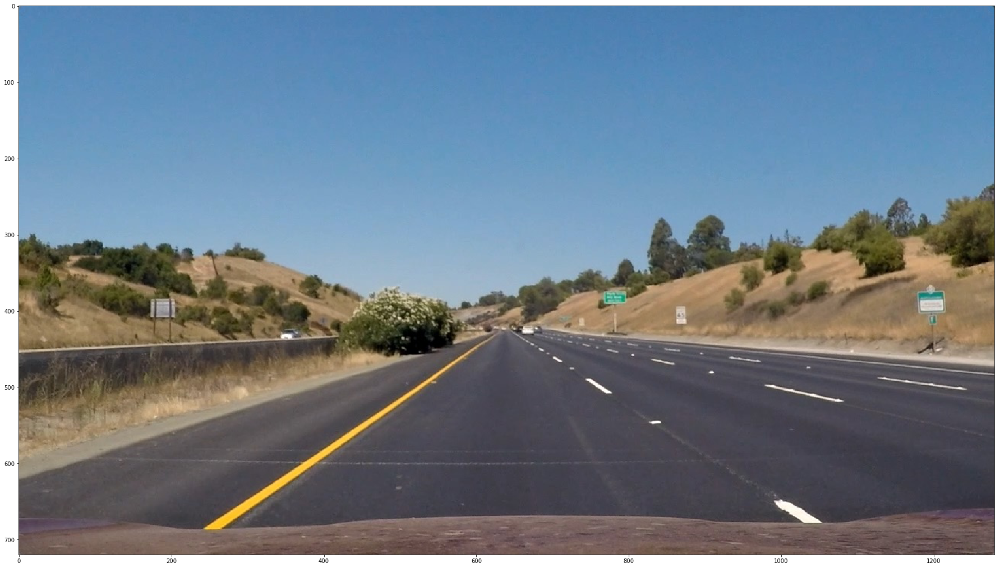

In [3]:
print("Image size: ", test_img.shape)
plt.figure(figsize=(48, 18))
plt.imshow(test_img)
plt.show()

In [4]:
masked_img = pipeline(test_img)

720 1280


In [5]:
warped, M, Minv = unwarp(masked_img, nx, ny, mtx, dist)

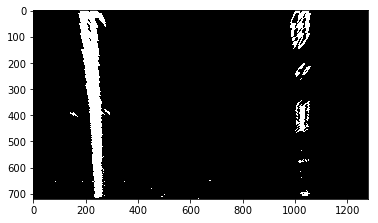

In [6]:
#print(warped)
plt.imshow(warped, cmap='gray')
plt.show()

In [7]:
leftx_base, rightx_base = get_max_points(warped)
print(leftx_base, rightx_base)

236 1034


In [8]:
left_lane_inds, right_lane_inds = get_lane_indices(warped, leftx_base, rightx_base)
print(left_lane_inds, right_lane_inds)

934 1134
938 1138
931 1131
923 1123
927 1127
930 1130
918 1118
932 1132
916 1116
[44033 44034 44035 ...,  9745  9746  9747] [44332 44469 44470 ...,  9783  9784  9785]


In [9]:
ploty, left_fitx, right_fitx = get_fitted_poly(warped, left_lane_inds, right_lane_inds)

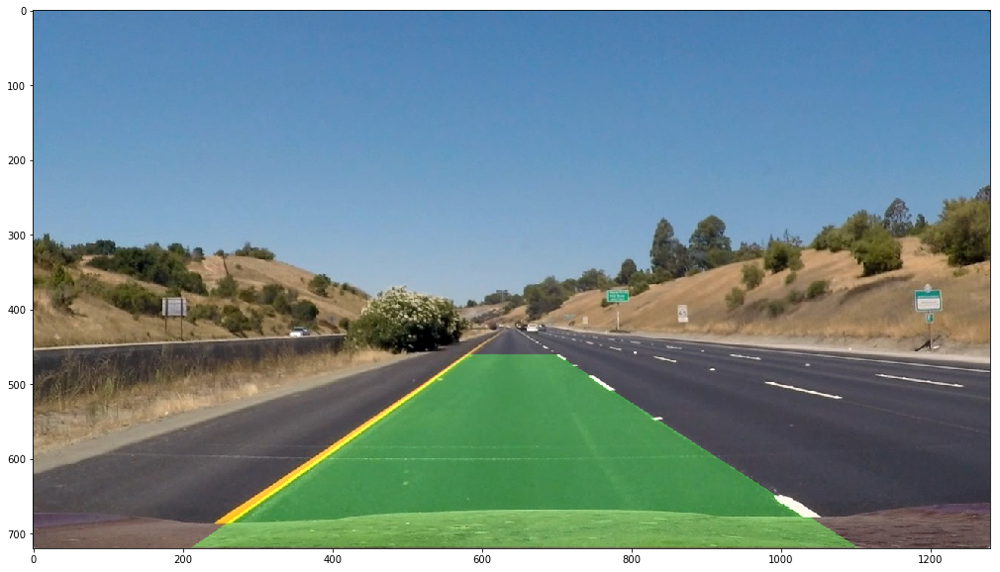

In [10]:
final_img = draw_lines(test_img, warped, ploty, left_fitx, right_fitx, Minv)
plt.figure(figsize=(20, 10))
plt.imshow(final_img)
plt.show()

720 1280
934 1134
938 1138
931 1131
923 1123
927 1127
930 1130
918 1118
932 1132
916 1116
55337.0238239 m 3564.07471157 m


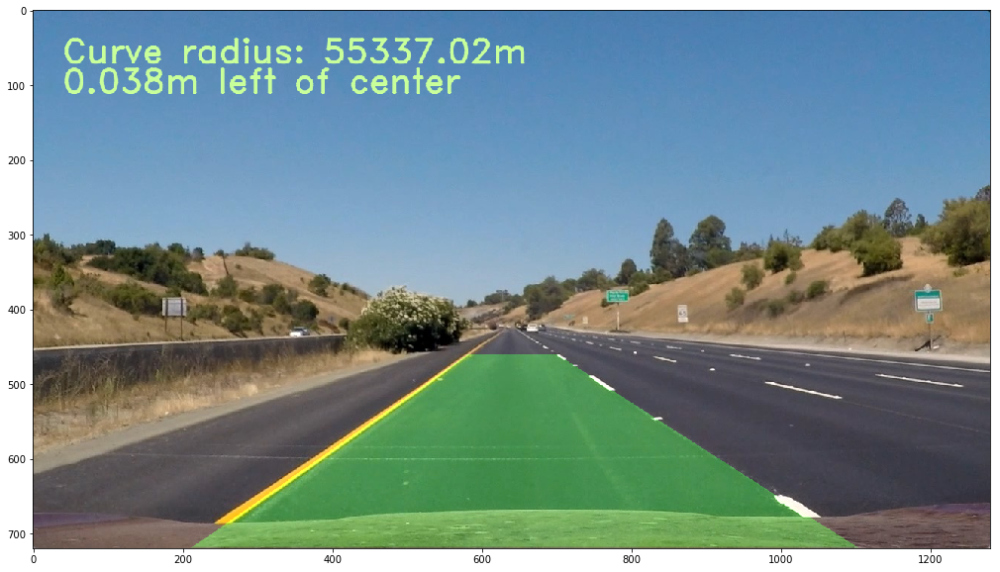

In [11]:
final_img = all_steps(test_img, mtx, dist)
plt.figure(figsize=(20, 10))
plt.imshow(final_img)
plt.show()

720 1280
1041 1241
1068 1268
1009 1209
1031 1231
1039 1239
1039 1239
1075 1275
1086 1286
1117 1317
1038.85670184 m 516.270933402 m


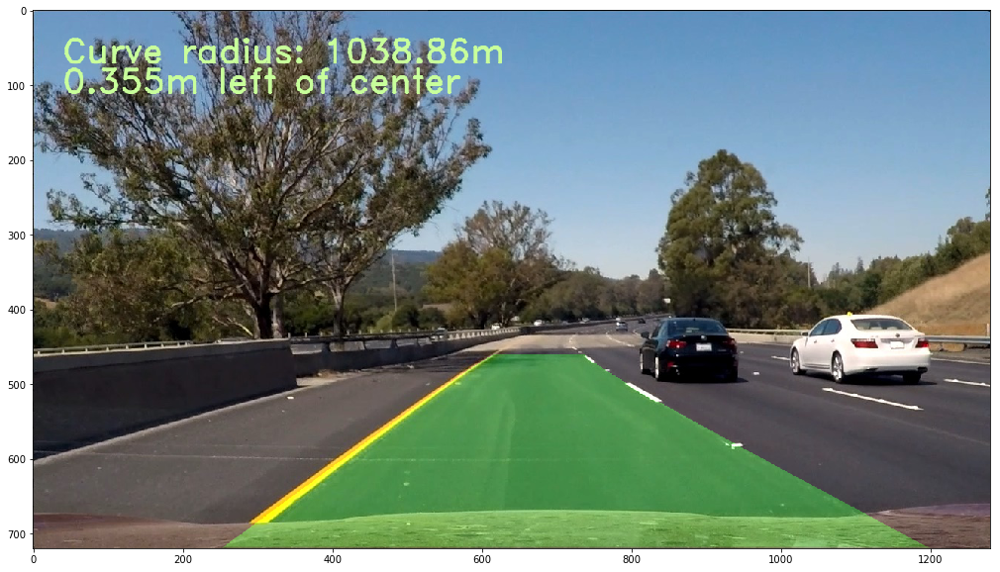

720 1280
1000 1200
990 1190
986 1186
1015 1215
1015 1215
1024 1224
1033 1233
1033 1233
1057 1257
689.730492345 m 1091.18606178 m


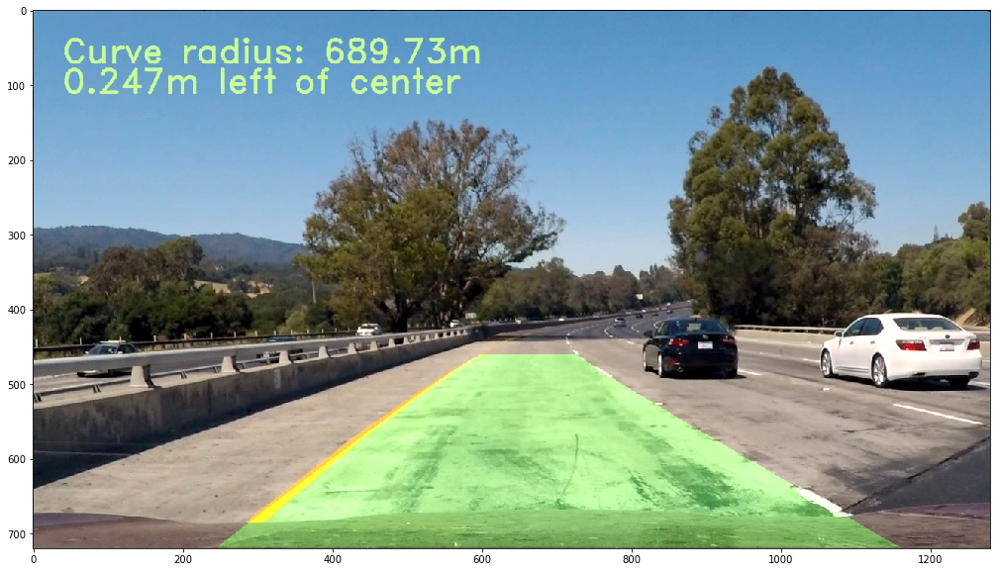

720 1280
1025 1225
1014 1214
1014 1214
1015 1215
1010 1210
1010 1210
1059 1259
1059 1259
1081 1281
1435.96767611 m 703.098079415 m


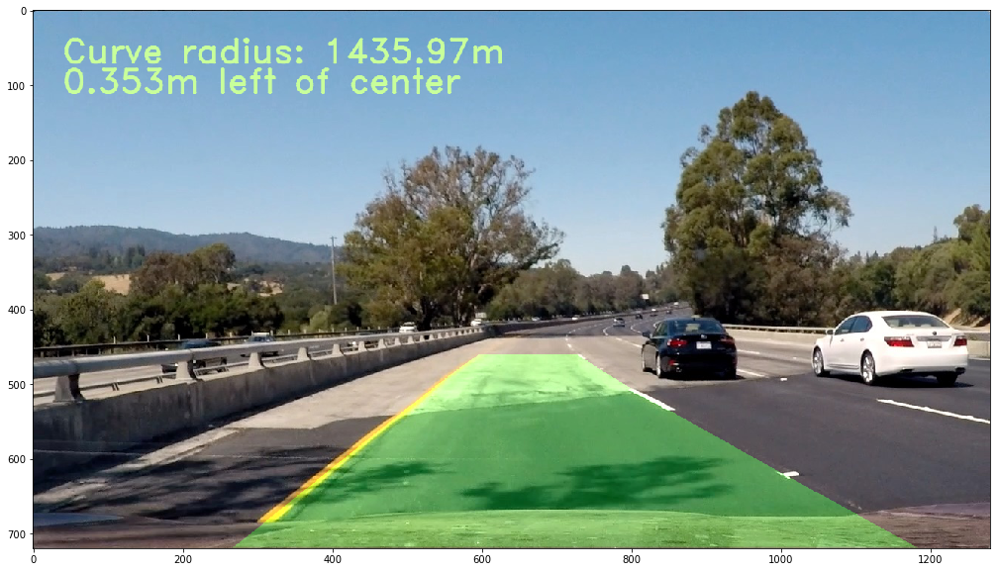

720 1280
977 1177
972 1172
978 1178
993 1193
1014 1214
1010 1210
1019 1219
1010 1210
1034 1234
541.354087791 m 1190.27182253 m


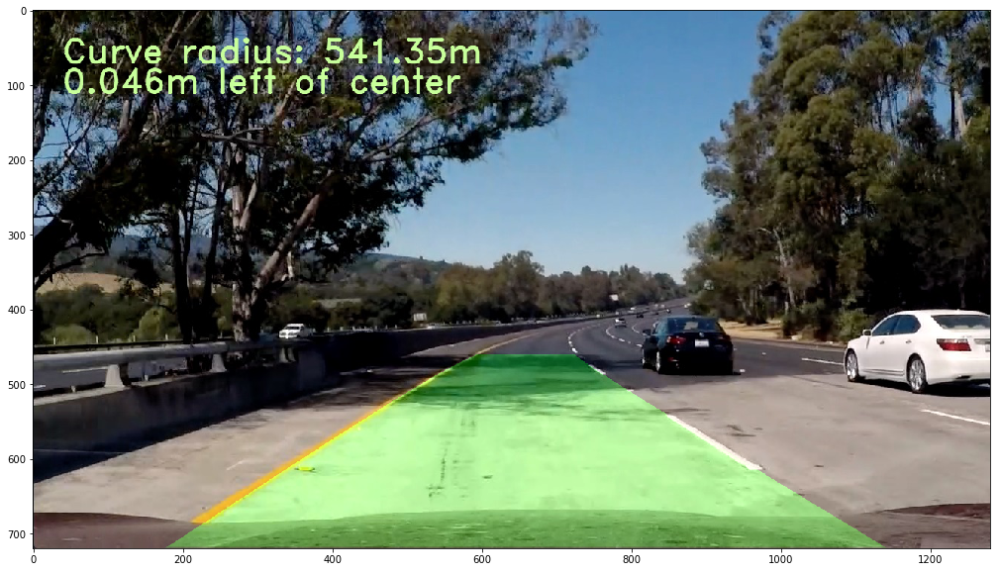

720 1280
934 1134
938 1138
931 1131
923 1123
927 1127
930 1130
918 1118
932 1132
916 1116
55337.0238239 m 3564.07471157 m


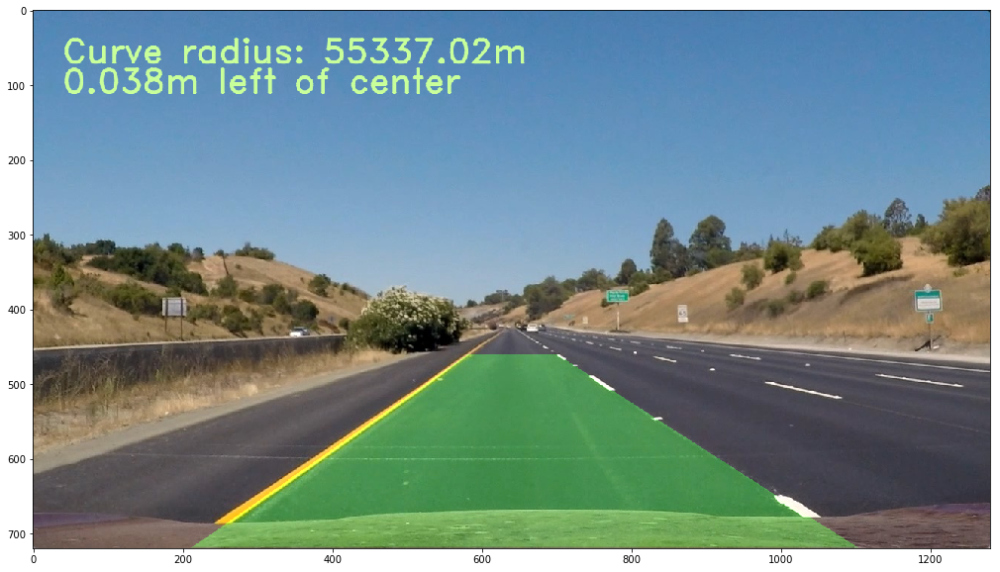

720 1280
982 1182
964 1164
978 1178
991 1191
983 1183
978 1178
942 1142
892 1092
893 1093
588.696839122 m 518.271352279 m


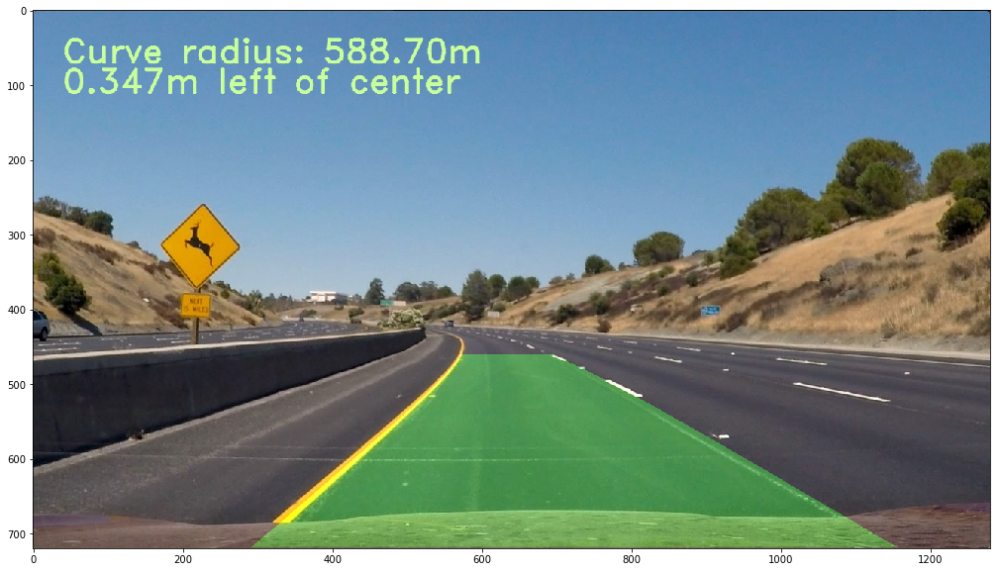

720 1280
949 1149
942 1142
941 1141
943 1143
944 1144
945 1145
945 1145
949 1149
946 1146
4025.86916845 m 11793.6261676 m


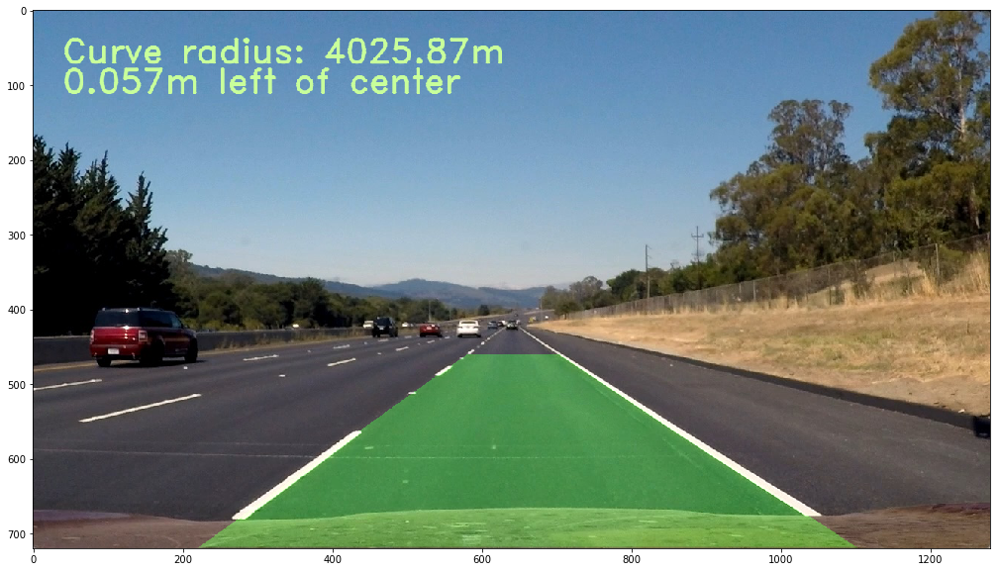

720 1280
975 1175
976 1176
981 1181
991 1191
1006 1206
1022 1222
1036 1236
1064 1264
1084 1284
1009.10580688 m 924.362539687 m


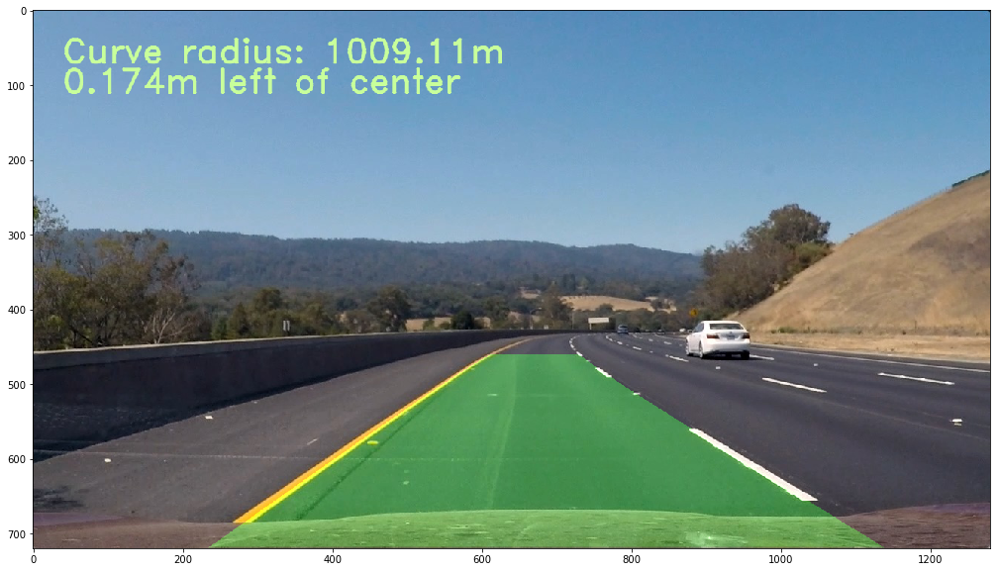

In [12]:
for img_file in os.listdir('test_images'):
    img = mpimg.imread('test_images/'+img_file)
    final_img = all_steps(img, mtx, dist)
    plt.figure(figsize=(20, 10))
    plt.imshow(final_img)
    plt.show()

In [18]:
generate_video(mtx, dist)

720 1280
1007 1207
1014 1214
1013 1213
1004 1204
983 1183
985 1185
942 1142
935 1135
938 1138
555.276408511 m 800.96812177 m
[MoviePy] >>>> Building video output_project_video.mp4
[MoviePy] Writing video output_project_video.mp4


  0%|          | 0/1261 [00:00<?, ?it/s]

720 1280
1007 1207
1014 1214
1013 1213
1004 1204
983 1183
985 1185
942 1142
935 1135
938 1138
555.276408511 m 800.96812177 m
720 1280
1007 1207
1014 1214
1011 1211
1003 1203
979 1179
979 1179
944 1144
937 1137
881 1081
529.674358499 m 854.946435893 m


  0%|          | 2/1261 [00:00<02:06,  9.97it/s]

720 1280
1010 1210
1017 1217
1010 1210
1010 1210
988 1188
949 1149
944 1144
940 1140
887 1087
495.919696919 m 483.340671171 m
720 1280
1015 1215
1017 1217
1011 1211
979 1179
993 1193
954 1154
946 1146
881 

  0%|          | 4/1261 [00:00<01:59, 10.55it/s]

1081
893 1093
527.350675231 m 468.374785137 m
720 1280
1019 1219
1018 1218
1012 1212
994 1194
964 1164
959 1159
950 1150
896 1096
895 1095


  0%|          | 6/1261 [00:00<01:53, 11.09it/s]

578.375564093 m 530.971257941 m
720 1280
973 1173
1017 1217
1023 1223
992 1192
963 1163
958 1158
956 1156
906 1106
844 1044
564.89922552 m 627.209443796 m
720 1280
961 1161
1019 1219
991 1191
1002 1202
971 1171
964 1164
905 1105
915 1115
857 1057
580.91000241 m 769.416981972 m
720 1280


  1%|          | 8/1261 [00:00<01:49, 11.42it/s]

965 1165
1022 1222
1004 1204
979 1179
971 1171
964 1164
917 1117
909 1109
863 1063
557.062171566 m 13083.8161289 m
720 1280
989 1189
1013 1213
1010 1210
984 1184
974 1174
971 1171
932 1132
877 1077
871 1071


  1%|          | 10/1261 [00:00<01:45, 11.85it/s]

585.92509237 m 3814.95091207 m
720 1280
973 1173
1006 1206
1014 1214
988 1188
978 1178
978 1178
938 1138
886 1086
879 1079
607.983216638 m 167292.853921 m
720 1280
999 1199
1016 1216
1016 1216
989 1189
979 1179
936 1136
950 1150
890 1090
880 1080
610.205200302 m 1437.84034998 m
720 1280


  1%|          | 12/1261 [00:00<01:43, 12.08it/s]

994 1194
1016 1216
1003 1203
997 1197
991 1191
953 1153
953 1153
909 1109
900 1100
674.277797056 m 1738.41371911 m
720 1280
991 1191
952 1152
1005 1205
996 1196
996 1196
957 1157
913 1113
908 1108
905 1105


  1%|          | 14/1261 [00:01<01:40, 12.44it/s]

715.105648658 m 1451.57743295 m
720 1280
1002 1202
992 1192
1006 1206
997 1197
958 1158
968 1168
920 1120
913 1113
891 1091
718.086125335 m 2144.11407177 m
720 1280
1005 1205
1009 1209
1001 1201
994 1194
961 1161
918 1118
913 1113
912 1112
855 1055
702.994240085 m 713.349499802 m
720 1280


  1%|▏         | 16/1261 [00:01<01:38, 12.63it/s]

1003 1203
1007 1207
997 1197
997 1197
959 1159
923 1123
909 1109
881 1081
856 1056
863.793124771 m 558.433425867 m
720 1280
1005 1205
1007 1207
999 1199
961 1161
961 1161
923 1123
915 1115
863 1063
841 1041
840.727940468 m 680.778539384 m


  1%|▏         | 18/1261 [00:01<01:37, 12.70it/s]

720 1280
1005 1205
1005 1205
1005 1205
966 1166
932 1132
925 1125
919 1119
872 1072
808 1008
886.369373126 m 841.231787421 m
720 1280
937 1137
1008 1208
1008 1208
976 1176
944 1144
933 1133
933 1133
888 1088
826 1026
918.082348268 m 885.283025141 m
720 1280
945 1145
1006 1206
981 1181
981 1181
949 1149
942 1142
891 1091
902 1102
838 1038
961.737345864 m 967.088398908 m


  2%|▏         | 20/1261 [00:01<01:35, 12.97it/s]

720 1280
956 1156
984 1184
989 1189
959 1159
957 1157
953 1153
909 1109
910 1110
853 1053


  2%|▏         | 22/1261 [00:01<01:37, 12.77it/s]

1030.89832578 m 1348.74402811 m
720 1280
965 1165
1011 1211
996 1196
973 1173
965 1165
967 1167
932 1132
873 1073
866 1066
1138.11880094 m 3214.38595953 m
720 1280
974 1174
1001 1201
1001 1201
979 1179
970 1170
970 1170
940 1140
884 1084
880 1080
993.525505804 m 4657.61479885 m
720 1280


  2%|▏         | 24/1261 [00:01<01:36, 12.86it/s]

975 1175
1004 1204
976 1176
980 1180
972 1172
941 1141
952 1152
893 1093
880 1080
948.449933003 m 973.098293051 m
720 1280
996 1196
1004 1204
988 1188
980 1180
980 1180
948 1148
901 1101
894 1094
883 1083
833.670825119 m 674.294559672 m
720 1280


  2%|▏         | 26/1261 [00:02<01:34, 13.04it/s]

990 1190
1004 1204
994 1194
988 1188
988 1188
961 1161
914 1114
907 1107
904 1104
860.457761476 m 860.764207187 m
720 1280


  2%|▏         | 28/1261 [00:02<01:35, 12.93it/s]

995 1195
988 1188
999 1199
991 1191
961 1161
982 1182
923 1123
916 1116
898 1098
839.005870226 m 1069.56985291 m
720 1280
1003 1203
1008 1208
1004 1204
1004 1204
981 1181
981 1181
940 1140
933 1133
882 1082
829.001710054 m 1208.00891429 m
720 1280
1001 1201
1009 1209
1004 1204
1004 1204
981 1181
947 1147
940 1140
938 1138
883 1083
805.423967471 m 704.708884582 m


  2%|▏         | 30/1261 [00:02<01:34, 13.09it/s]

720 1280
1001 1201
1008 1208
1004 1204
982 1182
982 1182
949 1149
938 1138
874 1074
891 1091
749.85955409 m 494.252806347 m
720 1280
1001 1201
1008 1208
1001 1201
984 1184
951 1151
948 1148
941 1141
895 1095
867 1067
610.359797918 m 518.818021681 m
720 1280
946 1146
1006 1206
971 1171
983 1183
953 1153
943 1143
943 1143
897 1097
833 1033
576.159164494 m 665.305835499 m


  3%|▎         | 32/1261 [00:02<01:32, 13.27it/s]

720 1280
948 1148
1002 1202
991 1191
991 1191
963 1163
953 1153
903 1103
915 1115
852 1052
588.558286032 m 832.561056921 m
720 1280
951 1151
978 1178
996 1196
969 1169
963 1163
960 1160
920 1120
857 1057
855 1055


  3%|▎         | 34/1261 [00:02<01:32, 13.32it/s]

531.934725018 m 1774.55051437 m
720 1280
969 1169
990 1190
1001 1201
976 1176
964 1164
964 1164
928 1128
867 1067
859 1059
499.655528675 m 2570.01840349 m


  3%|▎         | 36/1261 [00:02<01:31, 13.43it/s]

720 1280
972 1172
999 1199
999 1199
976 1176
965 1165
930 1130
938 1138
875 1075
862 1062
496.698955804 m 535.183579647 m
720 1280


  3%|▎         | 38/1261 [00:02<01:29, 13.59it/s]

976 1176
1002 1202
983 1183
976 1176
971 1171
936 1136
883 1083
877 1077
868 1068
480.728066536 m 612.279063744 m
720 1280
982 1182
968 1168
987 1187
977 1177
977 1177
945 1145
890 1090
880 1080
854 1054
464.38934621 m 987.859306064 m
720 1280
986 1186
985 1185
986 1186
977 1177
943 1143
943 1143
892 1092
878 1078
818 1018
423.83864386 m 465.182790666 m


  3%|▎         | 40/1261 [00:03<01:30, 13.44it/s]

720 1280
990 1190
997 1197
988 1188
983 1183
955 1155
908 1108
899 1099
891 1091
833 1033
418.732580277 m 398.666973946 m
720 1280
999 1199
999 1199
991 1191
991 1191
959 1159
918 1118
902 1102
882 1082
844 1044
411.422064704 m 470.596284935 m
720 1280
1000 1200
1002 1202
995 1195
966 1166
966 1166
924 1124
910 1110
852 1052
860 1060
419.896301141 m 542.185104555 m


  3%|▎         | 42/1261 [00:03<01:31, 13.26it/s]

720 1280
999 1199
1004 1204
1001 1201
972 1172
928 1128
932 1132
922 1122
868 1068
828 1028
426.467599442 m 488.658682994 m


  3%|▎         | 44/1261 [00:03<01:37, 12.42it/s]

720 1280
932 1132
1007 1207
1007 1207
981 1181
951 1151
939 1139
934 1134
887 1087
817 1017
449.069783433 m 527.84970761 m
720 1280


  4%|▎         | 46/1261 [00:03<01:33, 12.97it/s]

946 1146
1009 1209
988 1188
996 1196
956 1156
947 1147
947 1147
898 1098
832 1032
476.488220457 m 630.316784031 m
720 1280
948 1148
992 1192
992 1192
992 1192
960 1160
952 1152
900 1100
914 1114
846 1046
462.346733802 m 868.58227539 m
720 1280
957 1157
980 1180
1000 1200
975 1175
964 1164
963 1163
918 1118
853 1053
851 1051
540.167678748 m 1624.61095929 m
720 1280


  4%|▍         | 48/1261 [00:03<01:35, 12.74it/s]

975 1175
997 1197
997 1197
976 1176
965 1165
965 1165
925 1125
864 1064
852 1052
526.144879201 m 1284.57729634 m
720 1280
981 1181
1003 1203
1003 1203
983 1183
973 1173
932 1132
943 1143
882 1082
865 1065
604.370562481 m 798.230072374 m
720 1280
986 1186
1006 1206
992 1192
983 1183
979 1179
943 1143
890 1090
883 1083
874 1074


  4%|▍         | 50/1261 [00:03<01:39, 12.19it/s]

615.041261525 m 557.06757773 m
720 1280
991 1191
974 1174
995 1195
986 1186
986 1186
950 1150
898 1098
888 1088
882 1082
647.313466314 m 815.005530319 m


  4%|▍         | 52/1261 [00:04<01:38, 12.31it/s]

720 1280
990 1190
973 1173
994 1194
984 1184
948 1148
980 1180
906 1106
887 1087
813 1013
668.515402386 m 670.69485271 m
720 1280
994 1194
1000 1200
992 1192
992 1192
957 1157
910 1110
902 1102
894 1094
832 1032
681.414447969 m 447.500547948 m
720 1280
997 1197
1001 1201
993 1193
993 1193
962 1162
917 1117
903 1103
882 1082
843 1043


  4%|▍         | 54/1261 [00:04<01:36, 12.52it/s]

709.72811458 m 459.584594531 m
720 1280
998 1198
1003 1203
997 1197
967 1167
967 1167
924 1124
910 1110
847 1047
858 1058
829.470661376 m 549.573212639 m
720 1280


  4%|▍         | 56/1261 [00:04<01:35, 12.64it/s]

1003 1203
1004 1204
1001 1201
974 1174
939 1139
931 1131
920 1120
868 1068
833 1033
848.512548122 m 527.982715208 m
720 1280


  5%|▍         | 58/1261 [00:04<01:34, 12.75it/s]

927 1127
1006 1206
956 1156
978 1178
945 1145
933 1133
937 1137
877 1077
809 1009
934.102800116 m 634.830472021 m
720 1280
938 1138
998 1198
985 1185
985 1185
950 1150
938 1138
878 1078
893 1093
824 1024
961.231150678 m 770.747221442 m
720 1280
948 1148
948 1148
987 1187
954 1154
944 1144
940 1140
897 1097
827 1027
816 1016
884.318803052 m 1166.42038438 m


  5%|▍         | 60/1261 [00:04<01:39, 12.02it/s]

720 1280
943 1143
978 1178
988 1188
955 1155
940 1140
887 1087
898 1098
831 1031
819 1019
827.140859698 m 763.553879829 m
720 1280
949 1149
988 1188
988 1188
956 1156
943 1143
906 1106
853 1053
835 1035
826 1026
747.370066086 m 1212.90482654 m
720 1280
960 1160
993 1193
966 1166
954 1154
953 1153
911 1111
847 1047
836 1036
794 994


  5%|▍         | 62/1261 [00:04<01:38, 12.13it/s]

720.596688281 m 878.622702743 m
720 1280
971 1171
951 1151
971 1171
959 1159
959 1159
922 1122
860 1060
848 1048
791 991
675.621753748 m 850.394513892 m
720 1280


  5%|▌         | 64/1261 [00:05<01:37, 12.29it/s]

975 1175
953 1153
972 1172
961 1161
931 1131
865 1065
865 1065
856 1056
803 1003
626.985129758 m 516.080510831 m
720 1280


  5%|▌         | 66/1261 [00:05<01:35, 12.56it/s]

975 1175
983 1183
974 1174
964 1164
935 1135
882 1082
875 1075
871 1071
820 1020
672.425709867 m 585.112553182 m
720 1280
979 1179
985 1185
975 1175
975 1175
942 1142
891 1091
878 1078
822 1022
829 1029
608.593248382 m 726.465462304 m
720 1280
982 1182
986 1186
977 1177
947 1147
947 1147
897 1097
885 1085
839 1039
800 1000
624.114705268 m 739.928086167 m


  5%|▌         | 68/1261 [00:05<01:37, 12.23it/s]

720 1280
980 1180
986 1186
973 1173
953 1153
908 1108
904 1104
899 1099
853 1053
791 991
639.035675112 m 796.567174361 m
720 1280
898 1098
983 1183
983 1183
954 1154
914 1114
903 1103
853 1053
860 1060
798 998
647.641317726 m 1034.84120138 m
720 1280
911 1111
986 1186
964 1164
964 1164
922 1122
913 1113
870 1070
879 1079
814 1014


  6%|▌         | 70/1261 [00:05<01:36, 12.38it/s]

687.310085708 m 1150.15826298 m
720 1280
916 1116
933 1133
968 1168
927 1127
924 1124
918 1118
884 1084
822 1022
815 1015
706.296898535 m 668.477385244 m


  6%|▌         | 72/1261 [00:05<01:38, 12.11it/s]

720 1280
922 1122
942 1142
973 1173
938 1138
929 1129
929 1129
893 1093
837 1037
828 1028
742.976265686 m 588.91180821 m
720 1280
930 1130
977 1177
977 1177
943 1143
934 1134
894 1094
906 1106
847 1047
833 1033
821.877880852 m 610.735444342 m
720 1280
951 1151
979 1179
945 1145
946 1146


  6%|▌         | 74/1261 [00:05<01:37, 12.23it/s]

938 1138
910 1110
840 1040
851 1051
839 1039
897.02743903 m 803.323195076 m
720 1280
944 1144
980 1180
958 1158
950 1150
950 1150
920 1120
866 1066
862 1062
856 1056
1029.92281509 m 873.31487504 m
720 1280
949 1149
951 1151
959 1159
953 1153
917 1117
924 1124
877 1077
865 1065
816 1016


  6%|▌         | 76/1261 [00:06<01:41, 11.73it/s]

1078.4571687 m 589.539296166 m
720 1280
963 1163
960 1160
967 1167
961 1161
937 1137
957 1157
892 1092
881 1081
825 1025
1350.51539661 m 861.571116402 m
720 1280
967 1167
975 1175
970 1170
970 1170
941 1141
895 1095
901 1101
891 1091
841 1041


  6%|▌         | 78/1261 [00:06<01:51, 10.65it/s]

1502.55316577 m 623.223941598 m
720 1280
976 1176
978 1178
974 1174
974 1174
955 1155
913 1113
908 1108
904 1104
858 1058
1417.01905823 m 443.545766468 m
720 1280
979 1179
978 1178
975 1175
954 1154
954 1154
921 1121
912 1112
862 1062
866 1066
1476.9816819 m 457.473469698 m


  6%|▋         | 80/1261 [00:06<01:51, 10.62it/s]

720 1280
976 1176
977 1177
962 1162
956 1156
924 1124
922 1122
913 1113
867 1067
837 1037
1719.79496427 m 548.815368799 m
720 1280


  7%|▋         | 82/1261 [00:06<01:48, 10.83it/s]

918 1118
978 1178
978 1178
963 1163
934 1134
926 1126
924 1124
884 1084
820 1020
1582.05273759 m 571.351902212 m
720 1280
952 1152
979 1179
965 1165
967 1167
937 1137
929 1129


  7%|▋         | 84/1261 [00:06<01:46, 11.09it/s]

893 1093
893 1093
831 1031
1419.82752005 m 776.026616575 m
720 1280
961 1161
975 1175
973 1173
973 1173
949 1149
943 1143
906 1106
912 1112
852 1052
1429.1837885 m 1063.92809223 m
720 1280
940 1140
975 1175
978 1178
958 1158
950 1150
951 1151
917 1117
858 1058
857 1057
1269.60571004 m 3293.42274903 m


  7%|▋         | 86/1261 [00:07<01:46, 11.01it/s]

720 1280
960 1160
980 1180
973 1173
961 1161
954 1154
954 1154
926 1126
869 1069
864 1064
1115.84970258 m 5377.99965629 m
720 1280
970 1170
979 1179
960 1160
958 1158
950 1150
923 1123
923 1123
867 1067
861 1061
896.902175351 m 745.923787466 m
720 1280
959 1159
967 1167
961 1161
955 1155
955 1155
921 1121
872 1072
868 1068
863 1063


  7%|▋         | 88/1261 [00:07<01:41, 11.54it/s]

747.292766708 m 1528.7734307 m
720 1280
950 1150
965 1165
962 1162
956 1156
924 1124
932 1132
877 1077
869 1069
816 1016
676.382555887 m 740.813247975 m


  7%|▋         | 90/1261 [00:07<01:39, 11.80it/s]

720 1280
954 1154
967 1167
961 1161
954 1154
925 1125
880 1080
874 1074
871 1071
821 1021
582.604725736 m 511.831194165 m
720 1280
969 1169
972 1172
966 1166
966 1166
932 1132
893 1093
886 1086
883 1083
838 1038
599.378621753 m 560.44434995 m
720 1280
967 1167
974 1174
969 1169
941 1141
947 1147
901 1101
894 1094
843 1043
846

  7%|▋         | 92/1261 [00:07<01:38, 11.85it/s]

 1046
591.753032993 m 594.19496984 m
720 1280
970 1170
973 1173
969 1169
946 1146
910 1110
904 1104
899 1099
857 1057
797 997
589.178067057 m 679.520728044 m


  7%|▋         | 94/1261 [00:07<01:41, 11.46it/s]

720 1280
899 1099
974 1174
974 1174
950 1150
917 1117
907 1107
908 1108
863 1063
805 1005
578.275259967 m 743.580855923 m
720 1280
909 1109
975 1175
952 1152
955 1155
921 1121
914 1114
870 1070
880 1080
822 1022
591.896112167 m 916.225087672 m
720 1280


  8%|▊         | 96/1261 [00:07<01:39, 11.68it/s]

917 1117
961 1161
957 1157
930 1130
926 1126
921 1121
887 1087
846 1046
827 1027
602.707071157 m 1232.84252283 m
720 1280
921 1121
920 1120
963 1163
937 1137
928 1128
933 1133
894 1094
841 1041
833 1033
614.86242154 m 1766.22839078 m
720 1280
936 1136
968 1168
962 1162
943 1143
935 1135
909 1109
907 1107
856 1056
844 1044
627.332145264 m 813.068807519 m


  8%|▊         | 98/1261 [00:08<01:40, 11.59it/s]

720 1280
939 1139
969 1169
938 1138
945 1145
939 1139
909 1109
909 1109
858 1058
850 1050
639.606059527 m 787.09595454 m


  8%|▊         | 100/1261 [00:08<01:38, 11.80it/s]

720 1280
940 1140
973 1173
954 1154
949 1149
949 1149
922 1122
875 1075
867 1067
862 1062
646.04752924 m 773.984566338 m
720 1280
944 1144
962 1162
957 1157
952 1152
952 1152
925 1125
885 1085
871 1071
867 1067
641.217651973 m 717.681687741 m
720 1280
949 1149
970 1170
958 1158
953 1153
931 1131
931 1131
887 1087
875 1075


  8%|▊         | 102/1261 [00:08<01:37, 11.93it/s]

822 1022
632.992819769 m 538.101100082 m
720 1280
956 1156
967 1167
962 1162
973 1173
939 1139
896 1096
893 1093
888 1088
839 1039
672.824853194 m 456.968072797 m
720 1280


  8%|▊         | 104/1261 [00:08<01:36, 11.97it/s]

962 1162
969 1169
965 1165
965 1165
942 1142
911 1111
898 1098
897 1097
852 1052
652.747576491 m 485.434390258 m


  8%|▊         | 106/1261 [00:08<01:35, 12.10it/s]

720 1280
967 1167
975 1175
972 1172
952 1152
957 1157
923 1123
912 1112
855 1055
869 1069
646.970146793 m 507.947571642 m
720 1280
973 1173
978 1178
970 1170
960 1160
931 1131
931 1131
921 1121
881 1081
890 1090
710.69078803 m 597.617743123 m
720 1280
969 1169
983 1183
983 1183
967 1167
947 1147
939 1139
937 1137
897 1097
869 1069


  9%|▊         | 108/1261 [00:08<01:37, 11.78it/s]

721.500907418 m 582.185232538 m
720 1280
959 1159
983 1183
971 1171
971 1171
947 1147
939 1139
939 1139
904 1104
845 1045
650.413197594 m 630.775246459 m
720 1280
963 1163
995 1195
975 1175
955 1155
950 1150
943 1143
906 1106
916 1116
856 1056
628.074747453 m 1714.8518495 m


  9%|▊         | 110/1261 [00:09<01:40, 11.50it/s]

720 1280
969 1169
991 1191
981 1181
963 1163
954 1154
955 1155
920 1120
869 1069
866 1066
658.101999037 m 4048.63015933 m
720 1280
960 1160
985 1185
985 1185
965 1165
955 1155
955 1155
927 1127
876 1076
872 1072
620.848549215 m 1432.20054223 m


  9%|▉         | 112/1261 [00:09<01:47, 10.65it/s]

720 1280
962 1162
990 1190
981 1181
973 1173
966 1166
939 1139
951 1151
896 1096
888 1088
638.439019134 m 1150.33364902 m
720 1280
980 1180
989 1189
979 1179
971 1171
971 1171
947 1147
897 1097
895 1095
887 1087
593.298688667 m 551.765445644 m
720 1280


  9%|▉         | 114/1261 [00:09<01:48, 10.61it/s]

967 1167
991 1191
981 1181
973 1173
973 1173
950 1150
906 1106
900 1100
899 1099
590.885517225 m 715.084943768 m
720 1280
976 1176
988 1188
981 1181
973 1173
952 1152
952 1152
909 1109
900 1100
845 1045
524.597824141 m 488.732222945 m
720 1280
979 1179
987 1187
980 1180
980 1180
959 1159
916 1116
912 1112
904 1104
857 1057


  9%|▉         | 116/1261 [00:09<01:46, 10.70it/s]

544.591123712 m 410.717161282 m
720 1280
984 1184
989 1189
982 1182
982 1182
962 1162
928 1128
917 1117
891 1091
865 1065
530.747286217 m 437.001532917 m


  9%|▉         | 118/1261 [00:09<01:46, 10.74it/s]

720 1280
981 1181
989 1189
984 1184
964 1164
964 1164
931 1131
923 1123
869 1069
857 1057
555.942045765 m 442.021014755 m
720 1280
983 1183
990 1190
989 1189
970 1170
940 1140
936 1136
931 1131
884 1084
821 1021
528.934245425 m 497.713487222 m


 10%|▉         | 120/1261 [00:10<01:52, 10.15it/s]

720 1280
960 1160
991 1191
965 1165
971 1171
943 1143
936 1136
878 1078
890 1090
828 1028
519.11670037 m 537.385333901 m
720 1280
937 1137
991 1191
981 1181
981 1181
951 1151
944 1144
899 1099
896 1096
839 1039
529.364381744 m 691.009037439 m


 10%|▉         | 122/1261 [00:10<01:56,  9.79it/s]

720 1280
942 1142
973 1173
985 1185
957 1157
953 1153
949 1149
912 1112
853 1053
842 1042
517.521846912 m 601.453045516 m
720 1280
947 1147
980 1180
987 1187
962 1162
953 1153
906 1106
915 1115
859 1059
842 1042
499.061402707 m 462.849058386 m
720 1280


 10%|▉         | 124/1261 [00:10<01:49, 10.36it/s]

953 1153
989 1189
981 1181
966 1166
958 1158
922 1122
886 1086
862 1062
849 1049
491.79950458 m 895.519861638 m
720 1280
982 1182
994 1194
975 1175
967 1167
965 1165
929 1129
881 1081
866 1066
841 1041


 10%|▉         | 126/1261 [00:10<01:45, 10.77it/s]

502.628112409 m 680.569029834 m
720 1280
989 1189
992 1192
983 1183
975 1175
975 1175
945 1145
894 1094
881 1081
852 1052
531.840148792 m 876.775309137 m
720 1280
974 1174
994 1194
985 1185
978 1178
946 1146
959 1159
898 1098
883 1083
825 1025
513.509768368 m 387.30159177 m


 10%|█         | 128/1261 [00:10<01:48, 10.46it/s]

720 1280
978 1178
995 1195
989 1189
984 1184
954 1154
913 1113
906 1106
897 1097
845 1045
513.789779588 m 403.491418839 m
720 1280
1002 1202
994 1194
988 1188
988 1188
956 1156
917 1117
902 1102
839 1039
849 1049
505.886472534 m 488.052610197 m


 10%|█         | 130/1261 [00:10<01:47, 10.49it/s]

720 1280
988 1188
996 1196
991 1191
961 1161
961 1161
922 1122
908 1108
857 1057
832 1032
522.786526126 m 475.884950657 m
720 1280
991 1191
997 1197
996 1196
969 1169
936 1136
925 1125
915 1115
867 1067
802 1002
564.347321094 m 556.143177976 m
720 1280
925 1125
997 1197
963 1163
971 1171
940 1140
926 1126
868 1068
877 1077
811 1011


 10%|█         | 132/1261 [00:11<01:43, 10.90it/s]

566.103653834 m 574.551809124 m
720 1280
935 1135
999 1199
978 1178
978 1178
946 1146
934 1134
887 1087
886 1086
825 1025
616.824749995 m 627.098389503 m
720 1280


 11%|█         | 134/1261 [00:11<01:39, 11.35it/s]

953 1153
977 1177
982 1182
958 1158
949 1149
940 1140
898 1098
835 1035
827 1027
637.599458197 m 625.256190566 m
720 1280


 11%|█         | 136/1261 [00:11<01:37, 11.50it/s]

955 1155
973 1173
989 1189
966 1166
953 1153
953 1153
912 1112
848 1048
837 1037
636.29133954 m 581.977114804 m
720 1280
962 1162
991 1191
991 1191
973 1173
960 1160
916 1116
929 1129
865 1065
851 1051
659.981791295 m 677.045728636 m
720 1280
968 1168
998 1198
981 1181
978 1178
967 1167
937 1137
937 1137
876 1076
865 1065
664.293233764 m 757.297796806 m


 11%|█         | 138/1261 [00:11<01:37, 11.57it/s]

720 1280
983 1183
1003 1203
992 1192
983 1183
982 1182
950 1150
895 1095
888 1088
882 1082
691.687767665 m 1071.38852199 m
720 1280
986 1186
988 1188
996 1196
986 1186
986 1186
957 1157
906 1106
894 1094
879 1079
682.954932786 m 1723.93827824 m
720 1280
992 1192
986 1186
1001 1201
992 1192
967 1167
966 1166
919 1119
907 1107
851 1051


 11%|█         | 140/1261 [00:11<01:34, 11.83it/s]

665.267527355 m 1606.665863 m
720 1280
995 1195
1007 1207
1000 1200
1000 1200
973 1173
927 1127
923 1123
912 1112
864 1064
670.932658117 m 645.766027024 m


 11%|█▏        | 142/1261 [00:11<01:34, 11.81it/s]

720 1280
1004 1204
1009 1209
1001 1201
1001 1201
977 1177
938 1138
925 1125
925 1125
876 1076
699.574745113 m 583.097646103 m
720 1280
1002 1202
1007 1207
1001 1201
976 1176
976 1176
937 1137
923 1123
875 1075
859 1059
741.6037895 m 708.445506888 m
720 1280


 11%|█▏        | 144/1261 [00:12<01:34, 11.81it/s]

995 1195
1006 1206
965 1165
983 1183
944 1144
938 1138
930 1130
888 1088
834 1034
713.969785612 m 766.988662435 m
720 1280
937 1137
1007 1207
968 1168
985 1185
953 1153
942 1142
942 1142
898 1098
847 1047


 12%|█▏        | 146/1261 [00:12<01:31, 12.13it/s]

773.392701566 m 926.207212798 m
720 1280
940 1140
1004 1204
990 1190
990 1190
954 1154
944 1144
905 1105
905 1105
851 1051
781.183579247 m 1122.05568269 m
720 1280
948 1148
970 1170
995 1195
966 1166
959 1159
951 1151
920 1120
871 1071
863 1063
819.409056011 m 1550.277294 m
720 1280


 12%|█▏        | 148/1261 [00:12<01:32, 12.09it/s]

966 1166
979 1179
996 1196
966 1166
954 1154
908 1108
919 1119
867 1067
853 1053
750.720869271 m 618.924072618 m
720 1280
961 1161
999 1199
963 1163
970 1170
958 1158
929 1129
880 1080
873 1073
863 1063


 12%|█▏        | 150/1261 [00:12<01:30, 12.33it/s]

791.78848836 m 815.42790946 m
720 1280
974 1174
1003 1203
981 1181
974 1174
970 1170
938 1138
893 1093
884 1084
875 1075
822.742284559 m 760.57832235 m
720 1280
977 1177
971 1171
986 1186
977 1177
977 1177
941 1141
905 1105
893 1093
845 1045
777.861045016 m 553.078881255 m
720 1280


 12%|█▏        | 152/1261 [00:12<01:29, 12.44it/s]

980 1180
973 1173
990 1190
981 1181
950 1150
964 1164
914 1114
902 1102
844 1044
811.710200788 m 498.610487474 m
720 1280
989 1189
995 1195
988 1188
980 1180
952 1152
919 1119
912 1112
905 1105
853 1053


 12%|█▏        | 154/1261 [00:12<01:29, 12.38it/s]

743.384022097 m 433.842485261 m
720 1280
992 1192
1001 1201
993 1193
993 1193
965 1165
935 1135
923 1123
912 1112
870 1070
764.630676546 m 470.632174657 m
720 1280
998 1198
1004 1204
996 1196
968 1168
981 1181
942 1142
930 1130
874 1074
883 1083
791.333131788 m 522.626621468 m
720 1280


 12%|█▏        | 156/1261 [00:13<01:30, 12.16it/s]

1000 1200
1002 1202
997 1197
974 1174
952 1152
944 1144
934 1134
886 1086
839 1039
763.515045841 m 584.968190039 m
720 1280
964 1164
1002 1202
1002 1202
976 1176
956 1156
944 1144
940 1140
895 1095
834 1034
742.815409568 m 655.218568491 m
720 1280
965 1165
999 1199
977 1177
977 1177
951 1151
940 1140
894 1094
896 1096
836 1036
697.793754677 m 842.26571461 m


 13%|█▎        | 158/1261 [00:13<01:34, 11.69it/s]

720 1280
953 1153
989 1189
981 1181
961 1161
954 1154
948 1148
905 1105
851 1051
846 1046


 13%|█▎        | 160/1261 [00:13<01:34, 11.68it/s]

656.736428379 m 2182.07896852 m
720 1280
955 1155
970 1170
985 1185
964 1164
951 1151
951 1151
908 1108
856 1056
850 1050
639.024796732 m 1477.30359484 m
720 1280
977 1177
993 1193
993 1193
971 1171
959 1159
913 1113
924 1124
870 1070
859 1059
663.191735603 m 917.149013502 m


 13%|█▎        | 162/1261 [00:13<01:33, 11.69it/s]

720 1280
984 1184
994 1194
974 1174
974 1174
963 1163
930 1130
876 1076
878 1078
868 1068
664.873723261 m 952.959813164 m
720 1280
992 1192
996 1196
987 1187
977 1177
975 1175
940 1140
888 1088
885 1085
883 1083
639.168282817 m 1950.00363546 m
720 1280
976 1176
967 1167
986

 13%|█▎        | 164/1261 [00:13<01:35, 11.50it/s]

 1186
976 1176
934 1134
941 1141
893 1093
884 1084
825 1025
617.738715671 m 2335.77798142 m
720 1280
986 1186
984 1184
983 1183
972 1172
939 1139
904 1104
892 1092
885 1085
837 1037
579.982402631 m 539.385536153 m
720 1280
985 1185
993 1193
984 1184
984 1184
946 1146
905 1105
897 1097
896 1096
848 1048


 13%|█▎        | 168/1261 [00:14<01:34, 11.58it/s]

592.894157936 m 595.343194984 m
720 1280
989 1189
993 1193
984 1184
943 1143
956 1156
909 1109
897 1097
847 1047
839 1039
611.510972476 m 649.844441744 m
720 1280
992 1192
996 1196
989 1189
958 1158
958 1158
920 1120
911 1111
869 1069
843 1043
674.748957397 m 654.103983696 m
720 1280


 13%|█▎        | 170/1261 [00:14<01:34, 11.58it/s]

990 1190
997 1197
996 1196
965 1165
933 1133
927 1127
923 1123
885 1085
822 1022
720.881119479 m 684.449041558 m
720 1280
927 1127
999 1199
956 1156
971 1171
944 1144
935 1135
935 1135
895 1095
835 1035
743.054572488 m 773.112003791 m
720 1280
964 1164
994 1194
973 1173
973 1173
948 1148
940 1140
897 1097
906 1106
848 1048
843.474781989 m 739.29762968 m


 14%|█▎        | 172/1261 [00:14<01:31, 11.94it/s]

720 1280
941 1141
955 1155
977 1177
957 1157
949 1149
944 1144
913 1113
859 1059
849 1049
813.302815274 m 806.946361284 m
720 1280
956 1156
966 1166
983 1183
957 1157
949 1149
949 1149
919 1119
863 1063
848 1048
811.35621648 m 370.908386527 m
720 1280


 14%|█▍        | 174/1261 [00:14<01:31, 11.88it/s]

952 1152
975 1175
975 1175
955 1155
947 1147
915 1115
915 1115
859 1059
843 1043
749.313554892 m 367.794673535 m
720 1280
949 1149
978 1178
964 1164
955 1155
962 1162
920 1120
871 1071
859 1059
806 1006
743.909574894 m 318.801137844 m
720 1280


 14%|█▍        | 176/1261 [00:14<01:31, 11.89it/s]

973 1173
948 1148
967 1167
959 1159
911 1111
926 1126
878 1078
861 1061
791 991
730.729691971 m 259.741049422 m
720 1280
962 1162
945 1145
973 1173
966 1166
939 1139
961 1161
895 1095
879 1079
811 1011
835.042255333 m 276.343054025 m
720 1280
969 1169
982 1182
977 1177
974 1174
949 1149
909 1109
901 1101
890 1090
827 1027
749.802025428 m 303.899083631 m


 14%|█▍        | 178/1261 [00:15<01:32, 11.73it/s]

720 1280
981 1181
987 1187
983 1183


 14%|█▍        | 180/1261 [00:15<01:30, 11.97it/s]

983 1183
958 1158
922 1122
906 1106
882 1082
841 1041
700.04479186 m 339.880093272 m
720 1280
986 1186
992 1192
989 1189
966 1166
984 1184
935 1135
918 1118
851 1051
846 1046
690.053392835 m 348.917624664 m
720 1280
986 1186
993 1193
988 1188
973 1173
943 1143
933 1133
921 1121
866 1066
800 1000
585.16083848 m 354.459218738 m


 14%|█▍        | 182/1261 [00:15<01:28, 12.15it/s]

720 1280
964 1164
997 1197
997 1197
982 1182
952 1152
940 1140
943 1143
880 1080
816 1016
584.518095857 m 418.573066092 m
720 1280
940 1140
995 1195
983 1183
983 1183
953 1153
941 1141
883 1083
879 1079
818 1018
512.810277097 m 442.223913428 m
720 1280
957 1157
970 1170
984 1184


 15%|█▍        | 186/1261 [00:15<01:28, 12.08it/s]

961 1161
950 1150
943 1143
894 1094
832 1032
816 1016
467.369628794 m 495.515936819 m
720 1280
949 1149
935 1135
988 1188
964 1164
950 1150
887 1087
902 1102
838 1038
818 1018
437.457690417 m 499.051555006 m
720 1280
953 1153
986 1186
986 1186
960 1160
945 1145
903 1103
844 1044
828 1028
774 974
399.874814144 m 352.512165529 m


 15%|█▍        | 188/1261 [00:15<01:29, 11.98it/s]

720 1280
958 1158
989 1189
972 1172
961 1161
962 1162
909 1109
852 1052
834 1034
767 967
402.970436117 m 335.756068368 m
720 1280
975 1175
959 1159
974 1174
962 1162
914 1114
923 1123
856 1056
839 1039
778 978
394.316925879 m 419.193706868 m
720 1280


 15%|█▌        | 190/1261 [00:16<01:29, 11.93it/s]

974 1174
959 1159
978 1178
965 1165
926 1126
877 1077
863 1063
845 1045
792 992
384.071507431 m 467.83925863 m
720 1280
980 1180
987 1187
979 1179
966 1166
931 1131
884 1084
866 1066
801 1001
763 963
397.818715227 m 436.736786514 m
720 1280
986 1186
990 1190
979 1179
931 1131
940 1140
887 1087
872 1072
814 1014
744 944
404.280791668 m 502.848242779 m


 15%|█▌        | 192/1261 [00:16<01:28, 12.04it/s]

720 1280
986 1186
994 1194
985 1185
948 1148
909 1109
896 1096
884 1084
829 1029
759 959
433.678966303 m 527.990867167 m
720 1280
902 1102
988 1188
978 1178
953 1153
915 1115
898 1098
832 1032
834 1034
768 968
453.732794092 m 487.817741156 m
720 1280
912 1112
994 1194
994 1194
961 1161
920 1120
904 1104
850 1050
807 1007
775 975


 16%|█▌        | 196/1261 [00:16<01:27, 12.21it/s]

497.566684718 m 507.786882985 m
720 1280
923 1123
996 1196
967 1167
967 1167
925 1125
912 1112
863 1063
799 999
786 986
497.185148133 m 474.79678799 m
720 1280
941 1141
973 1173
977 1177
952 1152
940 1140
931 1131
885 1085
824 1024
815 1015
549.205623643 m 672.374083946 m
720 1280


 16%|█▌        | 198/1261 [00:16<01:26, 12.32it/s]

952 1152
993 1193
991 1191
967 1167
952 1152
961 1161
906 1106
851 1051
839 1039
575.892755607 m 1138.93288901 m
720 1280
969 1169
998 1198
998 1198
978 1178
965 1165
965 1165
930 1130
874 1074
864 1064
652.101791525 m 1920.81354791 m
720 1280
996 1196
1004 1204
987 1187
987 1187
977 1177
937 1137
949 1149
897 1097
885 1085
686.32123361 m 1363.46497858 m


 16%|█▌        | 200/1261 [00:16<01:25, 12.34it/s]

720 1280
999 1199
1005 1205
995 1195
985 1185
986 1186
950 1150
950 1150
900 1100
885 1085
722.155444411 m 952.872305405 m
720 1280
986 1186
992 1192
997 1197
988 1188
988 1188
957 1157
914 1114
907 1107
894 1094
764.851186606 m 699.546178016 m
720 1280
986 

 16%|█▌        | 204/1261 [00:17<01:25, 12.33it/s]

1186
1001 1201
994 1194
985 1185
953 1153
966 1166
914 1114
898 1098
896 1096
727.84750269 m 897.765056105 m
720 1280
1003 1203
1000 1200
991 1191
991 1191
957 1157
916 1116
912 1112
898 1098
835 1035
665.419416219 m 723.793510381 m
720 1280
992 1192
1001 1201
993 1193
993 1193
963 1163
928 1128
913 1113
908 1108
853 1053
696.014117791 m 451.747048926 m


 16%|█▋        | 206/1261 [00:17<01:25, 12.31it/s]

720 1280
994 1194
998 1198
991 1191
966 1166
966 1166
925 1125
911 1111
846 1046
862 1062
656.14105792 m 548.163720889 m
720 1280
954 1154
998 1198
998 1198
968 1168
936 1136
926 1126
917 1117
864 1064
799 999
608.72940537 m 532.989189254 m
720 1280


 16%|█▋        | 208/1261 [00:17<01:29, 11.82it/s]

921 1121
996 1196
965 1165
974 1174
933 1133
919 1119
854 1054
869 1069
802 1002
560.226488015 m 585.320797426 m
720 1280
932 1132
955 1155
970 1170
970 1170
933 1133
920 1120
872 1072
812 1012
799 999
545.940770409 m 578.615905295 m
720 1280
946 1146
945 1145
981 1181
954 1154
940 1140
938 1138
888 1088
826 1026
813 1013
547.471325787 m 615.175903574 m


 17%|█▋        | 210/1261 [00:17<01:28, 11.84it/s]

720 1280
954 1154
980 1180
986 1186
961 1161
947 1147
947 1147
904 1104
843 1043
825 1025
562.643769155 m 467.873057176 m
720 1280
961 1161
986 1186
951 1151
970 1170
958 1158
911 1111
925 1125
863 1063
846 1046
594.569980195 m 490.932307882 m
720 1280


 17%|█▋        | 212/1261 [00:17<01:31, 11.49it/s]

981 1181
986 1186
980 1180
970 1170
964 1164
926 1126
867 1067
866 1066
850 1050
546.461999847 m 575.805439506 m
720 1280
986 1186
957 1157
983 1183
972 1172
972 1172
933 1133
882 1082
868 1068
860 1060
533.09030738 m 836.236298159 m
720 1280
988 1188
965 1165
982 1182
972 1172
935 1135
948 1148
886 1086
868 1068
800 1000


 17%|█▋        | 216/1261 [00:18<01:29, 11.69it/s]

498.638412395 m 735.424400289 m
720 1280
983 1183
989 1189
979 1179
972 1172
940 1140
894 1094
885 1085
875 1075
816 1016
473.732275268 m 468.320238635 m
720 1280
980 1180
989 1189
980 1180
913 1113
945 1145
903 1103
886 1086
867 1067
825 1025
479.597825434 m 495.502850315 m
720 1280


 17%|█▋        | 218/1261 [00:18<01:28, 11.76it/s]

986 1186
988 1188
980 1180
945 1145
945 1145
904 1104
888 1088
830 1030
826 1026
494.489749028 m 576.861990608 m
720 1280
982 1182
987 1187
976 1176
955 1155
921 1121
912 1112
898 1098
849 1049
803 1003
519.178833182 m 579.245807083 m
720 1280
905 1105
986 1186
931 1131
958 1158
921 1121
905 1105
825 1025
852 1052
786 986


 17%|█▋        | 220/1261 [00:18<01:31, 11.37it/s]

528.519845345 m 746.149147177 m
720 1280
917 1117
986 1186
957 1157
928 1128
929 1129
914 1114
859 1059
870 1070
807 1007
542.711745773 m 937.661011221 m
720 1280
938 1138
948 1148
967 1167
941 1141
930 1130
918 1118
880 1080
810 1010
813 1013
604.295589438 m 3507.42483528 m


 18%|█▊        | 222/1261 [00:18<01:31, 11.39it/s]

720 1280
943 1143
953 1153
971 1171
946 1146
931 1131
931 1131
886 1086
830 1030
820 1020
617.68362797 m 1325.16550814 m
720 1280
949 1149
972 1172
944 1144
950 1150
936 1136
890 1090
899 1099
839 1039
824 1024
650.027861522 m 907.41768721 m
720 1280
950 1150
974 1174
957 1157
945 1145
936 1136
898 1098
844 1044
837 1037
828 1028


 18%|█▊        | 226/1261 [00:19<01:30, 11.46it/s]

640.940729222 m 1121.11696169 m
720 1280
954 1154
960 1160
961 1161
948 1148
948 1148
908 1108
858 1058
846 1046
843 1043
645.347355882 m 1737.69757041 m
720 1280
954 1154
954 1154
959 1159
946 1146
914 1114
914 1114
859 1059
846 1046
791 991
588.708616867 m 608.371864463 m


 18%|█▊        | 228/1261 [00:19<01:31, 11.35it/s]

720 1280
962 1162
970 1170
959 1159
954 1154
918 1118
872 1072
866 1066
856 1056
804 1004
648.887716972 m 512.555951972 m
720 1280
973 1173
973 1173
961 1161
961 1161
926 1126
885 1085
873 1073
868 1068
821 1021
659.164346235 m 571.587511031 m
720 1280
970 1170
972 1172
961 1161
929 1129
929 1129
891 1091
878 1078
829 1029
834 1034


 18%|█▊        | 230/1261 [00:19<01:30, 11.40it/s]

699.74506076 m 697.466279489 m
720 1280
965 1165
971 1171
968 1168
937 1137
903 1103
899 1099
887 1087
846 1046
826 1026
751.945312104 m 646.235736202 m
720 1280
893 1093
970 1170
970 1170
941 1141
911 1111
899 1099
900 1100
852 1052
790 990
766.524667345 m 676.014953158 m


 18%|█▊        | 232/1261 [00:19<01:34, 10.86it/s]

720 1280
902 1102
968 1168
948 1148
948 1148
917 1117
906 1106
857 1057
865 1065
805 1005
811.966890905 m 734.442105432 m
720 1280
908 1108
935 1135
951 1151
922 1122
918 1118
909 1109
872 1072
858 1058
810 1010
896.915048699 m 1000.90805176 m
720 1280


 19%|█▊        | 234/1261 [00:19<01:35, 10.70it/s]

921 1121
921 1121
954 1154
929 1129
919 1119
919 1119
881 1081
826 1026
813 1013
887.852167787 m 970.614161851 m
720 1280
926 1126
952 1152
952 1152
932 1132
921 1121
880 1080
891 1091
833 1033
815 1015
847.802780336 m 463.321888617 m
720 1280
926 1126
958 1158
935 1135
929 1129
920 1120
889 1089
838 1038
826 1026
811 1011
783.279914053 m 588.731414332 m


 19%|█▉        | 238/1261 [00:20<01:33, 10.90it/s]

720 1280
944 1144
949 1149
941 1141
932 1132
932 1132
895 1095
846 1046
831 1031
806 1006
770.005310381 m 687.522942853 m
720 1280
944 1144
921 1121
943 1143
934 1134
899 1099
911 1111
849 1049
831 1031
778 978
724.849084923 m 375.342004338 m
720 1280


 19%|█▉        | 240/1261 [00:20<01:37, 10.50it/s]

952 1152
950 1150
943 1143
936 1136
906 1106
862 1062
851 1051
841 1041
788 988
683.354761193 m 405.992181965 m
720 1280
950 1150
955 1155
947 1147
947 1147
914 1114
872 1072
856 1056
820 1020
799 999
690.253009291 m 446.266386285 m
720 1280
946 1146
956 1156
948 1148
919 1119
919 1119
877 1077
862 1062
807 1007
776 976


 19%|█▉        | 242/1261 [00:20<01:34, 10.83it/s]

708.739118171 m 440.145691908 m
720 1280
953 1153
959 1159
954 1154
929 1129
929 1129
888 1088
875 1075
827 1027
762 962
751.337868679 m 446.834060141 m
720 1280
883 1083
959 1159
959 1159
931 1131
900 1100
885 1085
880 1080
833 1033
767 967
667.030039129 m 484.039764834 m
720 1280


 20%|█▉        | 246/1261 [00:20<01:27, 11.58it/s]

889 1089
959 1159
938 1138
938 1138
905 1105
891 1091
841 1041
846 1046
779 979
678.099338086 m 532.576654072 m
720 1280
909 1109
934 1134
938 1138
913 1113
903 1103
892 1092
851 1051
790 990
772 972
644.250084879 m 534.999858391 m
720 1280
912 1112
907 1107
944 1144
915 1115
902 1102
846 1046
861 1061
797 997
775 975
615.728580187 m 497.044853767 m


 20%|█▉        | 248/1261 [00:21<01:27, 11.61it/s]

720 1280
913 1113
947 1147
902 1102
920 1120
907 1107
869 1069
867 1067
806 1006
786 986
629.106805814 m 567.718837859 m
720 1280
914 1114
946 1146
927 1127
919 1119
908 1108
877 1077
818 1018
801 1001
764 964
590.979469734 m 487.13431451 m
720 1280
934 1134


 20%|█▉        | 250/1261 [00:21<01:27, 11.58it/s]

927 1127
935 1135
924 1124
924 1124
886 1086
834 1034
813 1013
768 968
639.770944106 m 367.340061144 m
720 1280
933 1133
908 1108
937 1137
928 1128
892 1092
910 1110
839 1039
818 1018
768 968
590.190268179 m 375.411719028 m
720 1280
943 1143
935 1135
941 1141
933 1133
907 1107
857 1057
845 1045
830 1030
784 984
624.385024449 m 442.489148696 m


 20%|█▉        | 252/1261 [00:21<01:26, 11.61it/s]

720 1280
947 1147
949 1149
944 1144
944 1144
911 1111
867 1067
852 1052
832 1032
799 999
655.334806542 m 496.847854443 m
720 1280
946 1146
952 1152
945 1145
917 1117
921 1121
873 1073
856 1056
808 1008
769 969
652.372709501 m 510.957733451 m
720 1280


 20%|██        | 254/1261 [00:21<01:26, 11.61it/s]

953 1153
954 1154
949 1149
926 1126
899 1099
884 1084
869 1069
829 1029
766 966
724.522212067 m 506.873898966 m
720 1280
886 1086
956 1156
903 1103
930 1130
898 1098
881 1081
872 1072
836 1036
775 975
740.951952071 m 626.856090891 m
720 1280
906 1106
953 1153
929 1129
872 1072
901 1101
887 1087
845 1045
843 1043
788 988


 20%|██        | 258/1261 [00:21<01:27, 11.41it/s]

709.212882672 m 628.101264196 m
720 1280
897 1097
918 1118
936 1136
904 1104
904 1104
892 1092
857 1057
805 1005
791 991
724.850334447 m 450.223431595 m
720 1280
908 1108
907 1107
937 1137
917 1117
904 1104
896 1096
867 1067
814 1014
797 997
731.0176047 m 455.554299252 m


 21%|██        | 260/1261 [00:22<01:27, 11.39it/s]

720 1280
925 1125
936 1136
892 1092
924 1124
911 1111
876 1076
884 1084
827 1027
812 1012
761.027768284 m 500.460705488 m
720 1280
930 1130
938 1138
921 1121
926 1126
913 1113
886 1086
839 1039
828 1028
804 1004
685.678527986 m 519.405520997 m
720 1280


 21%|██        | 262/1261 [00:22<01:24, 11.78it/s]

932 1132
944 1144
941 1141
933 1133
925 1125
901 1101
860 1060
846 1046
817 1017
760.842339476 m 537.353127175 m
720 1280
938 1138
908 1108
945 1145
937 1137
902 1102
917 1117
866 1066
853 1053
799 999
746.910878925 m 362.950008031 m
720 1280
946 1146
935 1135
948 1148
941 1141
920 1120
878 1078
876 1076
864 1064
814 1014
766.558213085 m 375.827766381 m


 21%|██        | 264/1261 [00:22<01:23, 12.01it/s]

720 1280
948 1148
957 1157
951 1151
946 1146
922 1122
895 1095
883 1083
880 1080
831 1031
756.295637223 m 418.856810126 m
720 1280
951 1151
960 1160
954 1154
929 1129
941 1141
902 1102
889 1089
836 1036
838 1038
755.986607903 m 486.595479928 m
720 1280


 21%|██▏       | 268/1261 [00:22<01:22, 12.06it/s]

963 1163
964 1164
959 1159
942 1142
942 1142
913 1113
900 1100
857 1057
837 1037
790.321733811 m 527.798115667 m
720 1280
969 1169
964 1164
963 1163
945 1145
924 1124
914 1114
908 1108
863 1063
811 1011
737.617082267 m 596.129814352 m
720 1280
938 1138
966 1166
948 1148
950 1150
930 1130
920 1120
854 1054
879 1079
826 1026
737.068943239 m 654.352938418 m


 21%|██▏       | 270/1261 [00:22<01:23, 11.87it/s]

720 1280
951 1151
969 1169
957 1157
957 1157
937 1137
929 1129
892 1092
898 1098
842 1042
809.588903334 m 782.464417433 m
720 1280
950 1150
932 1132
956 1156
947 1147
937 1137
935 1135
902 1102
852 1052
847 1047
729.679065737 m 1514.13610356 m
720 1280
953 1153
957 1157
921 1121
948 1148
938 1138
897 1097
909 1109
862 1062
851

 22%|██▏       | 272/1261 [00:23<01:21, 12.08it/s]

 1051
747.949842834 m 492.078625208 m
720 1280
954 1154
955 1155
946 1146
946 1146
936 1136
908 1108
862 1062
855 1055
849 1049
662.177051096 m 789.84936801 m
720 1280
958 1158
959 1159
954 1154
946 1146
946 1146
914 1114
874 1074
863 1063
823 1023
688.287884968 m 627.690725092 m


 22%|██▏       | 274/1261 [00:23<01:22, 12.00it/s]

720 1280
943 1143
924 1124
955 1155
946 1146
917 1117
927 1127
873 1073
863 1063
814 1014
665.287763019 m 454.644787744 m
720 1280
964 1164
954 1154
959 1159
951 1151
925 1125
887 1087
884 1084
879 1079
829 1029
680.103749305 m 490.239535039 m
720 1280
963 1163
970 1170
963 1163


 22%|██▏       | 278/1261 [00:23<01:20, 12.14it/s]

910 1110
935 1135
903 1103
895 1095
881 1081
846 1046
720.51330996 m 557.899336476 m
720 1280
967 1167
972 1172
965 1165
935 1135
946 1146
911 1111
901 1101
854 1054
850 1050
742.535824735 m 654.317795055 m
720 1280
968 1168
974 1174
968 1168
948 1148
948 1148
922 1122
913 1113
873 1073
834 1034
769.527398793 m 683.23675893 m


 22%|██▏       | 280/1261 [00:23<01:19, 12.32it/s]

720 1280
937 1137
972 1172
924 1124
949 1149
928 1128
921 1121
919 1119
879 1079
832 1032
790.998412264 m 835.531713501 m
720 1280
945 1145
971 1171
954 1154
971 1171
933 1133
925 1125
883 1083
890 1090
842 1042
795.820006143 m 880.586837549 m
720 1280
952 1152
938 1138
961 1161
942 1142
938 1138
931 1131
900 1100
856 1056
850 1050


 22%|██▏       | 282/1261 [00:23<01:18, 12.42it/s]

839.231126883 m 901.012647954 m
720 1280
951 1151
951 1151
963 1163
947 1147
938 1138
938 1138
907 1107
863 1063
855 1055
920.614809633 m 682.745688047 m
720 1280
957 1157
963 1163
926 1126
955 1155
946 1146
910 1110
920 1120
878 1078
870 1070
1038.31236264 m 697.263285012 m
720 1280


 23%|██▎       | 286/1261 [00:24<01:18, 12.38it/s]

970 1170
969 1169
953 1153
958 1158
949 1149
925 1125
890 1090
884 1084
880 1080
1039.80377376 m 1276.62925524 m
720 1280
953 1153
967 1167
969 1169
963 1163
963 1163
938 1138
904 1104
898 1098
896 1096
999.039091363 m 1059.63978348 m
720 1280
962 1162
953 1153
976 1176
970 1170
943 1143
948 1148
918 1118
909 1109
871 1071
1070.49700175 m 1254.50150743 m


 23%|██▎       | 288/1261 [00:24<01:19, 12.28it/s]

720 1280
968 1168
971 1171
978 1178
973 1173
951 1151
905 1105
924 1124
919 1119
881 1081
1052.87987001 m 694.857676731 m
720 1280
978 1178
985 1185
983 1183
983 1183
958 1158
937 1137
934 1134
933 1133
898 1098
1072.0430799 m 683.039196245 m
720 1280
979 1179
985 1185
981 1181
955 1155
964 1164
941 1141
934 1134
888 1088
907 1107


 23%|██▎       | 290/1261 [00:24<01:18, 12.33it/s]

1343.1672459 m 683.569025538 m
720 1280
979 1179
987 1187
984 1184
969 1169
969 1169
947 1147
942 1142
910 1110
897 1097
1267.58205438 m 797.445364634 m
720 1280
956 1156
987 1187
962 1162
966 1166
951 1151
945 1145
948 1148
918 1118
872 1072
1499.16485251 m 932.107157108 m
720 1280


 23%|██▎       | 294/1261 [00:24<01:17, 12.55it/s]

962 1162
986 1186
968 1168
976 1176
953 1153
947 1147
916 1116
921 1121
876 1076
1269.07223779 m 1117.72813484 m
720 1280
971 1171
972 1172
976 1176
958 1158
957 1157
952 1152
928 1128
888 1088
885 1085
1408.6034682 m 1477.16096863 m
720 1280
972 1172
972 1172
980 1180
965 1165
957 1157
957 1157
933 1133
895 1095
889 1089
1481.21880499 m 694.699367413 m
720 1280


 23%|██▎       | 296/1261 [00:25<01:16, 12.56it/s]

978 1178
981 1181
981 1181
970 1170
961 1161
932 1132
943 1143
904 1104
900 1100
1314.98478895 m 698.508958809 m
720 1280
977 1177
986 1186
972 1172
970 1170
963 1163
943 1143
906 1106
904 1104
905 1105
1201.34892123 m 1201.94167407 m
720 1280
961 1161
984 1184
978 1178
972 1172
972 1172
949 1149
916 1116
913 1113
898 1098
1358.23320019 m 771.50156948 m


 24%|██▎       | 298/1261 [00:25<01:19, 12.18it/s]

720 1280
979 1179
1002 1202
981 1181
975 1175
949 1149
958 1158
924 1124
918 1118
877 1077
1339.83094511 m 694.504107221 m
720 1280
982 1182
987 1187
982 1182
976 1176
964 1164
927 1127
929 1129
924 1124
891 1091
1284.23610867 m 631.002626966 m
720 1280


 24%|██▍       | 300/1261 [00:25<01:20, 11.88it/s]

985 1185
990 1190
986 1186
986 1186
968 1168
943 1143
937 1137
935 1135
903 1103
1278.39137393 m 530.8618112 m
720 1280
986 1186
991 1191
986 1186
959 1159
971 1171
944 1144
937 1137
896 1096
903 1103
1490.92585563 m 748.619017261 m
720 1280


 24%|██▍       | 302/1261 [00:25<01:28, 10.81it/s]

982 1182
993 1193
990 1190
975 1175
975 1175
955 1155
947 1147
914 1114
916 1116
1624.55651735 m 782.131372717 m
720 1280
981 1181
994 1194
994 1194
979 1179
960 1160
953 1153
952 1152
923 1123
879 1079
1717.60056796 m 1001.75348717 m
720 1280


 24%|██▍       | 304/1261 [00:25<01:32, 10.31it/s]

980 1180
995 1195
974 1174
983 1183
961 1161
954 1154
926 1126
925 1125
883 1083
1900.3159453 m 1694.36368949 m
720 1280
978 1178
1004 1204
986 1186
986 1186
966 1166
962 1162
931 1131
941 1141
896 1096
1967.20381821 m 1588.00532285 m
720 1280


 24%|██▍       | 306/1261 [00:26<01:34, 10.09it/s]

976 1176
1023 1223
986 1186
968 1168
960 1160
966 1166
934 1134
897 1097
894 1094
2068.33861992 m 2022.13475929 m
720 1280
986 1186
989 1189
995 1195
976 1176
968 1168
968 1168
945 1145
910 1110
910 1110
2024.75851143 m 3611.89803155 m
720 1280


 24%|██▍       | 308/1261 [00:26<01:34, 10.13it/s]

984 1184
995 1195
970 1170
972 1172
964 1164
942 1142
909 1109
905 1105
908 1108
1944.46273466 m 3219.87687262 m
720 1280
965 1165
992 1192
981 1181
975 1175
975 1175
948 1148
916 1116
916 1116
918 1118
2212.69941068 m 3338.96492896 m
720 1280


 25%|██▍       | 311/1261 [00:26<01:37,  9.78it/s]

970 1170
998 1198
984 1184
976 1176
958 1158
959 1159
923 1123
922 1122
896 1096
2690.72024778 m 35304.7833698 m
720 1280
979 1179
985 1185
982 1182
974 1174
956 1156
924 1124
923 1123
924 1124
900 1100
2243.28863148 m 2023.80792299 m
720 1280


 25%|██▍       | 313/1261 [00:26<01:41,  9.36it/s]

981 1181
989 1189
982 1182
982 1182
960 1160
933 1133
929 1129
920 1120
909 1109
3016.17204031 m 2631.65644437 m
720 1280
981 1181
987 1187
980 1180
957 1157
971 1171
930 1130
926 1126
910 1110
874 1074
3874.90068447 m 6908.70577848 m
720 1280


 25%|██▍       | 315/1261 [00:26<01:41,  9.33it/s]

988 1188
988 1188
982 1182
961 1161
937 1137
938 1138
939 1139
917 1117
884 1084
7236.0078592 m 64473.8916123 m
720 1280
954 1154
989 1189
964 1164
971 1171
947 1147
944 1144
928 1128
928 1128
895 1095
9283.59815409 m 18218.0718332 m
720 1280


 25%|██▌       | 317/1261 [00:27<01:41,  9.34it/s]

962 1162
990 1190
969 1169
982 1182
955 1155
951 1151
935 1135
936 1136
909 1109
28194.7793853 m 74823.7257963 m
720 1280
976 1176
972 1172
975 1175
958 1158
961 1161
960 1160
948 1148
918 1118
922 1122
31922.5323882 m 2804.32333579 m
720 1280


 25%|██▌       | 319/1261 [00:27<01:37,  9.68it/s]

945 1145
948 1148
971 1171
961 1161
957 1157
957 1157
944 1144
918 1118
918 1118
32038.9485536 m 1328.69244836 m
720 1280
952 1152
967 1167
952 1152
967 1167
962 1162
947 1147
959 1159
926 1126
929 1129
77631.2834055 m 1614.50648942 m
720 1280
954 1154
972 1172
965 1165
967 1167
962 1162
952 1152
926 1126
927 1127
915 1115


 25%|██▌       | 321/1261 [00:27<01:34,  9.91it/s]

57037.4209029 m 973.085688022 m
720 1280
976 1176
979 1179
974 1174
971 1171
971 1171
959 1159
937 1137
936 1136
914 1114
21604.562974 m 819.327620291 m
720 1280
977 1177
969 1169
978 1178
974 1174
959 1159
966 1166
943 1143
941 1141
921 1121
3956.74262393 m 797.718830996 m


 26%|██▌       | 323/1261 [00:27<01:35,  9.83it/s]

720 1280
981 1181
975 1175
978 1178
974 1174
964 1164
945 1145
947 1147
950 1150
930 1130
5303.18293621 m 837.181788972 m
720 1280
985 1185
985 1185
984 1184
984 1184
975 1175
959 1159
960 1160
961 1161
945 1145
22592.4524281 m 987.508832168 m


 26%|██▌       | 326/1261 [00:28<01:36,  9.68it/s]

720 1280
975 1175
987 1187
983 1183
968 1168
979 1179
962 1162
960 1160
942 1142
930 1130
3780.77854924 m 1251.70758708 m
720 1280
975 1175
988 1188
985 1185
975 1175
969 1169
965 1165
963 1163
948 1148
916 1116
2662.43202608 m 1562.95031607 m


 26%|██▌       | 328/1261 [00:28<01:33,  9.93it/s]

720 1280
980 1180
990 1190
961 1161
983 1183
972 1172
971 1171
975 1175
958 1158
929 1129
3674.24425243 m 1936.29111361 m
720 1280
983 1183
991 1191
978 1178
983 1183
974 1174
974 1174
950 1150
965 1165
935 1135
3854.31840691 m 2822.32148144 m
720 1280


 26%|██▌       | 330/1261 [00:28<01:34,  9.88it/s]

979 1179
987 1187
990 1190
990 1190
985 1185
985 1185
974 1174
984 1184
953 1153
6250.96022629 m 23785.6400875 m
720 1280
976 1176
985 1185
989 1189
985 1185
981 1181
984 1184
972 1172
946 1146
948 1148
9396.7524776 m 3334.63610839 m
720 1280


 26%|██▌       | 331/1261 [00:28<01:36,  9.65it/s]

991 1191
988 1188
988 1188
984 1184
980 1180
966 1166
974 1174
946 1146
949 1149
16653.9601401 m 13106.6421087 m
720 1280
968 1168
983 1183
941 1141
977 1177
975 1175
964 1164
936 1136
938 1138
929 1129
195106.993579 m 1880.76634687 m
720 1280
983 1183
982 1182
979 1179
976 1176


 26%|██▋       | 333/1261 [00:28<01:34,  9.84it/s]

976 1176
964 1164
938 1138
937 1137
922 1122
9646.70742494 m 1185.25255081 m
720 1280
972 1172
945 1145
982 1182
978 1178
964 1164
964 1164
943 1143
943 1143
932 1132
9468.26537987 m 1245.30268932 m
720 1280
995 1195
946 1146
984 1184
980 1180
968 1168
946 1146
947 1147
950 1150
934 1134


 27%|██▋       | 335/1261 [00:28<01:33,  9.92it/s]

8991.64022659 m 1952.44489796 m
720 1280
982 1182
992 1192
991 1191
991 1191
982 1182
964 1164
964 1164
970 1170
956 1156
6068.60060772 m 1633.8551328 m
720 1280
983 1183
995 1195
993 1193
982 1182
987 1187
969 1169
967 1167
953 1153
962 1162
12525.3884265 m 2468.25086808 m


 27%|██▋       | 339/1261 [00:29<01:33,  9.83it/s]

720 1280
988 1188
996 1196
994 1194
986 1186
974 1174
972 1172
970 1170
964 1164
942 1142
13868.7802203 m 4535.59414257 m
720 1280
988 1188
997 1197
997 1197
988 1188
975 1175
973 1173
974 1174
967 1167
939 1139
12307.1098356 m 15677.9480997 m


 27%|██▋       | 341/1261 [00:29<01:29, 10.25it/s]

720 1280
988 1188
996 1196
983 1183
990 1190
971 1171
970 1170
956 1156
963 1163
938 1138
6635.37737072 m 40024.5572298 m
720 1280
982 1182
996 1196
987 1187
987 1187
973 1173
973 1173
968 1168
933 1133
944 1144
6901.01633459 m 2888.88120919 m
720 1280


 27%|██▋       | 343/1261 [00:29<01:26, 10.65it/s]

978 1178
1012 1212
985 1185
973 1173
968 1168
968 1168
962 1162
935 1135
939 1139
4385.46049345 m 1574332.35504 m
720 1280
981 1181
989 1189
957 1157
977 1177
973 1173
960 1160
975 1175
945 1145
951 1151
3852.87910656 m 6510.3474013 m
720 1280
987 1187
993 1193
962 1162
980 1180
977 1177
973 1173
949 1149
951 1151
960 1160
2867.25583798 m 3265.28189862 m


 27%|██▋       | 345/1261 [00:29<01:25, 10.72it/s]

720 1280
985 1185
993 1193
985 1185
982 1182
982 1182
979 1179
955 1155
959 1159
966 1166
3137.45914354 m 14092.7823493 m
720 1280
979 1179
974 1174
989 1189
987 1187
959 1159
985 1185
964 1164
967 1167
955 1155
3088.33868601 m 26391.8806621 m
720 1280
981 1181
984 1184
988 1188
985 1185
980 1180
949 1149
963 1163
967 1167
951 1151


 28%|██▊       | 349/1261 [00:30<01:19, 11.43it/s]

5308.15117624 m 1657.4406735 m
720 1280
1000 1200
994 1194
992 1192
1002 1202
987 1187
967 1167
973 1173
979 1179
966 1166
4697.79004079 m 2093.2762793 m
720 1280
985 1185
994 1194
991 1191
973 1173
988 1188
970 1170
974 1174
948 1148
963 1163
9261.27103088 m 2378.99757612 m


 28%|██▊       | 351/1261 [00:30<01:19, 11.46it/s]

720 1280
988 1188
996 1196
993 1193
989 1189
989 1189
977 1177
981 1181
967 1167
970 1170
9820.83761515 m 3540.70950894 m
720 1280
983 1183
995 1195
972 1172
990 1190
975 1175
980 1180
986 1186
975 1175
947 1147
37993.9739835 m 3993.6425836 m
720 1280


 28%|██▊       | 353/1261 [00:30<01:17, 11.65it/s]

987 1187
995 1195
980 1180
992 1192
979 1179
982 1182
982 1182
975 1175
953 1153
7961.6214375 m 37199.0620643 m
720 1280
985 1185
994 1194
994 1194
994 1194
986 1186
988 1188
975 1175
991 1191
969 1169
3227.31363493 m 6524.18622005 m
720 1280
981 1181
984 1184
992 1192
986 1186
985 1185
991 1191
984 1184
958 1158
968 1168
2695.86896165 m 3138.50076668 m


 28%|██▊       | 355/1261 [00:30<01:16, 11.79it/s]

720 1280
986 1186
993 1193
993 1193
989 1189
989 1189
989 1189
986 1186
967 1167
976 1176
2005.40831119 m 3975.54616953 m
720 1280
987 1187
993 1193
993 1193
990 1190
990 1190
980 1180
993 1193
972 1172
978 1178
1884.92722321 m 4115.72537836 m
720 1280
986 1186
991 1191
988 1188
987 1187
987 1187
982 1182
963 1163
970 1170


 28%|██▊       | 357/1261 [00:30<01:17, 11.74it/s]

974 1174
2385.2531745 m 12558.5745009 m
720 1280
982 1182
1010 1210
991 1191
989 1189
985 1185
987 1187
972 1172
974 1174
964 1164
2271.33363775 m 4505.17356668 m
720 1280
982 1182
997 1197
989 1189
987 1187
981 1181
964 1164
970 1170
973 1173
954 1154
2397.72036451 m 997.422538979 m


 29%|██▊       | 361/1261 [00:31<01:15, 11.86it/s]

720 1280
988 1188
993 1193
992 1192
992 1192
986 1186
970 1170
976 1176
982 1182
967 1167
5337.69612464 m 1285.0823075 m
720 1280
984 1184
994 1194
993 1193
993 1193
985 1185
979 1179
979 1179
959 1159
971 1171
8074.07488932 m 1578.779021 m
720 1280


 29%|██▉       | 363/1261 [00:31<01:19, 11.28it/s]

985 1185
992 1192
992 1192
984 1184
966 1166
976 1176
977 1177
966 1166
941 1141
5141.70450427 m 2309.63962628 m
720 1280
986 1186
994 1194
1002 1202
985 1185
977 1177
981 1181
985 1185
974 1174
949 1149
2169.80661243 m 5535.36949047 m
720 1280
982 1182


 29%|██▉       | 365/1261 [00:31<01:21, 11.05it/s]

993 1193
973 1173
989 1189
974 1174
974 1174
961 1161
946 1146
944 1144
1473.52676012 m 5309.41593847 m
720 1280
971 1171
996 1196
986 1186
962 1162
979 1179
978 1178
972 1172
945 1145
954 1154
1266.54876211 m 12569.7672354 m
720 1280
975 1175
974 1174
989 1189
983 1183
979 1179
980 1180
972 1172
954 1154
956 1156
1168.10748904 m 3915.19461113 m


 29%|██▉       | 367/1261 [00:31<01:17, 11.47it/s]

720 1280
976 1176
990 1190
993 1193
986 1186
984 1184
972 1172
980 1180
960 1160
964 1164
1018.21192065 m 8474.08788924 m
720 1280
979 1179
992 1192
966 1166
989 1189
986 1186
982 1182
955 1155
966 1166
971 1171
948.672342083 m 4332.44394021 m
720 1280


 29%|██▉       | 369/1261 [00:31<01:21, 10.95it/s]

985 1185
990 1190
987 1187
985 1185
985 1185
976 1176
961 1161
961 1161
942 1142
1005.33684168 m 3537.84757698 m
720 1280
995 1195
1005 1205
991 1191
988 1188
975 1175
985 1185
967 1167
968 1168
956 1156
1073.7602542 m 2379.01928028 m
720 1280


 29%|██▉       | 371/1261 [00:32<01:25, 10.38it/s]

996 1196
990 1190
991 1191
987 1187
978 1178
961 1161
968 1168
973 1173
960 1160
1123.99159558 m 1560.28092816 m
720 1280
998 1198
994 1194
992 1192
1000 1200
986 1186
974 1174
975 1175
982 1182
970 1170
1152.87229662 m 2329.84411278 m
720 1280
989 1189
996 1196
993 1193
981 1181
987 1187
977 1177
978 1178
961 1161
971 1171


 30%|██▉       | 373/1261 [00:32<01:25, 10.36it/s]

1340.5286243 m 4535.27439493 m
720 1280
985 1185
993 1193
990 1190
983 1183
978 1178
974 1174
974 1174
967 1167
942 1142
1461.60244104 m 50530.0422522 m
720 1280
983 1183
992 1192
997 1197
977 1177
972 1172
973 1173
981 1181
964 1164
948 1148


 30%|██▉       | 375/1261 [00:32<01:28, 10.01it/s]

2012.07127514 m 6320.15327009 m
720 1280
976 1176
990 1190
976 1176
981 1181
965 1165
966 1166
959 1159
937 1137
942 1142
4384.97573466 m 4451.57565917 m
720 1280
976 1176
990 1190
980 1180
962 1162
967 1167
972 1172
961 1161
939 1139
946 1146


 30%|███       | 379/1261 [00:32<01:25, 10.33it/s]

6884.51715979 m 4420.93995823 m
720 1280
976 1176
977 1177
983 1183
970 1170
969 1169
951 1151
962 1162
941 1141
950 1150
41121.0128036 m 3888.75556092 m
720 1280
978 1178
985 1185
979 1179
975 1175
974 1174
964 1164
974 1174
952 1152
957 1157
6618.80764687 m 3376.42821643 m


 30%|███       | 381/1261 [00:33<01:24, 10.46it/s]

720 1280
976 1176
991 1191
973 1173
980 1180
981 1181
975 1175
949 1149
960 1160
967 1167
3680.00244396 m 3554.9047379 m
720 1280
989 1189
989 1189
981 1181
984 1184
987 1187
979 1179
962 1162
967 1167
977 1177
3229.08540466 m 3075.71907174 m
720 1280


 30%|███       | 383/1261 [00:33<01:22, 10.59it/s]

977 1177
982 1182
986 1186
985 1185
974 1174
984 1184
969 1169
971 1171
957 1157
3799.31953749 m 4658.62563305 m
720 1280
992 1192
972 1172
985 1185
984 1184
980 1180
950 1150
967 1167
970 1170
962 1162
2765.80280708 m 1370.16655886 m
720 1280
992 1192
986 1186
987 1187
991 1191
980 1180
968 1168
968 1168
982 1182
964 1164


 31%|███       | 385/1261 [00:33<01:22, 10.66it/s]

3064.26973282 m 1884.36024302 m
720 1280
982 1182
990 1190
989 1189
976 1176
984 1184
970 1170
971 1171
957 1157
968 1168
5324.32932974 m 3115.37605624 m
720 1280
983 1183
992 1192
989 1189
981 1181
974 1174
974 1174
978 1178
967 1167
959 1159


 31%|███       | 387/1261 [00:33<01:25, 10.26it/s]

8338.77112089 m 4315.89450149 m
720 1280
986 1186
994 1194
978 1178
988 1188
978 1178
982 1182
989 1189
980 1180
955 1155
7168.30617991 m 3592.994263 m
720 1280
981 1181
993 1193
980 1180
987 1187
978 1178
979 1179
945 1145
976 1176
953 1153


 31%|███       | 389/1261 [00:33<01:26, 10.07it/s]

11094.6907708 m 20728.4784712 m
720 1280
989 1189
992 1192
984 1184
984 1184
980 1180
985 1185
976 1176
988 1188
962 1162
40307.0244062 m 3375.67827334 m
720 1280
980 1180
967 1167
989 1189
982 1182
983 1183
991 1191
983 1183
953 1153
967 1167
11857.2221995 m 1709.04674528 m


 31%|███       | 391/1261 [00:34<01:23, 10.48it/s]

720 1280
978 1178
979 1179
990 1190
984 1184
983 1183
983 1183
984 1184
964 1164
971 1171
70967.8569926 m 1933.35254083 m
720 1280
978 1178
988 1188
988 1188
985 1185
985 1185
978 1178
991 1191
969 1169
976 1176
18489.9610216 m 1609.66573042 m
720 1280


 31%|███▏      | 395/1261 [00:34<01:17, 11.20it/s]

979 1179
988 1188
982 1182
982 1182
990 1190
978 1178
957 1157
962 1162
972 1172
6519.06781587 m 16096.9076911 m
720 1280
985 1185
990 1190
985 1185
984 1184
984 1184
980 1180
964 1164
967 1167
977 1177
4014.61136277 m 5666.86008896 m
720 1280
988 1188
985 1185
984 1184
983 1183
978 1178
978 1178
963 1163
968 1168
948 1148
4997.0829898 m 4346.09438638 m


 31%|███▏      | 397/1261 [00:34<01:17, 11.17it/s]

720 1280
990 1190
984 1184
984 1184
989 1189
974 1174
958 1158
965 1165
970 1170
959 1159
3908.44522781 m 3959.29330074 m
720 1280
978 1178
987 1187
986 1186
980 1180
977 1177
969 1169
971 1171
982 1182
965 1165
2556.28074804 m 8764.00958846 m
720 1280


 32%|███▏      | 399/1261 [00:34<01:17, 11.08it/s]

979 1179
987 1187
986 1186
980 1180
980 1180
970 1170
971 1171
952 1152
964 1164
3100.01875748 m 3363.74412454 m
720 1280
981 1181
988 1188
986 1186
982 1182
967 1167
974 1174
978 1178
966 1166
979 1179
3544.60607334 m 7927.28558492 m
720 1280
980 1180
989 1189
979 1179
981 1181
972 1172
975 1175
975 1175
969 1169
947 1147


 32%|███▏      | 401/1261 [00:35<01:17, 11.10it/s]

3010.79942116 m 19227.4265915 m
720 1280
983 1183
990 1190
984 1184
984 1184
975 1175
978 1178
959 1159
975 1175
957 1157
2830.1523389 m 3248.68096563 m
720 1280
981 1181
986 1186
982 1182
975 1175
977 1177
978 1178
971 1171
987 1187
964 1164
3224.43667154 m 1461.35294674 m


 32%|███▏      | 403/1261 [00:35<01:18, 10.94it/s]

720 1280
983 1183
980 1180
983 1183
974 1174
973 1173
973 1173
971 1171
953 1153
960 1160
4678.44426238 m 1009.9957253 m
720 1280
971 1171
984 1184
984 1184
977 1177
975 1175
963 1163
978 1178
961 1161
969 1169
5837.1354933 m 927.532961622 m
720 1280


 32%|███▏      | 405/1261 [00:35<01:19, 10.78it/s]

985 1185
983 1183
975 1175
974 1174
979 1179
966 1166
949 1149
960 1160
968 1168
11488.0506209 m 2912.58760799 m
720 1280
967 1167
988 1188
977 1177
976 1176
976 1176
971 1171
957 1157
965 1165
975 1175
539791.542778 m 6043.04277646 m
720 1280
983 1183
986 1186
978 1178
976 1176
968 1168
982 1182
964 1164
969 1169
976 1176
41519.2455943 m 2826.59439415 m


 32%|███▏      | 409/1261 [00:35<01:15, 11.33it/s]

720 1280
986 1186
979 1179
977 1177
978 1178
967 1167
957 1157
966 1166
970 1170
955 1155
11099.1020721 m 2499.84036864 m
720 1280
971 1171
979 1179
977 1177
977 1177
966 1166
963 1163
967 1167
975 1175
961 1161
6567.70144086 m 144053.432093 m
720 1280
970 1170
978 1178
975 1175
964 1164
964 1164
963 1163
966 1166
934 1134
959 1159


 33%|███▎      | 411/1261 [00:35<01:13, 11.63it/s]

3933.07786585 m 2305.54384261 m
720 1280
971 1171
977 1177
977 1177
968 1168
961 1161
966 1166
969 1169
954 1154
968 1168
4799.64256387 m 3108.15988606 m
720 1280
969 1169
977 1177
951 1151
966 1166
963 1163
966 1166
971 1171
958 1158
934 1134
9146.42253883 m 7557.31227208 m


 33%|███▎      | 413/1261 [00:36<01:14, 11.38it/s]

720 1280
955 1155
976 1176
967 1167
967 1167
964 1164
966 1166
941 1141
961 1161
939 1139
12412.7900927 m 18834.4214773 m
720 1280
957 1157
973 1173
967 1167
963 1163
965 1165
970 1170
958 1158
973 1173
944 1144
80367.7468524 m 1466.15661946 m
720 1280
954 1154
965 1165
965 1165
961 1161
961 1161
961 1161
953 1153
934 1134
943 1143


 33%|███▎      | 417/1261 [00:36<01:11, 11.77it/s]

5564.15161561 m 1302.59480156 m
720 1280
957 1157
970 1170
980 1180
965 1165
966 1166
954 1154
965 1165
948 1148
955 1155
6179.02631879 m 1172.37945591 m
720 1280
956 1156
966 1166
965 1165
964 1164
966 1166
959 1159
939 1139
945 1145
953 1153
4624.06297919 m 23738.1763579 m
720 1280


 33%|███▎      | 419/1261 [00:36<01:11, 11.79it/s]

972 1172
977 1177
967 1167
966 1166
966 1166
961 1161
943 1143
952 1152
959 1159
3123.21342989 m 13198.6439235 m
720 1280
978 1178
978 1178
969 1169
968 1168
956 1156
971 1171
952 1152
956 1156
965 1165
3554.4411752 m 3013.45396071 m
720 1280
973 1173
969 1169
966 1166
966 1166
958 1158
939 1139
947 1147
954 1154
935 1135


 33%|███▎      | 421/1261 [00:36<01:14, 11.33it/s]

2589.84844059 m 3129.33362669 m
720 1280
972 1172
969 1169
967 1167
967 1167
957 1157
950 1150
951 1151
958 1158
945 1145
5479.66677892 m 3430.71505823 m
720 1280
959 1159
967 1167
966 1166
952 1152
952 1152
945 1145
948 1148
928 1128
941 1141
4355.86453218 m 6518.73051103 m


 34%|███▎      | 423/1261 [00:36<01:15, 11.14it/s]

720 1280
959 1159
967 1167
978 1178
955 1155
945 1145
948 1148
954 1154
942 1142
936 1136
4428.979398 m 26138.2786323 m
720 1280
958 1158
967 1167
946 1146
958 1158
949 1149
952 1152
960 1160
946 1146
924 1124
4545.29489116 m 52603.0782474 m
720 1280


 34%|███▍      | 427/1261 [00:37<01:13, 11.35it/s]

954 1154
964 1164
955 1155
955 1155
950 1150
953 1153
937 1137
947 1147
930 1130
3435.05758089 m 7009.66708698 m
720 1280
949 1149
952 1152
961 1161
954 1154
957 1157
960 1160
952 1152
971 1171
941 1141
3962.86658965 m 2002.97395929 m
720 1280
946 1146
953 1153
964 1164
955 1155
954 1154
954 1154
952 1152
935 1135
942 1142
4051.07898155 m 1647.38055294 m


 34%|███▍      | 429/1261 [00:37<01:13, 11.29it/s]

720 1280
946 1146
960 1160
960 1160
955 1155
955 1155
943 1143
956 1156
938 1138
941 1141
6169.9873548 m 5925.57367432 m
720 1280
953 1153
957 1157
953 1153
952 1152
958 1158
949 1149
926 1126
936 1136
943 1143
5740.70484738 m 3745.14106731 m
720 1280


 34%|███▍      | 431/1261 [00:37<01:13, 11.26it/s]

944 1144
923 1123
954 1154
952 1152
952 1152
949 1149
935 1135
940 1140
950 1150
4221.25192184 m 5793.42717161 m
720 1280
961 1161
955 1155
956 1156
956 1156
950 1150
965 1165
945 1145
948 1148
962 1162
5323.0756145 m 3211.65081951 m
720 1280
959 1159
958 1158
957 1157
957 1157
949 1149
935 1135
944 1144
949 1149
937 1137
6673.02965349 m 2874.74474058 m


 34%|███▍      | 433/1261 [00:37<01:12, 11.35it/s]

720 1280
961 1161
960 1160
960 1160
960 1160
959 1159
948 1148
955 1155
960 1160
951 1151
9927.67466553 m 4582.23384256 m
720 1280
959 1159
960 1160
960 1160
952 1152
992 1192
951 1151
954 1154
915 1115
951 1151
22827.3934474 m 1823.63245633 m
720 1280
958 1158
960 1160
955 1155
954 1154
947 1147
953 1153
955 1155
945 1145
958 1158


 35%|███▍      | 437/1261 [00:38<01:12, 11.44it/s]

36173.0357308 m 1986.64293949 m
720 1280
955 1155
960 1160
949 1149
954 1154
950 1150
952 1152
975 1175
951 1151
928 1128
5060.26270071 m 4198.6448833 m
720 1280
953 1153
956 1156
950 1150
950 1150
945 1145
947 1147
936 1136
947 1147
923 1123
3665.17623519 m 3435.01982992 m


 35%|███▍      | 439/1261 [00:38<01:10, 11.69it/s]

720 1280
941 1141
934 1134
952 1152
949 1149
949 1149
954 1154
948 1148
922 1122
933 1133
3696.12962826 m 1993.31621504 m
720 1280
939 1139
949 1149
954 1154
947 1147
944 1144
944 1144
942 1142
925 1125
928 1128
3120.81862379 m 10891.9942207 m
720 1280
949 1149
948 1148
939 1139
944 1144
942 1142
935 1135
915 1115
920 1120
924 1124


 35%|███▍      | 441/1261 [00:38<01:09, 11.79it/s]

2068.80045492 m 5353.02022557 m
720 1280
955 1155
950 1150
949 1149
947 1147
947 1147
944 1144
922 1122
928 1128
934 1134
2460.11188606 m 15656.4931396 m
720 1280
940 1140
937 1137
949 1149
947 1147
947 1147
946 1146
929 1129
930 1130
930 1130
2434.4011458 m 9306.30225904 m


 35%|███▌      | 443/1261 [00:38<01:11, 11.52it/s]

720 1280
946 1146
933 1133
954 1154
955 1155
951 1151
964 1164
946 1146
948 1148
932 1132
1975.83452572 m 3071.85932539 m
720 1280
946 1146
954 1154
954 1154
926 1126
950 1150
934 1134
943 1143
947 1147
932 1132
2890.94855197 m 2452.95882521 m
720 1280


 35%|███▌      | 447/1261 [00:39<01:10, 11.60it/s]

948 1148
956 1156
956 1156
956 1156
951 1151
943 1143
947 1147
954 1154
941 1141
2497.81044481 m 1750.5776241 m
720 1280
952 1152
955 1155
955 1155
948 1148
948 1148
945 1145
947 1147
930 1130
941 1141
2346.87801923 m 2052.71489969 m
720 1280
947 1147
953 1153
919 1119
947 1147
937 1137
940 1140
945 1145
930 1130
908 1108
2416.62899248 m 3388.7825194 m


 36%|███▌      | 449/1261 [00:39<01:10, 11.53it/s]

720 1280
950 1150
952 1152
934 1134
948 1148
942 1142
944 1144
944 1144
937 1137
916 1116
2321.85809254 m 3458.75180829 m
720 1280
927 1127
929 1129
948 1148
948 1148
941 1141
942 1142
928 1128
935 1135
916 1116
2636.10324422 m 6519.31980521 m
720 1280


 36%|███▌      | 451/1261 [00:39<01:09, 11.57it/s]

938 1138
922 1122
949 1149
945 1145
943 1143
950 1150
939 1139
917 1117
921 1121
3000.34706656 m 3588.09401291 m
720 1280
938 1138
938 1138
921 1121
946 1146
945 1145
926 1126
938 1138
921 1121
924 1124
3179.60286582 m 1300.37699408 m
720 1280
940 1140
943 1143
952 1152
948 1148
946 1146
941 1141
939 1139
925 1125
931 1131
3765.16515753 m 2123.12972445 m


 36%|███▌      | 453/1261 [00:39<01:07, 11.89it/s]

720 1280
960 1160
949 1149
952 1152
952 1152
952 1152
946 1146
930 1130
934 1134
939 1139
3441.81122786 m 3595.50470488 m
720 1280
960 1160
923 1123
951 1151
950 1150
936 1136
946 1146
930 1130
931 1131
908 1108
7051.50170803 m 1971.81608508 m


 36%|███▌      | 455/1261 [00:39<01:12, 11.15it/s]

720 1280
961 1161
943 1143
952 1152
952 1152
947 1147
947 1147
934 1134
937 1137
922 1122
19571.5173395 m 1261.9955459 m
720 1280
946 1146
955 1155
954 1154
954 1154
947 1147
934 1134
938 1138
944 1144
927 1127
25831.4986906 m 1309.56903817 m
720 1280


 36%|███▌      | 457/1261 [00:39<01:11, 11.21it/s]

948 1148
956 1156
954 1154
940 1140
953 1153
940 1140
940 1140
913 1113
933 1133
11267.5963545 m 2117.27138308 m
720 1280
949 1149
957 1157
955 1155
950 1150
950 1150
944 1144
944 1144
931 1131
930 1130
16412.9482819 m 3526.39638232 m
720 1280
948 1148
955 1155
955 1155
946 1146
941 1141
941 1141
943 1143
930 1130
909 1109
23691.2468169 m 6106.3308489 m


 37%|███▋      | 461/1261 [00:40<01:11, 11.19it/s]

720 1280
949 1149
955 1155
946 1146
957 1157
945 1145
945 1145
925 1125
937 1137
920 1120
15213.8656577 m 13271.4886349 m
720 1280
938 1138
943 1143
948 1148
948 1148
946 1146
947 1147
939 1139
922 1122
926 1126
5703.60107257 m 1557.33081243 m
720 1280
947 1147
900 1100
951 1151
951 1151
952 1152
962 1162
946 1146
930 1130


 37%|███▋      | 463/1261 [00:40<01:10, 11.40it/s]

938 1138
3505.30614778 m 1268.94863784 m
720 1280
951 1151
953 1153
923 1123
957 1157
957 1157
957 1157
954 1154
938 1138
947 1147
3609.55803539 m 1203.5994634 m
720 1280
947 1147
944 1144
947 1147
954 1154
952 1152
947 1147
947 1147
938 1138
943 1143
2541.14107438 m 6177.31611097 m


 37%|███▋      | 465/1261 [00:40<01:10, 11.26it/s]

720 1280
946 1146
952 1152
955 1155
954 1154
954 1154
949 1149
932 1132
940 1140
948 1148
2079.27834495 m 2662.26977975 m
720 1280
956 1156
922 1122
953 1153
953 1153
941 1141
948 1148
936 1136
938 1138
922 1122
1907.58731294 m 6769.1786427 m
720 1280


 37%|███▋      | 467/1261 [00:40<01:15, 10.52it/s]

959 1159
954 1154
954 1154
953 1153
948 1148
924 1124
939 1139
943 1143
934 1134
1630.17132028 m 3432.12813424 m
720 1280
954 1154
957 1157
955 1155
955 1155
947 1147
939 1139
942 1142
949 1149
940 1140
1744.11942373 m 9477.96445481 m
720 1280
948 1148
956 1156
955 1155
941 1141
955 1155
940 1140
944 1144
936 1136
942 1142
2108.64817462 m 11047.3160045 m


 37%|███▋      | 471/1261 [00:41<01:10, 11.24it/s]

720 1280
952 1152
958 1158
959 1159
952 1152
952 1152
949 1149
951 1151
946 1146
961 1161
2130.55308638 m 6338.55952148 m
720 1280
948 1148
957 1157
957 1157
947 1147
944 1144
944 1144
951 1151
944 1144
932 1132
2740.05762188 m 2790.22937235 m
720 1280


 38%|███▊      | 473/1261 [00:41<01:10, 11.21it/s]

952 1152
957 1157
949 1149
946 1146
944 1144
947 1147
947 1147
948 1148
941 1141
3181.94595273 m 1944.61692246 m
720 1280
942 1142
950 1150
949 1149
944 1144
946 1146
949 1149
949 1149
960 1160
947 1147
4887.94605072 m 1733.47911536 m
720 1280
941 1141
859 1059
943 1143
946 1146
945 1145
958 1158
947 1147
935 1135
945 1145
8712.07057215 m 1203.08627539 m


 38%|███▊      | 475/1261 [00:41<01:09, 11.36it/s]

720 1280
947 1147
951 1151
951 1151
952 1152
952 1152
952 1152
960 1160
951 1151
962 1162
10396.1314569 m 1489.84080481 m
720 1280
947 1147
951 1151
949 1149
952 1152
953 1153
953 1153
967 1167
954 1154
960 1160
49754.7895783 m 157215.645097 m
720 1280


 38%|███▊      | 479/1261 [00:41<01:06, 11.78it/s]

952 1152
952 1152
956 1156
957 1157
957 1157
962 1162
952 1152
964 1164
971 1171
20476.281416 m 3497.39292962 m
720 1280
952 1152
918 1118
958 1158
960 1160
960 1160
967 1167
959 1159
969 1169
978 1178
12546.7195058 m 20876.9972043 m
720 1280
953 1153
957 1157
959 1159
960 1160
964 1164
966 1166
967 1167
975 1175
981 1181
4867.55448987 m 10628.2923473 m


 38%|███▊      | 481/1261 [00:42<01:07, 11.64it/s]

720 1280
957 1157
961 1161
963 1163
963 1163
969 1169
963 1163
975 1175
982 1182
973 1173
7716.13056128 m 10211.7587422 m
720 1280
956 1156
961 1161
961 1161
961 1161
964 1164
969 1169
974 1174
984 1184
976 1176
8403.37080813 m 5629.07930988 m
720 1280


 38%|███▊      | 483/1261 [00:42<01:09, 11.19it/s]

959 1159
962 1162
964 1164
969 1169
969 1169
977 1177
981 1181
1006 1206
989 1189
3877.89190513 m 2508.81441253 m
720 1280
958 1158
963 1163
963 1163
970 1170
969 1169
980 1180
985 1185
974 1174
992 1192
4865.27695798 m 2343.90219536 m
720 1280
954 1154
962 1162
958 1158
965 1165
971 1171
976 1176
988 1188
982 1182
965 1165


 38%|███▊      | 485/1261 [00:42<01:09, 11.22it/s]

3144.3982215 m 3132.62833422 m
720 1280
981 1181
964 1164
963 1163
963 1163
973 1173
978 1178
960 1160
982 1182
971 1171
5811.02318373 m 13367.0312821 m
720 1280
975 1175
949 1149
963 1163
965 1165
967 1167
974 1174
973 1173
956 1156
969 1169
10483.2199549 m 1765.53244383 m


 39%|███▊      | 487/1261 [00:42<01:10, 10.97it/s]

720 1280
960 1160
961 1161
961 1161
968 1168
968 1168
968 1168
971 1171
962 1162
974 1174
63038.7113124 m 1087.08834431 m
720 1280
958 1158
959 1159
961 1161
964 1164
964 1164
963 1163
963 1163
960 1160
968 1168
25706.2701023 m 14085.7544838 m


 39%|███▉      | 489/1261 [00:42<01:12, 10.62it/s]

720 1280
973 1173
956 1156
963 1163
962 1162
962 1162
962 1162
952 1152
958 1158
966 1166
9932.59223514 m 3469.75191644 m
720 1280
973 1173
947 1147
963 1163
963 1163
955 1155
968 1168
957 1157
961 1161
947 1147
122227.045108 m 2459.54498453 m
720 1280
972 1172
961 1161
962 1162
961 1161
959 1159
938 1138
958 1158
963 1163
956 1156


 39%|███▉      | 493/1261 [00:43<01:08, 11.16it/s]

9076.53361575 m 3213.27645525 m
720 1280
957 1157
964 1164
965 1165
965 1165
960 1160
960 1160
965 1165
973 1173
969 1169
42621.1844774 m 3660.99833786 m
720 1280
976 1176
965 1165
965 1165
957 1157
971 1171
965 1165
966 1166
949 1149
971 1171
9585.5409174 m 1506.91694006 m


 39%|███▉      | 495/1261 [00:43<01:08, 11.14it/s]

720 1280
978 1178
967 1167
968 1168
965 1165
967 1167
970 1170
972 1172
964 1164
985 1185
18284.3764249 m 1618.11544253 m
720 1280
963 1163
967 1167
957 1157
964 1164
967 1167
973 1173
979 1179
979 1179
993 1193
5278.76816897 m 1773.71417954 m
720 1280
975

 39%|███▉      | 497/1261 [00:43<01:06, 11.48it/s]

 1175
965 1165
961 1161
961 1161
968 1168
972 1172
972 1172
975 1175
951 1151
12596.8676736 m 2677.45040996 m
720 1280
967 1167
953 1153
962 1162
958 1158
969 1169
971 1171
969 1169
983 1183
957 1157
15619.3983531 m 11324.6302234 m
720 1280
960 1160
908 1108
959 1159
965 1165
964 1164
976 1176
969 1169
944 1144
955 1155
28939.763178 m 1730.74187706 m


 40%|███▉      | 499/1261 [00:43<01:05, 11.58it/s]

720 1280
961 1161
961 1161
941 1141
968 1168
968 1168
961 1161
973 1173
955 1155
965 1165
23473.5685359 m 1622.1349308 m
720 1280
965 1165
961 1161
964 1164
973 1173
972 1172
972 1172
987 1187
968 1168
973 1173
17524.5558106 m 1810.16763928 m
720 1280
985 1185
949 1149
975 1175
977 1177
976 1176
982 1182
982 1182


 40%|███▉      | 501/1261 [00:43<01:05, 11.60it/s]

975 1175
983 1183
19247.1040713 m 1381.25938347 m
720 1280
980 1180
955 1155
981 1181
983 1183
983 1183
996 1196
972 1172
988 1188
996 1196
26728.586133 m 3297.07711158 m
720 1280
972 1172
974 1174
979 1179
979 1179
988 1188
989 1189
976 1176
982 1182
991 1191
13834.5695516 m 6923.2612877 m


 40%|████      | 505/1261 [00:44<01:07, 11.16it/s]

720 1280
973 1173
977 1177
979 1179
979 1179
985 1185
965 1165
981 1181
986 1186
968 1168
5528.75735279 m 2350.3662906 m
720 1280
971 1171
978 1178
980 1180
980 1180
983 1183
976 1176
982 1182
989 1189
980 1180
5018.67683434 m 2083.8201724 m
720 1280


 40%|████      | 507/1261 [00:44<01:07, 11.17it/s]

984 1184
978 1178
980 1180
984 1184
984 1184
979 1179
982 1182
1006 1206
984 1184
5968.20417583 m 7640.87416267 m
720 1280
987 1187
979 1179
981 1181
981 1181
974 1174
982 1182
986 1186
980 1180
993 1193
3433.88036912 m 4721.59809618 m
720 1280
982 1182
977 1177
970 1170
983 1183
975 1175
978 1178
988 1188
985 1185
997 1197
3952.07106341 m 5277.20605108 m


 40%|████      | 509/1261 [00:44<01:06, 11.37it/s]

720 1280
985 1185
973 1173
978 1178
978 1178
976 1176
980 1180
980 1180
987 1187
963 1163
4709.81178363 m 4653.594894 m
720 1280
967 1167
952 1152
977 1177
974 1174
974 1174
979 1179
974 1174
987 1187
968 1168
5137.43737258 m 4520.50288908 m
720 1280


 41%|████      | 511/1261 [00:44<01:08, 10.95it/s]

964 1164
970 1170
970 1170
973 1173
973 1173
973 1173
978 1178
966 1166
971 1171
7144.10761551 m 2535.33462801 m
720 1280
961 1161
970 1170
950 1150
971 1171
970 1170
956 1156
978 1178
965 1165
969 1169
7629.99655681 m 1968.86895962 m
720 1280
957 1157
955 1155
965 1165
965 1165
960 1160
967 1167
944 1144
956 1156
962 1162
9436.92841352 m 29846.3924126 m


 41%|████      | 515/1261 [00:45<01:07, 11.10it/s]

720 1280
958 1158
948 1148
966 1166
966 1166
966 1166
972 1172
956 1156
963 1163
967 1167
9397.97086916 m 5327.1370965 m
720 1280
958 1158
965 1165
966 1166
966 1166
966 1166
968 1168
958 1158
959 1159
972 1172
8779.10155396 m 5204.87518285 m
720 1280


 41%|████      | 517/1261 [00:45<01:06, 11.25it/s]

959 1159
968 1168
968 1168
968 1168
971 1171
949 1149
964 1164
967 1167
948 1148
5328.92101857 m 17728.2810487 m
720 1280
962 1162
969 1169
970 1170
970 1170
971 1171
965 1165
970 1170
974 1174
967 1167
20914.7628816 m 19657.4609573 m
720 1280
963 1163
968 1168
969 1169
971 1171
971 1171
969 1169
970 1170
994 1194
973 1173
14893.0350144 m 1537.15827768 m


 41%|████      | 519/1261 [00:45<01:09, 10.72it/s]

720 1280
979 1179
970 1170
952 1152
974 1174
969 1169
976 1176
978 1178
967 1167
984 1184
11774.7845719 m 1222.22820552 m
720 1280
963 1163
968 1168
965 1165
974 1174
970 1170
973 1173
982 1182
976 1176
956 1156
4524.01563573 m 1643.84734779 m
720 1280


 41%|████▏     | 521/1261 [00:45<01:08, 10.78it/s]

963 1163
961 1161
970 1170
970 1170
971 1171
973 1173
973 1173
980 1180
956 1156
3795.92289398 m 1686.53450791 m
720 1280
962 1162
954 1154
973 1173
971 1171
974 1174
976 1176
975 1175
988 1188
965 1165
5866.73348091 m 10076.961516 m
720 1280
965 1165
970 1170
995 1195
972 1172
974 1174
974 1174
981 1181
955 1155
969 1169


 42%|████▏     | 525/1261 [00:46<01:07, 10.93it/s]

16375.1035229 m 2694.46549034 m
720 1280
963 1163
964 1164
965 1165
972 1172
972 1172
970 1170
980 1180
965 1165
968 1168
240702.583726 m 2597.41789993 m
720 1280
959 1159
951 1151
970 1170
969 1169
980 1180
978 1178
948 1148
961 1161
965 1165
25479.6013304 m 5609.80250704 m


 42%|████▏     | 527/1261 [00:46<01:05, 11.24it/s]

720 1280
970 1170
956 1156
973 1173
973 1173
973 1173
983 1183
965 1165
973 1173
980 1180
39472.4700364 m 2852.84527417 m
720 1280
970 1170
970 1170
974 1174
974 1174
981 1181
986 1186
976 1176
979 1179
985 1185
70749.9392171 m 2910.44636965 m
720 1280
969 1169
974 1174
977 1177
977 1177
987 1187
987 1187


 42%|████▏     | 529/1261 [00:46<01:04, 11.37it/s]

985 1185
990 1190
999 1199
5847.41312452 m 3139.76531605 m
720 1280
966 1166
974 1174
975 1175
975 1175
981 1181
979 1179
982 1182
989 1189
989 1189
11354.3309132 m 5158.49858357 m
720 1280
977 1177
970 1170
972 1172
973 1173
973 1173
972 1172
973 1173
981 1181
962 1162


 42%|████▏     | 531/1261 [00:46<01:05, 11.14it/s]

9597.93651609 m 13258.6439719 m
720 1280
974 1174
968 1168
979 1179
973 1173
963 1163
968 1168
972 1172
962 1162
967 1167
10335.5706141 m 126443.701225 m
720 1280
964 1164
965 1165
965 1165
968 1168
955 1155
957 1157
962 1162
944 1144
953 1153
3389.17995881 m 5276.24524138 m


 42%|████▏     | 533/1261 [00:46<01:06, 10.90it/s]

720 1280
951 1151
952 1152
962 1162
940 1140
958 1158
960 1160
938 1138
950 1150
952 1152
7524.51345613 m 2016.05994087 m
720 1280
960 1160
946 1146
968 1168
960 1160
959 1159
962 1162
950 1150
958 1158
948 1148
3680.21448022 m 3272.06466282 m
720 1280


 43%|████▎     | 537/1261 [00:47<01:04, 11.17it/s]

963 1163
965 1165
965 1165
966 1166
965 1165
970 1170
957 1157
966 1166
962 1162
1410.79959324 m 1971.17712282 m
720 1280
980 1180
968 1168
968 1168
973 1173
974 1174
974 1174
968 1168
979 1179
986 1186
3538.28307742 m 1767.63983887 m
720 1280
974 1174
968 1168
972 1172
971 1171
973 1173
966 1166
974 1174
980 1180
983 1183
1293.96209861 m 3109.6362137 m


 43%|████▎     | 539/1261 [00:47<01:03, 11.40it/s]

720 1280
986 1186
950 1150
976 1176
975 1175
978 1178
979 1179
987 1187
985 1185
995 1195
645.258954849 m 1137.27753278 m
720 1280
974 1174
971 1171
975 1175
972 1172
972 1172
973 1173
982 1182
983 1183
983 1183
1586.92478062 m 4992.71160575 m
720 1280


 43%|████▎     | 541/1261 [00:47<01:04, 11.22it/s]

966 1166
974 1174
973 1173
977 1177
968 1168
983 1183
984 1184
988 1188
966 1166
1028.71479446 m 2836.64255597 m
720 1280
976 1176
974 1174
972 1172
979 1179
970 1170
983 1183
977 1177
985 1185
974 1174
10795.0961569 m 4696.90483931 m
720 1280
973 1173
971 1171
972 1172
983 1183
970 1170
979 1179
979 1179
960 1160
973 1173
5108.49172451 m 9911.60216646 m


 43%|████▎     | 543/1261 [00:47<01:02, 11.51it/s]

720 1280
973 1173
971 1171
975 1175
969 1169
977 1177
975 1175
984 1184
973 1173
976 1176
1177.37107511 m 18064.4735193 m
720 1280
974 1174
968 1168
976 1176
968 1168
974 1174
972 1172
974 1174
969 1169
973 1173
1898.75959604 m 4536.30345632 m
720 1280


 43%|████▎     | 547/1261 [00:47<00:59, 12.06it/s]

975 1175
971 1171
983 1183
975 1175
977 1177
994 1194
968 1168
975 1175
982 1182
637.913415888 m 83496.9235363 m
720 1280
975 1175
971 1171
968 1168
980 1180
974 1174
978 1178
972 1172
975 1175
983 1183
698.861298471 m 48823.8170074 m
720 1280
977 1177
975 1175
969 1169
977 1177
993 1193
968 1168
975 1175
981 1181
981 1181
1115.05950493 m 3230.40237221 m
720 1280


 44%|████▎     | 549/1261 [00:48<00:59, 11.93it/s]

979 1179
974 1174
974 1174
975 1175
981 1181
975 1175
977 1177
984 1184
974 1174
1906.99561465 m 7681.15536688 m
720 1280
961 1161
972 1172
979 1179
968 1168
967 1167
978 1178
982 1182
991 1191
987 1187
600.580094764 m 1409.67014807 m
720 1280
975 1175
975 1175
985 1185
981 1181
965 1165
992 1192
997 1197
1006 1206
1016 1216


 44%|████▎     | 551/1261 [00:48<01:01, 11.49it/s]

943.293759306 m 806.81008482 m
720 1280
974 1174
984 1184
982 1182
993 1193
976 1176
993 1193
999 1199
999 1199
1016 1216
810.640015216 m 7072.07206926 m
720 1280
983 1183
987 1187
987 1187
962 1162
987 1187
999 1199
1006 1206
1013 1213
1034 1234
1603.67487112 m 2626.06599746 m


 44%|████▍     | 553/1261 [00:48<01:01, 11.43it/s]

720 1280
985 1185
985 1185
992 1192
967 1167
992 1192
1000 1200
1000 1200
1024 1224
1039 1239
1513.19171168 m 2755.43079012 m
720 1280
988 1188
977 1177
980 1180
978 1178
993 1193
1001 1201
1000 1200
1028 1228
1014 1214
1388.900468 m 6910.94287026 m
720 1280


 44%|████▍     | 557/1261 [00:48<01:01, 11.43it/s]

988 1188
992 1192
962 1162
986 1186
992 1192
895 1095
991 1191
1024 1224
1016 1216
1246.89760528 m 2913.35192507 m
720 1280
987 1187
994 1194
963 1163
983 1183
985 1185
989 1189
1012 1212
1002 1202
1008 1208
711.232496204 m 1121.97771086 m
720 1280
973 1173
958 1158
961 1161
981 1181
882 1082
976 1176
1008 1208
998 1198
1007 1207
1007.17201213 m 1340.00521375 m


 44%|████▍     | 559/1261 [00:48<01:00, 11.58it/s]

720 1280
978 1178
949 1149
970 1170
986 1186
933 1133
1005 1205
992 1192
1004 1204
1018 1218
11799.8118566 m 4986.38429739 m
720 1280
998 1198
980 1180
994 1194
996 1196
1003 1203
1030 1230
1022 1222
1033 1233
1045 1245
6181.2219646 m 919.748697953 m
720 1280


 44%|████▍     | 561/1261 [00:49<01:00, 11.51it/s]

1018 1218
1010 1210
1016 1216
1017 1217
1050 1250
1071 1271
1071 1271
1083 1283
1097 1297
5065.80690764 m 2825.33080108 m
720 1280
1020 1220
1008 1208
1018 1218
1007 1207
1050 1250
1078 1278
1078 1278
1096 1296
1117 1317
2690.02688161 m 870.038533789 m
720 1280
1021 1221
1014 1214
1019 1219
1045 1245
1073 1273
1082 1282
1098 1298
1113 1313
1135 1335


 45%|████▍     | 563/1261 [00:49<01:04, 10.81it/s]

3979.53853072 m 1313.60610799 m
720 1280
1013 1213
1005 1205
1024 1224
1028 1228
1050 1250
1046 1246
1057 1257
1078 1278
1112 1312
2563.00185426 m 1076.36211638 m
720 1280
1015 1215
1006 1206
1023 1223
1015 1215
1009 1209
1015 1215
1031 1231
1036 1236
1066 1266
2385.20584343 m 713.40194673 m


 45%|████▍     | 565/1261 [00:49<01:02, 11.11it/s]

720 1280
999 1199
1030 1230
993 1193
1005 1205
993 1193
1004 1204
1021 1221
1029 1229
1034 1234
1448.85655794 m 1390.7243815 m
720 1280
991 1191
1010 1210
986 1186
980 1180
982 1182
999 1199
989 1189
1025 1225
985 1185
604.678773394 m 2677.14858002 m
720 1280
984 1184


 45%|████▍     | 567/1261 [00:49<01:02, 11.18it/s]

974 1174
988 1188
973 1173
976 1176
984 1184
1023 1223
976 1176
974 1174
2065.83425818 m 9150.63535624 m
720 1280
985 1185
980 1180
975 1175
974 1174
984 1184
981 1181
1021 1221
973 1173
978 1178
2428.45955367 m 2523.37346978 m
720 1280


 45%|████▌     | 569/1261 [00:49<01:03, 10.83it/s]

994 1194
991 1191
980 1180
984 1184
1005 1205
999 1199
1024 1224
987 1187
992 1192
2893.97812248 m 800.084418921 m
720 1280
1000 1200
997 1197
985 1185
991 1191
1007 1207
1026 1226
1011 1211
996 1196
1000 1200
1962.10221267 m 521.085283098 m
720 1280
1003 1203
996 1196
992 1192
1000 1200
991 1191
1060 1260
1019 1219
1015 1215
1028 1228


 45%|████▌     | 571/1261 [00:50<01:05, 10.61it/s]

1691.56488727 m 1611.50301364 m
720 1280
1003 1203
992 1192
994 1194
986 1186
999 1199
1057 1257
1012 1212
1013 1213
1002 1202
2351.88051179 m 2810.676165 m
720 1280
1003 1203
991 1191
998 1198
997 1197
1043 1243
1036 1236
1016 1216
1025 1225
1040 1240
27693.7398404 m 2080.53500499 m


 46%|████▌     | 575/1261 [00:50<01:02, 10.92it/s]

720 1280
1004 1204
994 1194
1007 1207
987 1187
1043 1243
1019 1219
1015 1215
1015 1215
1029 1229
10032.3894327 m 845.511789039 m
720 1280
1004 1204
998 1198
993 1193
998 1198
1038 1238
1012 1212
1013 1213
1020 1220
1020 1220
743.518357251 m 1010.74112248 m
720 1280
1004

 46%|████▌     | 577/1261 [00:50<01:04, 10.60it/s]

 1204
998 1198
1001 1201
1023 1223
1015 1215
1007 1207
1007 1207
1005 1205
985 1185
1151.53512416 m 1513.86208347 m
720 1280
989 1189
999 1199
987 1187
1033 1233
1000 1200
999 1199
999 1199
999 1199
983 1183
3764.27542491 m 3841.05103975 m
720 1280
985 1185
990 1190
1002 1202
1004 1204
993 1193
987 1187
990 1190
973 1173
977 1177


 46%|████▌     | 579/1261 [00:50<01:03, 10.80it/s]

647.976020459 m 4776.60558135 m
720 1280
978 1178
988 1188
1000 1200
994 1194
989 1189
989 1189
989 1189
968 1168
971 1171
1043.21723981 m 2202.40784433 m
720 1280
978 1178
986 1186
1010 1210
991 1191
997 1197
981 1181
965 1165
971 1171
974 1174
992.964478781 m 1396.78282551 m


 46%|████▌     | 581/1261 [00:51<01:02, 10.83it/s]

720 1280
979 1179
997 1197
1004 1204
993 1193
1077 1277
984 1184
972 1172
975 1175
979 1179
3799.74758291 m 5579.04080011 m
720 1280
979 1179
986 1186
997 1197
1000 1200
1009 1209
1009 1209
974 1174
975 1175
975 1175
7338.19648917 m 901.6293573 m
720 1280


 46%|████▋     | 585/1261 [00:51<00:59, 11.29it/s]

980 1180
997 1197
989 1189
1008 1208
992 1192
968 1168
971 1171
972 1172
972 1172
1436.24846316 m 1962.63041903 m
720 1280
975 1175
990 1190
987 1187
1067 1267
980 1180
964 1164
963 1163
963 1163
963 1163
22493.7261054 m 2199.48981923 m
720 1280
978 1178
993 1193
1001 1201
987 1187
987 1187
970 1170
971 1171
971 1171
971 1171
305.584784526 m 2061.50789243 m


 47%|████▋     | 587/1261 [00:51<01:00, 11.19it/s]

720 1280
976 1176
990 1190
1031 1231
995 1195
966 1166
964 1164
972 1172
972 1172
951 1151
783.053671095 m 1218.7673993 m
720 1280
978 1178
996 1196
1051 1251
992 1192
969 1169
970 1170
970 1170
970 1170
962 1162
2007.0827272 m 974.713629284 m
720 1280


 47%|████▋     | 589/1261 [00:51<00:59, 11.37it/s]

977 1177
1006 1206
997 1197
997 1197
966 1166
969 1169
969 1169
948 1148
961 1161
851.074574358 m 677.360271655 m
720 1280
983 1183
1058 1258
1003 1203
971 1171
968 1168
980 1180
966 1166
957 1157
969 1169
2042.1435371 m 355.500054551 m
720 1280
992 1192
1034 1234
993 1193
980 1180
979 1179
979 1179
981 1181
981 1181
986 1186
422.934264466 m 566.846103865 m


 47%|████▋     | 591/1261 [00:51<00:59, 11.25it/s]

720 1280
995 1195
1008 1208
1013 1213
982 1182
982 1182
982 1182
987 1187
990 1190
995 1195
1759.55924994 m 538.697748107 m
720 1280
992 1192
1001 1201
985 1185
980 1180
985 1185
983 1183
983 1183
989 1189
996 1196
19791.7014488 m 682.637584603 m
720 1280


 47%|████▋     | 595/1261 [00:52<00:57, 11.64it/s]

968 1168
966 1166
979 1179
978 1178
978 1178
979 1179
979 1179
989 1189
999 1199
1374.50845747 m 477.70785826 m
720 1280
968 1168
957 1157
979 1179
978 1178
983 1183
983 1183
990 1190
995 1195
1003 1203
2614.56684291 m 626.89149158 m
720 1280
964 1164
965 1165
977 1177
984 1184
974 1174
974 1174
983 1183
991 1191
1051 1251
1191.85760553 m 1488.53380809 m


 47%|████▋     | 597/1261 [00:52<00:59, 11.25it/s]

720 1280
967 1167
979 1179
982 1182
982 1182
984 1184
987 1187
993 1193
1000 1200
1048 1248
716.965568864 m 811.593986105 m
720 1280
969 1169
981 1181
984 1184
976 1176
987 1187
992 1192
998 1198
1005 1205
1030 1230
1959.61432109 m 939.89234769 m
720 1280


 48%|████▊     | 599/1261 [00:52<00:57, 11.56it/s]

995 1195
988 1188
982 1182
982 1182
982 1182
993 1193
999 1199
1056 1256
1030 1230
2899.80320113 m 635.048046853 m
720 1280
999 1199
990 1190
976 1176
983 1183
991 1191
995 1195
999 1199
1047 1247
1018 1218
766.295898018 m 2608.98309515 m
720 1280
1000 1200
1002 1202
976 1176
976 1176
989 1189
995 1195
995 1195
1027 1227
1027 1227
1906.50658842 m 2154.18482782 m


 48%|████▊     | 601/1261 [00:52<00:55, 11.87it/s]

720 1280
986 1186
990 1190
992 1192
992 1192
999 1199
1002 1202
1067 1267
1039 1239
1039 1239
2084.99081073 m 47269.3024522 m
720 1280
990 1190
990 1190
989 1189
1001 1201
1006 1206
1009 1209
1070 1270
1034 1234
1032 1232
4893.19754242 m 4181.15631047 m
720 1280
988 1188
994 1194
994 1194
1003 1203
1003 1203
1003 1203
1035 1235
1035 1235
1043 1243


 48%|████▊     | 605/1261 [00:53<00:54, 12.03it/s]

953.075799189 m 2997.50216036 m
720 1280
985 1185
996 1196
994 1194
999 1199
999 1199
1078 1278
1024 1224
1023 1223
1037 1237
1078.018883 m 24155.7426902 m
720 1280
974 1174
985 1185
993 1193
987 1187
987 1187
1019 1219
1019 1219
1013 1213
1011 1211
1208.14937037 m 1426.31307891 m
720 1280


 48%|████▊     | 607/1261 [00:53<00:54, 12.00it/s]

988 1188
989 1189
983 1183
974 1174
1008 1208
983 1183
987 1187
994 1194
999 1199
474.02298094 m 557.911116292 m
720 1280
959 1159
976 1176
973 1173
973 1173
996 1196
964 1164
972 1172
978 1178
997 1197
255.053000032 m 621.236678855 m
720 1280
961 1161
979 1179
971 1171
1029 1229
986 1186
971 1171
981 1181
985 1185
1009 1209
472.659547168 m 580.69342236 m


 48%|████▊     | 609/1261 [00:53<00:53, 12.12it/s]

720 1280
959 1159
979 1179
969 1169
999 1199
999 1199
971 1171
973 1173
987 1187
1009 1209
558.206362649 m 485.355098832 m
720 1280
957 1157
972 1172
999 1199
997 1197
971 1171
971 1171
975 1175
997 1197
1011 1211
331.197355707 m 560.641826837 m
720 1280


 49%|████▊     | 613/1261 [00:53<00:54, 11.84it/s]

954 1154
974 1174
1020 1220
966 1166
964 1164
964 1164
982 1182
1000 1200
1024 1224
700.128827921 m 478.754993785 m
720 1280
573 773
570 770
570 770
565 765
565 765
565 765
565 765
565 765
565 765
631.691771983 m 39.8461741211 m
720 1280
572 772
645 845
586 786
562 762
562 762
562 762
562 762
562 762
562 762
603.996064521 m 14.2752848058 m


 49%|████▉     | 615/1261 [00:53<00:54, 11.89it/s]

720 1280
965 1165
995 1195
955 1155
947 1147
947 1147
965 1165
977 1177
998 1198
1014 1214
583.88861167 m 460.78578733 m
720 1280
938 1138
979 1179
979 1179
945 1145
950 1150
969 1169
981 1181
1008 1208
1011 1211
597.159113699 m 525.577815614 m
720 1280
965

 49%|████▉     | 617/1261 [00:54<00:55, 11.61it/s]

 1165
970 1170
942 1142
942 1142
954 1154
965 1165
978 1178
995 1195
1008 1208
549.194915557 m 479.326623854 m
720 1280
957 1157
894 1094
938 1138
940 1140
951 1151
959 1159
986 1186
990 1190
1006 1206
497.729402386 m 821.042117448 m
720 1280
960 1160
869 1069
935 1135
946 1146
954 1154
976 1176
986 1186
991 1191
1020 1220


 49%|████▉     | 619/1261 [00:54<00:57, 11.24it/s]

473.679445123 m 594.054614814 m
720 1280
924 1124
931 1131
931 1131
941 1141
945 1145
970 1170
976 1176
987 1187
1012 1212
438.184590997 m 790.102975352 m
720 1280
926 1126
941 1141
932 1132
944 1144
951 1151
976 1176
980 1180
1000 1200
1020 1220
486.194123916 m 697.307483649 m


 49%|████▉     | 621/1261 [00:54<00:57, 11.18it/s]

720 1280
951 1151
941 1141
936 1136
946 1146
946 1146
973 1173
986 1186
1004 1204
1020 1220
492.392397933 m 1423.22319773 m
720 1280
959 1159
993 1193
944 1144
952 1152
970 1170
984 1184
997 1197
1019 1219
1037 1237
484.765283821 m 1420.80172126 m
720 1280


 49%|████▉     | 623/1261 [00:54<00:59, 10.81it/s]

959 1159
958 1158
949 1149
956 1156
979 1179
967 1167
1006 1206
1025 1225
1046 1246
521.018295931 m 2660.28112211 m
720 1280
958 1158
949 1149
952 1152
952 1152
980 1180
993 1193
1011 1211
1029 1229
1051 1251
499.960710507 m 2552.60829328 m
720 1280
952 1152
942 1142
946 1146
965 1165
965 1165
981 1181
997 1197
1015 1215
1030 1230
426.37273395 m 827.797389587 m


 50%|████▉     | 627/1261 [00:55<00:58, 10.87it/s]

720 1280
951 1151
943 1143
950 1150
968 1168
971 1171
988 1188
1002 1202
1018 1218
1034 1234
410.727339009 m 960.74217535 m
720 1280
983 1183
944 1144
958 1158
969 1169
979 1179
993 1193
1009 1209
1020 1220
1047 1247
440.697096382 m 825.088445893 m
720 1280


 50%|████▉     | 629/1261 [00:55<00:59, 10.62it/s]

977 1177
944 1144
957 1157
957 1157
973 1173
985 1185
1005 1205
1016 1216
1045 1245
432.620509546 m 703.826219678 m
720 1280
984 1184
966 1166
959 1159
965 1165
982 1182
999 1199
1015 1215
1031 1231
1058 1258
478.474637013 m 835.751419281 m
720 1280


 50%|█████     | 631/1261 [00:55<00:59, 10.67it/s]

1010 1210
988 1188
972 1172
988 1188
1000 1200
1015 1215
1043 1243
1057 1257
1080 1280
599.920947365 m 735.099892541 m
720 1280
1018 1218
989 1189
979 1179
1000 1200
1014 1214
1014 1214
1056 1256
1070 1270
1097 1297
717.333822634 m 614.396843699 m
720 1280
1025 1225
976 1176
976 1176
1004 1204
1018 1218
1018 1218
1062 1262
1083 1283
1106 1306
758.777010668 m 726.710028578 m


 50%|█████     | 633/1261 [00:55<00:57, 10.88it/s]

720 1280
1009 1209
966 1166
986 1186
1001 1201
1016 1216
1042 1242
1056 1256
1075 1275
1108 1308
689.032467631 m 638.046193624 m
720 1280
1000 1200
987 1187
983 1183
995 1195
995 1195
1029 1229
1042 1242
1066 1266
1089 1289
752.45333214 m 967.696258544 m
720 1280


 50%|█████     | 635/1261 [00:55<00:58, 10.78it/s]

983 1183
1001 1201
973 1173
979 1179
999 1199
999 1199
1024 1224
1047 1247
1074 1274
670.923901807 m 763.306540213 m
720 1280
973 1173
960 1160
965 1165
965 1165
978 1178
991 1191
1011 1211
1034 1234
1048 1248
663.66358125 m 598.755026381 m
720 1280
963 1163
955 1155
959 1159
965 1165
973 1173
978 1178
991 1191
1010 1210
1033 1233


 51%|█████     | 639/1261 [00:56<00:58, 10.72it/s]

616.574427173 m 480.769946496 m
720 1280
963 1163
957 1157
960 1160
965 1165
965 1165
982 1182
1000 1200
1013 1213
1039 1239
718.099669184 m 498.576448477 m
720 1280
968 1168
962 1162
932 1132
968 1168
980 1180
992 1192
1008 1208
1025 1225
1048 1248
816.905195396 m 544.075146458 m


 51%|█████     | 641/1261 [00:56<00:58, 10.62it/s]

720 1280
1001 1201
969 1169
969 1169
978 1178
996 1196
1009 1209
1027 1227
1048 1248
1067 1267
877.117734733 m 609.991831152 m
720 1280
1021 1221
977 1177
989 1189
989 1189
1011 1211
1026 1226
1026 1226
1068 1268
1089 1289
963.631204247 m 693.466078351 m
720 1280


 51%|█████     | 643/1261 [00:56<00:58, 10.57it/s]

1029 1229
986 1186
989 1189
1028 1228
1013 1213
1028 1228
1063 1263
1080 1280
1101 1301
1111.53337526 m 815.659099384 m
720 1280
1022 1222
1003 1203
981 1181
1000 1200
1012 1212
1030 1230
1054 1254
1070 1270
1097 1297
1040.8716396 m 547.72446641 m
720 1280
1011 1211
977 1177
1015 1215
996 1196
1005 1205
1020 1220
1039 1239
1063 1263
1092 1292


 51%|█████     | 645/1261 [00:56<00:58, 10.48it/s]

1139.95216109 m 576.084642185 m
720 1280
1003 1203
978 1178
979 1179
992 1192
1001 1201
1026 1226
1036 1236
1058 1258
1089 1289
1150.85528398 m 610.736132605 m
720 1280
989 1189
984 1184
980 1180
987 1187
987 1187
1017 1217
1029 1229
1056 1256
1084 1284
1006.21564631 m 543.462618203 m


 51%|█████▏    | 647/1261 [00:56<00:58, 10.55it/s]

720 1280
989 1189
1006 1206
980 1180
987 1187
1004 1204
1016 1216
1035 1235
1057 1257
1091 1291
975.391595874 m 644.466368075 m
720 1280
990 1190
981 1181
981 1181
986 1186
1003 1203
1013 1213
1035 1235
1053 1253
1089 1289
989.133974697 m 810.962705099 m
720 1280


 52%|█████▏    | 651/1261 [00:57<00:54, 11.12it/s]

986 1186
975 1175
979 1179
979 1179
999 1199
1016 1216
1035 1235
1055 1255
1080 1280
977.409887313 m 798.454885893 m
720 1280
985 1185
976 1176
981 1181
991 1191
1003 1203
1019 1219
1037 1237
1064 1264
1084 1284
1179.78236588 m 790.782277777 m
720 1280
987 1187
976 1176
979 1179
990 1190
989 1189
1017 1217
1034 1234
1066 1266
1088 1288
1064.2642288 m 789.956229574 m


 52%|█████▏    | 653/1261 [00:57<00:56, 10.69it/s]

720 1280
985 1185
976 1176
976 1176
984 1184
1004 1204
1017 1217
1036 1236
1061 1261
1078 1278
824.857387762 m 725.535993201 m
720 1280
1004 1204
976 1176
979 1179
995 1195
999 1199
1011 1211
1038 1238
1053 1253
1072 1272
762.93175051 m 596.037263688 m


 52%|█████▏    | 655/1261 [00:57<00:57, 10.53it/s]

720 1280
1006 1206
986 1186
979 1179
979 1179
998 1198
1009 1209
1041 1241
1051 1251
1074 1274
791.708567687 m 606.821628144 m
720 1280
1006 1206
1003 1203
979 1179
990 1190
998 1198
998 1198
1032 1232
1051 1251
1077 1277
667.336351593 m 564.438224397 m


 52%|█████▏    | 657/1261 [00:57<00:56, 10.66it/s]

720 1280
994 1194
982 1182
987 1187
993 1193
998 1198
1014 1214
1036 1236
1050 1250
1082 1282
608.636469618 m 819.113492709 m
720 1280
997 1197
984 1184
1009 1209
990 1190
998 1198
1024 1224
1022 1222
1051 1251
1076 1276
607.67765714 m 755.751982641 m
720 1280


 52%|█████▏    | 659/1261 [00:58<00:56, 10.67it/s]

997 1197
979 1179
982 1182
988 1188
1001 1201
1018 1218
1032 1232
1051 1251
1069 1269
573.11800068 m 842.087578191 m
720 1280
997 1197
1002 1202
983 1183
990 1190
1007 1207
1017 1217
1035 1235
1056 1256
1076 1276
559.519840085 m 857.249064476 m
720 1280
987 1187
1001 1201
980 1180
988 1188
1006 1206
1015 1215
1029 1229
1051 1251
1075 1275


 52%|█████▏    | 661/1261 [00:58<00:57, 10.47it/s]

582.814893058 m 990.698027727 m
720 1280
985 1185
979 1179
982 1182
993 1193
1003 1203
1020 1220
1035 1235
1055 1255
1077 1277
598.971211076 m 1224.51453177 m
720 1280
985 1185
978 1178
983 1183
983 1183
1000 1200
1026 1226
1041 1241
1057 1257
1075 1275
613.287436981 m 1385.13667551 m


 53%|█████▎    | 663/1261 [00:58<00:57, 10.34it/s]

720 1280
985 1185
978 1178
983 1183
1000 1200
1000 1200
1023 1223
1038 1238
1058 1258
1076 1276
606.979813524 m 954.101189622 m
720 1280
990 1190
979 1179
987 1187
997 1197
1007 1207
1022 1222
1038 1238
1059 1259
1073 1273
606.690205653 m 996.376143079 m


 53%|█████▎    | 665/1261 [00:58<00:57, 10.30it/s]

720 1280
991 1191
979 1179
963 1163
991 1191
1006 1206
1019 1219
1019 1219
1048 1248
1071 1271
566.209921811 m 890.952656358 m
720 1280
1008 1208
978 1178
988 1188
988 1188
1001 1201
1014 1214
1036 1236
1051 1251
1067 1267
617.699633012 m 768.152871733 m
720 1280


 53%|█████▎    | 667/1261 [00:58<00:58, 10.19it/s]

1006 1206
992 1192
986 1186
991 1191
1002 1202
1012 1212
1034 1234
1043 1243
1065 1265
612.707463771 m 810.273800275 m
720 1280
1007 1207
1005 1205
986 1186
998 1198
1006 1206
1006 1206
1036 1236
1049 1249
1072 1272
634.903509323 m 880.471206853 m
720 1280


 53%|█████▎    | 669/1261 [00:59<00:58, 10.15it/s]

1007 1207
996 1196
1018 1218
1000 1200
1008 1208
1023 1223
1040 1240
1055 1255
1076 1276
703.000048316 m 868.546987122 m
720 1280
998 1198
991 1191
991 1191
1000 1200
1010 1210
1029 1229
1038 1238
1053 1253
1077 1277
730.667062362 m 1041.2300177 m
720 1280
1003 1203
1002 1202
996 1196
1003 1203
1003 1203
1024 1224
1042 1242
1058 1258
1079 1279
750.486082292 m 869.589830079 m


 53%|█████▎    | 673/1261 [00:59<00:56, 10.32it/s]

720 1280
998 1198
1016 1216
992 1192
999 1199
1009 1209
1024 1224
1039 1239
1054 1254
1072 1272
809.249859694 m 980.502726252 m
720 1280
987 1187
994 1194
993 1193
998 1198
1011 1211
1018 1218
1038 1238
1052 1252
1079 1279
933.268177907 m 937.227515448 m


 54%|█████▎    | 675/1261 [00:59<00:56, 10.39it/s]

720 1280
983 1183
989 1189
993 1193
993 1193
1005 1205
1026 1226
1034 1234
1049 1249
1073 1273
964.466470048 m 988.588502031 m
720 1280
995 1195
988 1188
991 1191
997 1197
1020 1220
1023 1223
1032 1232
1052 1252
1070 1270
974.28423084 m 1090.48041009 m
720 1280


 54%|█████▎    | 677/1261 [00:59<00:59,  9.83it/s]

994 1194
987 1187
990 1190
995 1195
1005 1205
1017 1217
1030 1230
1052 1252
1058 1258
931.352829715 m 887.500382335 m
720 1280
995 1195
987 1187
1018 1218
991 1191
1009 1209
1017 1217
1033 1233
1047 1247
1060 1260
843.455738567 m 752.622380885 m
720 1280


 54%|█████▍    | 679/1261 [00:59<00:56, 10.35it/s]

1016 1216
990 1190
991 1191
991 1191
1008 1208
1018 1218
1030 1230
1049 1249
1064 1264
865.70249463 m 682.155609209 m
720 1280
1012 1212
1008 1208
985 1185
994 1194
1005 1205
1011 1211
1033 1233
1041 1241
1061 1261
928.105041136 m 497.858754055 m
720 1280
1008 1208
1014 1214
985 1185
1000 1200
1004 1204
1004 1204
1027 1227
1046 1246
1066 1266
947.369100312 m 507.345560553 m


 54%|█████▍    | 681/1261 [01:00<00:54, 10.65it/s]

720 1280
1005 1205
987 1187
987 1187
998 1198
1002 1202
1010 1210
1027 1227
1044 1244
1067 1267
919.609330731 m 761.900874184 m
720 1280
1005 1205
986 1186
986 1186
996 1196
1001 1201
1019 1219
1027 1227
1044 1244
1067 1267
996.938287204 m 898.018795576 m
720 1280
1005 1205
989 1189
993 1193
996 1196
1008 1208
1018 1218


 54%|█████▍    | 685/1261 [01:00<00:51, 11.14it/s]

1032 1232
1047 1247
1065 1265
1064.72763346 m 749.449394468 m
720 1280
1005 1205
1019 1219
992 1192
995 1195
1004 1204
1015 1215
1032 1232
1050 1250
1066 1266
1103.29835763 m 741.33188411 m
720 1280
1000 1200
1019 1219
991 1191
995 1195
1009 1209
1011 1211
1031 1231
1051 1251
1072 1272
1026.16727768 m 930.49481519 m


 54%|█████▍    | 687/1261 [01:00<00:52, 10.99it/s]

720 1280
996 1196
988 1188
989 1189
999 1199
999 1199
1014 1214
1027 1227
1045 1245
1062 1262
994.12213185 m 1093.33011228 m
720 1280
995 1195
986 1186
987 1187
991 1191
1007 1207
1014 1214
1027 1227
1045 1245
1061 1261
1025.87415998 m 1028.97733788 m
720 1280


 55%|█████▍    | 689/1261 [01:00<00:50, 11.23it/s]

996 1196
988 1188
989 1189
994 1194
933 1133
1011 1211
1029 1229
1049 1249
1062 1262
940.353243014 m 805.010729314 m
720 1280
998 1198
989 1189
998 1198
997 1197
1009 1209
1020 1220
1034 1234
1056 1256
1072 1272
940.24872153 m 864.115418965 m
720 1280
997 1197
989 1189
982 1182
993 1193
1003 1203
1019 1219
1019 1219
1052 1252
1067 1267
802.785982387 m 865.786443193 m


 55%|█████▍    | 691/1261 [01:01<00:49, 11.46it/s]

720 1280
1010 1210
991 1191
988 1188
916 1116
998 1198
1014 1214
1036 1236
1048 1248
1064 1264
652.586683137 m 636.986137281 m
720 1280
1006 1206
1003 1203
988 1188
986 1186
1002 1202
1012 1212
1033 1233
1041 1241
1061 1261
631.411908714 m 722.06392112 m
720 1280
1004 1204
998 1198
988 1188
990 1190
1001 1201
1011 1211
1025 1225
1040 1240
1061 1261


 55%|█████▌    | 695/1261 [01:01<00:49, 11.51it/s]

599.49456381 m 1097.6140867 m
720 1280
1004 1204
987 1187
913 1113
992 1192
1002 1202
1019 1219
1038 1238
1039 1239
1063 1263
617.247883291 m 1311.8633209 m
720 1280
998 1198
990 1190
981 1181
995 1195
1010 1210
1015 1215
1021 1221
1041 1241
1058 1258
586.328915846 m 832.907454586 m


 55%|█████▌    | 697/1261 [01:01<00:48, 11.53it/s]

720 1280
999 1199
1000 1200
988 1188
993 1193
995 1195
1014 1214
1028 1228
1045 1245
1060 1260
575.883314913 m 853.226621082 m
720 1280
995 1195
903 1103
985 1185
990 1190
1006 1206
992 1192
1022 1222
1038 1238
1061 1261
561.26958611 m 1148.92015845 m
720 1280


 55%|█████▌    | 699/1261 [01:01<00:50, 11.23it/s]

976 1176
981 1181
985 1185
985 1185
1001 1201
1009 1209
1021 1221
1037 1237
1053 1253
554.936780007 m 954.396565494 m
720 1280
993 1193
981 1181
984 1184
979 1179
997 1197
1009 1209
1019 1219
1033 1233
1048 1248
590.695941161 m 975.011847705 m
720 1280
978 1178
981 1181
981 1181
989 1189
988 1188
1004 1204
1013 1213
1029 1229
1047 1247
580.357649199 m 756.385845414 m


 56%|█████▌    | 701/1261 [01:01<00:48, 11.55it/s]

720 1280
994 1194
980 1180
999 1199
987 1187
993 1193
1001 1201
1020 1220
1025 1225
1043 1243
538.566056652 m 671.842453485 m
720 1280
994 1194
981 1181
971 1171
982 1182
996 1196
1004 1204
1012 1212
1029 1229
1048 1248
579.705382306 m 681.42314551 m
720 1280


 56%|█████▌    | 703/1261 [01:02<00:48, 11.47it/s]

1001 1201
981 1181
981 1181
981 1181
994 1194
1001 1201
1019 1219
1028 1228
1049 1249
606.605503583 m 650.76826992 m
720 1280
1000 1200
989 1189
980 1180
989 1189
993 1193
1003 1203
1013 1213
1031 1231
1048 1248
588.216029872 m 673.033361184 m
720 1280
994 1194
985 1185
982 1182
987 1187
990 1190
999 1199
1012 1212
1025 1225
1047 1247


 56%|█████▌    | 707/1261 [01:02<00:49, 11.29it/s]

611.39921305 m 655.638524717 m
720 1280
995 1195
979 1179
979 1179
987 1187
990 1190
1008 1208
1007 1207
1028 1228
1050 1250
660.519746602 m 607.454267455 m
720 1280
991 1191
978 1178
984 1184
987 1187
994 1194
1008 1208
1013 1213
1032 1232
1047 1247
666.465455329 m 601.177401322 m


 56%|█████▌    | 709/1261 [01:02<00:48, 11.41it/s]

720 1280
992 1192
984 1184
984 1184
985 1185
980 1180
1003 1203
1016 1216
1032 1232
1058 1258
682.275921207 m 647.375195155 m
720 1280
983 1183
986 1186
980 1180
981 1181
993 1193
980 1180
1013 1213
1026 1226
1049 1249
678.820456665 m 774.97021305 m
720 1280
982 1182
980 1180
979 1179
983 1183
989 1189
1000 1200
1011 1211
1028 1228
1048 1248


 56%|█████▋    | 711/1261 [01:02<00:46, 11.82it/s]

650.420160817 m 741.796728115 m
720 1280
982 1182
979 1179
979 1179
979 1179
986 1186
1002 1202
1013 1213
1031 1231
1047 1247
717.372666844 m 748.245225853 m
720 1280
980 1180
979 1179
978 1178
985 1185
985 1185
1003 1203
1013 1213
1038 1238
1050 1250
729.546795769 m 688.548511114 m
720 1280


 57%|█████▋    | 713/1261 [01:02<00:46, 11.87it/s]

979 1179
978 1178
981 1181
985 1185
997 1197
1004 1204
1015 1215
1036 1236
1048 1248
712.062870968 m 694.210763752 m
720 1280
979 1179
977 1177
977 1177
975 1175
990 1190
999 1199
1014 1214
1028 1228
1044 1244
714.347521061 m 610.012573461 m
720 1280
994 1194
975 1175
973 1173
973 1173
987 1187
996 1196
1018 1218
1028 1228
1046 1246


 57%|█████▋    | 717/1261 [01:03<00:46, 11.59it/s]

746.574683901 m 587.785455059 m
720 1280
991 1191
997 1197
972 1172
985 1185
988 1188
999 1199
1016 1216
1029 1229
1053 1253
712.632333408 m 553.433321858 m
720 1280
993 1193
1002 1202
975 1175
987 1187
992 1192
1003 1203
1017 1217
1037 1237
1063 1263
752.656242135 m 514.646158722 m


 57%|█████▋    | 719/1261 [01:03<00:45, 11.84it/s]

720 1280
1000 1200
977 1177
996 1196
990 1190
995 1195
1014 1214
1030 1230
1043 1243
1070 1270
778.309908962 m 612.749520997 m
720 1280
996 1196
977 1177
980 1180
989 1189
996 1196
1014 1214
1023 1223
1046 1246
1070 1270
804.416321161 m 683.515181889 m
720 1280
996 1196
983 1183
986 1186
992 1192
992 1192
1016 1216
1035 1235
1051 1251
1075 1275


 57%|█████▋    | 721/1261 [01:03<00:45, 11.83it/s]

809.92403776 m 699.236914987 m
720 1280
998 1198
1014 1214
987 1187
992 1192
1004 1204
1023 1223
1037 1237
1057 1257
1081 1281
748.002027743 m 605.346164295 m
720 1280
998 1198
985 1185
988 1188
993 1193
1014 1214
1022 1222
1040 1240
1060 1260
1087 1287
746.760033681 m 755.818126096 m
720 1280


 57%|█████▋    | 725/1261 [01:03<00:43, 12.25it/s]

995 1195
986 1186
990 1190
990 1190
1011 1211
1029 1229
1045 1245
1064 1264
1094 1294
747.038181901 m 972.502984809 m
720 1280
999 1199
986 1186
990 1190
1002 1202
1017 1217
1030 1230
1045 1245
1070 1270
1090 1290
772.960085899 m 829.410779524 m
720 1280
996 1196
988 1188
993 1193
1006 1206
1008 1208
1035 1235
1052 1252
1080 1280
1101 1301
727.381834346 m 978.969175965 m


 58%|█████▊    | 727/1261 [01:04<00:43, 12.30it/s]

720 1280
1001 1201
988 1188
1002 1202
1002 1202
1022 1222
1033 1233
1051 1251
1080 1280
1094 1294
673.069112665 m 755.54286891 m
720 1280
1027 1227
989 1189
998 1198
1016 1216
1021 1221
1033 1233
1033 1233
1070 1270
1096 1296
705.577965137 m 668.18554498 m
720 1280
1020 1220
994 1194
994 1194
1005 1205
1019 1219
1032 1232


 58%|█████▊    | 729/1261 [01:04<00:44, 11.95it/s]

1058 1258
1082 1282
1098 1298
620.127872013 m 659.02438656 m
720 1280
1021 1221
1001 1201
992 1192
1011 1211
1020 1220
1044 1244
1063 1263
1074 1274
1101 1301
554.998373531 m 595.796206471 m
720 1280
1024 1224
994 1194
1009 1209
1012 1212
1019 1219
1035 1235
1054 1254
1080 1280
1104 1304
609.373850052 m 527.022613555 m


 58%|█████▊    | 731/1261 [01:04<00:44, 12.02it/s]

720 1280
1008 1208
992 1192
998 1198
1009 1209
1019 1219
1047 1247
1038 1238
1078 1278
1102 1302
570.486900598 m 967.098768289 m
720 1280
1013 1213
987 1187
1000 1200
1006 1206
1006 1206
1036 1236
1055 1255
1073 1273
1094 1294
583.847412636 m 666.27991043 m
720 1280


 58%|█████▊    | 735/1261 [01:04<00:44, 11.86it/s]

1006 1206
1012 1212
998 1198
1002 1202
1024 1224
1040 1240
1049 1249
1069 1269
1096 1296
535.894375136 m 872.64354471 m
720 1280
1006 1206
992 1192
997 1197
1001 1201
1025 1225
1030 1230
1049 1249
1071 1271
1095 1295
590.382885233 m 1016.30208893 m
720 1280
1009 1209
994 1194
998 1198
998 1198
1020 1220
1038 1238
1053 1253
1073 1273
1093 1293
580.480814292 m 915.798908841 m


 58%|█████▊    | 737/1261 [01:04<00:46, 11.31it/s]

720 1280
1007 1207
994 1194
997 1197
1010 1210
1026 1226
1037 1237
1052 1252
1077 1277
1094 1294
597.55482704 m 923.49730718 m
720 1280
1007 1207
994 1194
998 1198
1015 1215
1022 1222
1037 1237
1054 1254
1084 1284
1100 1300
593.672560549 m 706.740288112 m
720 1280


 59%|█████▊    | 739/1261 [01:05<00:46, 11.18it/s]

1007 1207
994 1194
994 1194
1008 1208
1025 1225
1037 1237
1037 1237
1072 1272
1096 1296
555.915242632 m 678.894813457 m
720 1280
1029 1229
994 1194
1008 1208
1027 1227
1026 1226
1038 1238
1064 1264
1078 1278
1101 1301
544.628221366 m 665.843180832 m
720 1280
1026 1226
1007 1207
1004 1204
1013 1213
1021 1221
1032 1232
1059 1259
1073 1273
1099 1299


 59%|█████▉    | 741/1261 [01:05<00:47, 11.01it/s]

594.167655308 m 470.934800581 m
720 1280
1021 1221
995 1195
1000 1200
1014 1214
1022 1222
1022 1222
1056 1256
1075 1275
1104 1304
622.336263313 m 556.906563293 m
720 1280
1015 1215
999 1199
1007 1207
1011 1211
1018 1218
1044 1244
1057 1257
1072 1272
1099 1299
615.920775636 m 583.88016732 m


 59%|█████▉    | 743/1261 [01:05<00:46, 11.10it/s]

720 1280
1015 1215
997 1197
1005 1205
1010 1210
1015 1215
1042 1242
1053 1253
1077 1277
1100 1300
615.425970546 m 557.737554621 m
720 1280
1015 1215
993 1193
1004 1204
1008 1208
1008 1208
1029 1229
1054 1254
1078 1278
1103 1303
614.856915381 m 692.161641057 m
720 1280


 59%|█████▉    | 745/1261 [01:05<00:46, 10.98it/s]

1011 1211
976 1176
1005 1205
1008 1208
1029 1229
1042 1242
1055 1255
1081 1281
1111 1311
662.630528814 m 739.722617519 m
720 1280
1013 1213
1002 1202
1006 1206
1010 1210
1030 1230
1042 1242
1059 1259
1082 1282
1117 1317
678.747494213 m 724.911841101 m
720 1280
1014 1214
1003 1203
1007 1207
1007 1207
1027 1227
1048 1248
1065 1265
1085 1285
1112 1312
780.063416818 m 842.969003307 m


 59%|█████▉    | 749/1261 [01:06<00:45, 11.29it/s]

720 1280
1016 1216
1005 1205
1008 1208
1019 1219
1038 1238
1050 1250
1067 1267
1094 1294
1116 1316
796.519985362 m 656.894511014 m
720 1280
1014 1214
1006 1206
1009 1209
1024 1224
1033 1233
1053 1253
1073 1273
1107 1307
1123 1323
826.378447259 m 758.461895917 m
720 1280


 60%|█████▉    | 751/1261 [01:06<00:44, 11.35it/s]

1043 1243
1007 1207
1007 1207
1019 1219
1039 1239
1055 1255
1081 1281
1101 1301
1128 1328
882.48463479 m 688.197799625 m
720 1280
1040 1240
1007 1207
1017 1217
1040 1240
1041 1241
1057 1257
1084 1284
1101 1301
1132 1332
815.404008961 m 698.869279508 m
720 1280
1043 1243
1024 1224
1017 1217
1028 1228
1044 1244
1059 1259
1092 1292
1110 1310
1138 1338
908.710520845 m 742.982977324 m


 60%|█████▉    | 753/1261 [01:06<00:44, 11.36it/s]

720 1280
1043 1243
1031 1231
1016 1216
1034 1234
1046 1246
1046 1246
1089 1289
1111 1311
1141 1341
867.170483353 m 574.963322934 m
720 1280
1032 1232
1015 1215
1040 1240
1031 1231
1041 1241
1068 1268
1087 1287
1110 1310
1142 1342
860.531657146 m 858.489595299 m
720 1280


 60%|█████▉    | 755/1261 [01:06<00:44, 11.32it/s]

1035 1235
1016 1216
1023 1223
1032 1232
1044 1244
1070 1270
1085 1285
1113 1313
1141 1341
768.401491164 m 1020.33741509 m
720 1280
1035 1235
1018 1218
1028 1228
1036 1236
1036 1236
1069 1269
1097 1297
1122 1322
1152 1352
844.57018844 m 791.900577 m
720 1280
1033 1233
1044 1244
1029 1229
1037 1237
1064 1264
1074 1274
1102 1302
1126 1326
1159 1359
910.587472844 m 895.485328259 m


 60%|██████    | 759/1261 [01:06<00:43, 11.42it/s]

720 1280
1029 1229
1026 1226
1029 1229
1038 1238
1065 1265
1065 1265
1104 1304
1130 1330
1159 1359
882.985772121 m 1008.8751468 m
720 1280
1031 1231
1023 1223
1030 1230
1030 1230
1061 1261
1086 1286
1105 1305
1129 1329
1156 1356
871.158656817 m 1698.40039882 m
720 1280
1021

 60%|██████    | 761/1261 [01:07<00:42, 11.66it/s]

 1221
1023 1223
1030 1230
1049 1249
1061 1261
1085 1285
1105 1305
1138 1338
1153 1353
802.689450684 m 1810.05449286 m
720 1280
1031 1231
1023 1223
1029 1229
1049 1249
1067 1267
1080 1280
1103 1303
1141 1341
1155 1355
750.608442235 m 1791.88588909 m
720 1280
1073 1273
1025 1225
1025 1225
1044 1244
1068 1268
1086 1286
1110 1310
1142 1342
1160 1360
730.710903476 m 1804.17897664 m


 61%|██████    | 763/1261 [01:07<00:43, 11.48it/s]

720 1280
1074 1274
1025 1225
1039 1239
1041 1241
1068 1268
1087 1287
1124 1324
1130 1330
1155 1355
704.668230271 m 1699.7306964 m
720 1280
1080 1280
1045 1245
1038 1238
1038 1238
1069 1269
1085 1285
1119 1319
1143 1343
1154 1354
642.23188097 m 4373.76491419 m
720 1280


 61%|██████    | 765/1261 [01:07<00:43, 11.52it/s]

1064 1264
1056 1256
1036 1236
1057 1257
1069 1269
1083 1283
1114 1314
1133 1333
1152 1352
634.908858314 m 2087.77230227 m
720 1280
1053 1253
1035 1235
1035 1235
1052 1252
1064 1264
1089 1289
1104 1304
1130 1330
1151 1351
585.086289152 m 973.662052226 m
720 1280
1052 1252
1032 1232
1057 1257
1053 1253
1065 1265
1095 1295
1095 1295
1129 1329
1152 1352


 61%|██████    | 769/1261 [01:07<00:44, 11.14it/s]

557.591102602 m 1948.90336825 m
720 1280
1050 1250
1028 1228
1042 1242
1053 1253
1053 1253
1087 1287
1106 1306
1127 1327
1151 1351
533.906603775 m 2013.65242071 m
720 1280
1050 1250
1046 1246
1040 1240
1050 1250
1071 1271
1086 1286
1102 1302
1122 1322
1149 1349
528.945324373 m 1218.10381193 m


 61%|██████    | 771/1261 [01:08<00:44, 10.99it/s]

720 1280
1046 1246
1032 1232
1040 1240
1050 1250
1068 1268
1077 1277
1100 1300
1120 1320
1148 1348
529.964215759 m 2313.20288486 m
720 1280
1047 1247
1035 1235
1044 1244
1044 1244
1067 1267
1090 1290
1103 1303
1124 1324
1143 1343
543.647401571 m 2662.7789851 m
720 1280


 61%|██████▏   | 773/1261 [01:08<00:44, 10.90it/s]

1045 1245
1038 1238
1047 1247
1060 1260
1073 1273
1092 1292
1109 1309
1130 1330
1146 1346
595.945111726 m 2912.19199367 m
720 1280
1044 1244
1039 1239
1047 1247
1061 1261
1061 1261
1091 1291
1107 1307
1137 1337
1155 1355
588.206244623 m 2507.15664106 m
720 1280
1081 1281
1040 1240
1057 1257
1054 1254
1077 1277
1089 1289
1109 1309
1135 1335
1148 1348


 61%|██████▏   | 775/1261 [01:08<00:43, 11.09it/s]

617.123864541 m 1803.46985422 m
720 1280
1080 1280
1041 1241
1055 1255
1059 1259
1076 1276
1087 1287
1107 1307
1125 1325
1146 1346
608.508626914 m 1337.49216739 m
720 1280
1073 1273
1054 1254
1050 1250
1050 1250
1070 1270
1081 1281
1109 1309
1120 1320
1138 1338
617.511603318 m 802.485376963 m
720 1280


 62%|██████▏   | 777/1261 [01:08<00:43, 11.14it/s]

1068 1268
1054 1254
1048 1248
1060 1260
1068 1268
1068 1268
1100 1300
1113 1313
1140 1340
607.016556126 m 722.018820449 m
720 1280
1057 1257
1042 1242
1067 1267
1055 1255
1063 1263
1081 1281
1097 1297
1109 1309
1133 1333
628.070937687 m 1020.87629551 m
720 1280
1053 1253
1044 1244
1044 1244
1054 1254
1062 1262
1079 1279
1085 1285
1105 1305
1129 1329


 62%|██████▏   | 781/1261 [01:08<00:41, 11.59it/s]

665.388213097 m 724.884447416 m
720 1280
1055 1255
1044 1244
1049 1249
1055 1255
1055 1255
1074 1274
1089 1289
1109 1309
1126 1326
735.899242097 m 701.161084149 m
720 1280
1056 1256
1065 1265
1050 1250
1055 1255
1069 1269
1084 1284
1091 1291
1109 1309
1131 1331
799.937175707 m 685.0989983 m
720 1280


 62%|██████▏   | 783/1261 [01:09<00:41, 11.56it/s]

1061 1261
1057 1257
1052 1252
1058 1258
1073 1273
1084 1284
1095 1295
1113 1313
1136 1336
879.135333526 m 924.353811594 m
720 1280
1056 1256
1045 1245
1049 1249
1049 1249
1063 1263
1077 1277
1092 1292
1112 1312
1128 1328
907.103363081 m 1224.20715334 m
720 1280
1053 1253
1045 1245
1049 1249
1055 1255
1068 1268
1078 1278
1092 1292
1108 1308
1127 1327
905.247345871 m 1181.35104363 m


 62%|██████▏   | 785/1261 [01:09<00:41, 11.47it/s]

720 1280
1050 1250
1045 1245
1050 1250
1060 1260
1052 1252
1077 1277
1092 1292
1112 1312
1134 1334
860.020855342 m 1043.369802 m
720 1280
1050 1250
1046 1246
1046 1246
1052 1252
1063 1263
1074 1274
1093 1293
1112 1312
1123 1323
904.921288252 m 804.69425276 m
720 1280


 63%|██████▎   | 789/1261 [01:09<00:40, 11.59it/s]

1056 1256
1046 1246
1052 1252
1068 1268
1063 1263
1073 1273
1084 1284
1105 1305
1123 1323
854.116782829 m 755.665039496 m
720 1280
1064 1264
1053 1253
1046 1246
1045 1245
1059 1259
1069 1269
1092 1292
1100 1300
1120 1320
780.625736608 m 554.510353042 m
720 1280
1056 1256
1056 1256
1044 1244
1048 1248
1055 1255
1055 1255
1077 1277
1091 1291
1114 1314
777.878077742 m 431.748943325 m


 63%|██████▎   | 791/1261 [01:09<00:40, 11.58it/s]

720 1280
1035 1235
1040 1240
1040 1240
1045 1245
1051 1251
1068 1268
1087 1287
1091 1291
1112 1312
802.299246489 m 810.065250607 m
720 1280
1049 1249
1041 1241
1037 1237
1046 1246
1053 1253
1072 1272
1074 1274
1091 1291
1117 1317
827.360212602 m 705.346163622 m
720 1280


 63%|██████▎   | 793/1261 [01:09<00:41, 11.28it/s]

1047 1247
1032 1232
1043 1243
1047 1247
1047 1247
1067 1267
1079 1279
1099 1299
1121 1321
903.575931911 m 779.941446672 m
720 1280
1042 1242
1054 1254
1039 1239
1043 1243
1058 1258
1074 1274
1077 1277
1095 1295
1112 1312
1018.81626421 m 1017.08789345 m
720 1280
1035 1235
1035 1235
1038 1238
1043 1243
1053 1253
1057 1257
1074 1274
1093 1293
1115 1315


 63%|██████▎   | 795/1261 [01:10<00:41, 11.10it/s]

1165.14087452 m 1562.31335785 m
720 1280
1028 1228
1033 1233
1035 1235
1035 1235
1044 1244
1058 1258
1070 1270
1090 1290
1099 1299
1158.43225329 m 1503.50304708 m
720 1280
1027 1227
1031 1231
1032 1232
1037 1237
1037 1237
1051 1251
1064 1264
1084 1284
1088 1288
1274.17368937 m 1072.93397856 m


 63%|██████▎   | 797/1261 [01:10<00:42, 10.83it/s]

720 1280
1026 1226
1031 1231
1036 1236
1034 1234
1039 1239
1052 1252
1068 1268
1085 1285
1086 1286
1401.46436346 m 888.299277078 m
720 1280
1029 1229
1031 1231
1050 1250
1032 1232
1042 1242
1051 1251
1046 1246
1078 1278
1087 1287
1228.70748171 m 791.508782368 m
720 1280


 63%|██████▎   | 799/1261 [01:10<00:42, 10.85it/s]

1032 1232
1033 1233
1037 1237
1037 1237
1046 1246
1053 1253
1071 1271
1086 1286
1095 1295
1252.53395543 m 776.902630392 m
720 1280
1032 1232
1050 1250
1033 1233
1036 1236
1047 1247
1061 1261
1082 1282
1081 1281
1098 1298
1396.31590764 m 754.351624202 m
720 1280


 64%|██████▎   | 801/1261 [01:10<00:44, 10.43it/s]

1044 1244
1051 1251
1033 1233
1043 1243
1047 1247
1047 1247
1076 1276
1079 1279
1100 1300
1335.18625298 m 670.332482415 m
720 1280
1047 1247
1035 1235
1035 1235
1042 1242
1047 1247
1059 1259
1075 1275
1082 1282
1101 1301
1482.08835905 m 1002.62631085 m
720 1280
1044 1244
1032 1232
1037 1237
1041 1241
1047 1247
1068 1268
1060 1260
1079 1279
1101 1301


 64%|██████▎   | 803/1261 [01:10<00:44, 10.33it/s]

1471.22602227 m 3768.91012063 m
720 1280
1032 1232
1048 1248
1033 1233
1035 1235
1035 1235
1050 1250
1056 1256
1070 1270
1083 1283
1326.57345486 m 1306.3874177 m
720 1280
1029 1229
931 1131
1019 1219
1028 1228
1043 1243
1027 1227
1048 1248
1060 1260
1064 1264
1082.52931107 m 2931.13432054 m


 64%|██████▍   | 807/1261 [01:11<00:43, 10.36it/s]

720 1280
1032 1232
1025 1225
1026 1226
1035 1235
1033 1233
1036 1236
1047 1247
1061 1261
1059 1259
1023.71548555 m 58596.3133673 m
720 1280
1018 1218
1026 1226
1026 1226
1026 1226
1033 1233
1039 1239
1048 1248
1040 1240
1060 1260
977.026552437 m 3540.54212855 m
720 1280


 64%|██████▍   | 809/1261 [01:11<00:42, 10.59it/s]

1032 1232
1025 1225
1025 1225
1029 1229
1015 1215
1034 1234
1043 1243
1048 1248
1044 1244
907.801670776 m 1839.27975717 m
720 1280
1017 1217
1027 1227
1032 1232
1030 1230
1031 1231
1039 1239
1053 1253
1053 1253
1047 1247
837.784473843 m 1769.51217658 m
720 1280
1023 1223
1027 1227
1027 1227
1031 1231
1036 1236
1043 1243
1043 1243
1056 1256
1054 1254
736.232132624 m 1256.46018032 m


 64%|██████▍   | 811/1261 [01:11<00:40, 11.17it/s]

720 1280
1027 1227
1029 1229
1032 1232
1032 1232
1035 1235
1042 1242
1043 1243
1058 1258
1058 1258
658.777155999 m 923.003639516 m
720 1280
1033 1233
1035 1235
1035 1235
1035 1235
1042 1242
1047 1247
1054 1254
1061 1261
1068 1268
674.005387381 m 568.717640696 m
720 1280


 65%|██████▍   | 815/1261 [01:11<00:38, 11.51it/s]

1033 1233
1027 1227
1033 1233
1038 1238
1042 1242
1042 1242
1054 1254
1053 1253
1070 1270
639.929509031 m 506.113821765 m
720 1280
1029 1229
1033 1233
1033 1233
1037 1237
1041 1241
1029 1229
1049 1249
1057 1257
1073 1273
636.79057923 m 491.285071028 m
720 1280
1023 1223
1030 1230
1032 1232
1034 1234
1039 1239
1044 1244
1019 1219
1052 1252
1072 1272
651.045065078 m 760.982940863 m


 65%|██████▍   | 817/1261 [01:12<00:38, 11.66it/s]

720 1280
1018 1218
1020 1220
1026 1226
1026 1226
1026 1226
1029 1229
1028 1228
1042 1242
1065 1265
651.177582525 m 511.683072635 m
720 1280
1027 1227
1013 1213
1019 1219
1018 1218
1015 1215
999 1199
1018 1218
1033 1233
1047 1247
647.715968741 m 640.423001699 m
720 1280
1018 1218
1018 1218
1018 1218
1018 1218
1010 1210
1006 1206
1019 1219
1033 1233
1045 1245


 65%|██████▍   | 819/1261 [01:12<00:37, 11.64it/s]

689.359690286 m 782.774238527 m
720 1280
1020 1220
1020 1220
1019 1219
1019 1219
1014 1214
1012 1212
1023 1223
1035 1235
1045 1245
756.434250256 m 672.25627102 m
720 1280
1021 1221
1019 1219
1018 1218
1011 1211
981 1181
1014 1214
1023 1223
1034 1234
1051 1251
820.860847406 m 710.111879496 m


 65%|██████▌   | 821/1261 [01:12<00:38, 11.58it/s]

720 1280
1006 1206
1019 1219
1031 1231
1007 1207
1007 1207
1016 1216
1031 1231
1043 1243
1046 1246
899.910422758 m 620.55493256 m
720 1280
1009 1209
1020 1220
1015 1215
1011 1211
1014 1214
1023 1223
1050 1250
1048 1248
1058 1258
1085.43241936 m 624.81958028 m
720 1280


 65%|██████▌   | 825/1261 [01:12<00:37, 11.72it/s]

1001 1201
1014 1214
1013 1213
1013 1213
1014 1214
1021 1221
1031 1231
1049 1249
1063 1263
940.498795316 m 662.832505889 m
720 1280
1012 1212
1011 1211
1010 1210
1008 1208
1012 1212
1019 1219
1038 1238
1052 1252
1060 1260
986.28471616 m 534.921652649 m
720 1280
1003 1203
1004 1204
1007 1207
1005 1205
1009 1209
1009 1209
1030 1230
1044 1244
1060 1260
1182.02178947 m 517.145829488 m


 66%|██████▌   | 827/1261 [01:13<00:37, 11.59it/s]

720 1280
995 1195
1004 1204
1004 1204
1000 1200
1004 1204
1015 1215
1038 1238
1038 1238
1057 1257
1100.02321906 m 695.251904623 m
720 1280
991 1191
1001 1201
997 1197
998 1198
1023 1223
1016 1216
1019 1219
1034 1234
1054 1254
1001.01953937 m 604.093906743 m
720 1280


 66%|██████▌   | 829/1261 [01:13<00:36, 11.74it/s]

1004 1204
1000 1200
995 1195
996 1196
994 1194
1011 1211
1022 1222
1037 1237
1056 1256
1005.43185539 m 615.618415379 m
720 1280
988 1188
990 1190
994 1194
993 1193
1001 1201
1001 1201
1019 1219
1034 1234
1058 1258
1077.54720702 m 570.214086924 m
720 1280
992 1192
992 1192
992 1192
992 1192
997 1197
1006 1206
1021 1221
1038 1238
1059 1259
986.776483262 m 730.096613701 m


 66%|██████▌   | 831/1261 [01:13<00:36, 11.74it/s]

720 1280
986 1186
992 1192
992 1192
982 1182
1000 1200
1011 1211
1023 1223
1045 1245
1056 1256
912.974390224 m 765.979497306 m
720 1280
986 1186
991 1191
992 1192
996 1196
996 1196
1011 1211
1023 1223
1047 1247
1058 1258
914.114098268 m 744.139869842 m
720 1280


 66%|██████▌   | 833/1261 [01:13<00:37, 11.55it/s]

985 1185
989 1189
989 1189
989 1189
1000 1200
1010 1210
1021 1221
1045 1245
1061 1261
890.887736601 m 683.208458353 m
720 1280
993 1193
990 1190
984 1184
996 1196
1004 1204
1014 1214
1014 1214
1045 1245
1066 1266
840.125153378 m 694.336913793 m
720 1280
1007 1207
992 1192
988 1188
988 1188
1001 1201
1011 1211
1028 1228
1046 1246
1062 1262


 66%|██████▋   | 837/1261 [01:13<00:38, 11.12it/s]

769.306840433 m 614.619339355 m
720 1280
1004 1204
991 1191
990 1190
997 1197
1004 1204
1014 1214
1038 1238
1064 1264
1070 1270
794.214292385 m 562.42478401 m
720 1280
1007 1207
989 1189
982 1182
1000 1200
1006 1206
1006 1206
1036 1236
1055 1255
1075 1275
757.511488706 m 509.755107887 m


 67%|██████▋   | 839/1261 [01:14<00:36, 11.54it/s]

720 1280
1000 1200
986 1186
986 1186
994 1194
1000 1200
1016 1216
1033 1233
1054 1254
1073 1273
671.471554983 m 526.94448258 m
720 1280
998 1198
982 1182
987 1187
991 1191
1002 1202
1018 1218
1036 1236
1047 1247
1070 1270
667.556737481 m 872.109438766 m
720 1280


 67%|██████▋   | 841/1261 [01:14<00:36, 11.60it/s]

992 1192
978 1178
983 1183
986 1186
997 1197
1010 1210
1025 1225
1042 1242
1061 1261
643.380877503 m 676.1875123 m
720 1280
979 1179
979 1179
983 1183
985 1185
1000 1200
1000 1200
1027 1227
1046 1246
1051 1251
638.830103493 m 648.700211586 m
720 1280
983 1183
982 1182
984 1184
984 1184
1002 1202
1013 1213
1032 1232
1053 1253
1077 1277
647.901304348 m 658.699901685 m


 67%|██████▋   | 843/1261 [01:14<00:36, 11.37it/s]

720 1280
979 1179
979 1179
981 1181
986 1186
995 1195
1018 1218
1031 1231
1051 1251
1079 1279
618.939262235 m 596.913901258 m
720 1280
990 1190
979 1179
981 1181
993 1193
993 1193
1020 1220
1035 1235
1068 1268
1081 1281
693.892689534 m 790.929186214 m
720 1280
989 1189


 67%|██████▋   | 845/1261 [01:14<00:36, 11.46it/s]

976 1176
976 1176
986 1186
1004 1204
1015 1215
1030 1230
1059 1259
1078 1278
681.628367339 m 902.630446819 m
720 1280
988 1188
974 1174
979 1179
976 1176
999 1199
1013 1213
1013 1213
1053 1253
1056 1256
623.530624198 m 863.754134383 m
720 1280
1002 1202
962 1162
975 1175
975 1175
999 1199
1011 1211
1033 1233
1050 1250
1068 1268
646.66497823 m 1154.96489937 m


 67%|██████▋   | 849/1261 [01:14<00:36, 11.26it/s]

720 1280
1004 1204
970 1170
977 1177
995 1195
1003 1203
1017 1217
1043 1243
1060 1260
1080 1280
625.54861849 m 870.228383388 m
720 1280
999 1199
973 1173
975 1175
995 1195
1005 1205
1005 1205
1040 1240
1051 1251
1081 1281
618.081275941 m 713.13068645 m
720 1280


 67%|██████▋   | 851/1261 [01:15<00:36, 11.22it/s]

995 1195
972 1172
979 1179
993 1193
1002 1202
1021 1221
1041 1241
1061 1261
1083 1283
680.771196902 m 673.854889275 m
720 1280
991 1191
965 1165
985 1185
994 1194
994 1194
1028 1228
1028 1228
1065 1265
1085 1285
786.331980092 m 810.029527319 m
720 1280
1000 1200
957 1157
987 1187
996 1196
996 1196
1025 1225
1046 1246
1066 1266
1088 1288
874.306948897 m 1220.71398128 m


 68%|██████▊   | 853/1261 [01:15<00:36, 11.22it/s]

720 1280
995 1195
978 1178
985 1185
992 1192
1015 1215
1015 1215
1045 1245
1065 1265
1082 1282
987.918950068 m 1071.9379395 m
720 1280
994 1194
980 1180
987 1187
987 1187
1012 1212
1030 1230
1049 1249
1068 1268
1094 1294
1127.55869868 m 886.086574449 m
720 1280


 68%|██████▊   | 855/1261 [01:15<00:36, 10.99it/s]

988 1188
980 1180
987 1187
1003 1203
1013 1213
1037 1237
1054 1254
1068 1268
1099 1299
1133.46068992 m 952.977861173 m
720 1280
986 1186
980 1180
986 1186
1003 1203
1003 1203
1035 1235
1051 1251
1051 1251
1096 1296
1219.89274911 m 1118.33347441 m
720 1280
1027 1227
979 1179
975 1175
1000 1200
1021 1221
1032 1232
1047 1247
1073 1273
1090 1290


 68%|██████▊   | 859/1261 [01:15<00:36, 10.88it/s]

1255.02471389 m 1379.70203168 m
720 1280
1017 1217
976 1176
990 1190
990 1190
1014 1214
1027 1227
1027 1227
1072 1272
1093 1293
1136.42424896 m 1011.20845836 m
720 1280
1013 1213
963 1163
984 1184
979 1179
1009 1209
1022 1222
1045 1245
1060 1260
1084 1284
1072.88902577 m 794.877455727 m


 68%|██████▊   | 861/1261 [01:16<00:37, 10.55it/s]

720 1280
1006 1206
962 1162
982 1182
998 1198
1008 1208
1021 1221
1042 1242
1056 1256
1082 1282
1006.72805053 m 619.162219663 m
720 1280
1000 1200
977 1177
977 1177
994 1194
1004 1204
1015 1215
1034 1234
1062 1262
1082 1282
957.062593801 m 685.108893371 m


 68%|██████▊   | 863/1261 [01:16<00:37, 10.61it/s]

720 1280
998 1198
974 1174
986 1186
994 1194
1004 1204
1028 1228
1028 1228
1063 1263
1084 1284
959.350491033 m 650.779183914 m
720 1280
1005 1205
959 1159
986 1186
994 1194
994 1194
1023 1223
1040 1240
1061 1261
1087 1287
1028.10375824 m 727.411553175 m
720 1280
995 1195
961 1161
988 1188


 69%|██████▊   | 865/1261 [01:16<00:35, 11.25it/s]

994 1194
1014 1214
1019 1219
1048 1248
1065 1265
1092 1292
928.386927923 m 642.125977696 m
720 1280
994 1194
982 1182
989 1189
999 1199
1019 1219
1019 1219
1053 1253
1074 1274
1098 1298
999.929513345 m 750.015713526 m
720 1280
988 1188
981 1181
986 1186
986 1186
1006 1206
1026 1226
1046 1246
1066 1266
1094 1294
1037.90748871 m 594.649008114 m


 69%|██████▉   | 867/1261 [01:16<00:34, 11.39it/s]

720 1280
991 1191
982 1182
987 1187
1000 1200
1014 1214
1037 1237
1053 1253
1077 1277
1110 1310
1280.40345638 m 602.203137222 m
720 1280
987 1187
980 1180
994 1194
998 1198
998 1198
1032 1232
1053 1253
1053 1253
1110 1310
1114.2961074 m 630.113573084 m
720 1280


 69%|██████▉   | 869/1261 [01:16<00:33, 11.64it/s]

1018 1218
978 1178
962 1162
990 1190
1016 1216
1030 1230
1049 1249
1081 1281
1101 1301
1200.25140571 m 874.92639171 m
720 1280
1023 1223
978 1178
987 1187
987 1187
1016 1216
1033 1233
1033 1233
1085 1285
1085 1285
1093.67232037 m 1050.59041584 m
720 1280
1016 1216
960 1160
983 1183
1001 1201
1014 1214
1028 1228
1053 1253
1075 1275
1104 1304
946.979990516 m 1043.91845861 m


 69%|██████▉   | 873/1261 [01:17<00:33, 11.44it/s]

720 1280
1021 1221
981 1181
983 1183
1008 1208
1020 1220
1035 1235
1067 1267
1081 1281
1116 1316
1161.81769542 m 800.665550542 m
720 1280
1014 1214
977 1177
977 1177
1003 1203
1016 1216
1016 1216
1063 1263
1086 1286
1114 1314
968.036816774 m 835.230863429 m
720 1280


 69%|██████▉   | 875/1261 [01:17<00:33, 11.44it/s]

1004 1204
974 1174
997 1197
1006 1206
1017 1217
1045 1245
1064 1264
1088 1288
1119 1319
1081.67909798 m 684.345574927 m
720 1280
1003 1203
972 1172
994 1194
1005 1205
1005 1205
1053 1253
1053 1253
1092 1292
1121 1321
1012.2692368 m 598.233033609 m
720 1280
998 1198
988 1188
990 1190
1001 1201
1019 1219
1033 1233
1071 1271
1090 1290
1115 1315
971.957296335 m 962.508850428 m


 70%|██████▉   | 877/1261 [01:17<00:32, 11.74it/s]

720 1280
992 1192
985 1185
993 1193
1004 1204
1029 1229
1029 1229
1072 1272
1094 1294
1118 1318
873.380615664 m 1103.3065072 m
720 1280
989 1189
984 1184
992 1192
992 1192
1022 1222
1055 1255
1071 1271
1095 1295
1095 1295
872.028570672 m 1066.22405673 m
720 1280


 70%|██████▉   | 879/1261 [01:17<00:34, 11.17it/s]

993 1193
983 1183
991 1191
1014 1214
1014 1214
1053 1253
1070 1270
1090 1290
1127 1327
885.493077802 m 793.892144663 m
720 1280
991 1191
983 1183
1001 1201
1004 1204
1004 1204
1048 1248
1066 1266
1066 1266
1128 1328
805.539025277 m 675.051729552 m
720 1280
1039 1239
982 1182
982 1182
1000 1200
1032 1232
1047 1247
1066 1266
1096 1296
1115 1315


 70%|███████   | 883/1261 [01:17<00:34, 11.06it/s]

791.352279628 m 1847.94855783 m
720 1280
1038 1238
986 1186
1000 1200
1000 1200
1033 1233
1051 1251
1051 1251
1108 1308
1128 1328
815.798154871 m 10367.1196348 m
720 1280
1036 1236
969 1169
993 1193
1011 1211
1027 1227
1044 1244
1044 1244
1092 1292
1110 1310
833.081912296 m 1594.85966733 m


 70%|███████   | 885/1261 [01:18<00:32, 11.57it/s]

720 1280
1023 1223
985 1185
985 1185
1012 1212
1024 1224
1024 1224
1075 1275
1096 1296
1107 1307
852.834461333 m 1176.13334352 m
720 1280
1010 1210
982 1182
982 1182
1008 1208
1020 1220
1026 1226
1059 1259
1079 1279
1101 1301
952.674223079 m 824.450610985 m
720 1280
1003 1203
977 1177
994 1194
1003 1203
1018 1218
1039 1239
1039 1239
1067 1267
1096 1296


 70%|███████   | 887/1261 [01:18<00:32, 11.60it/s]

874.015253138 m 667.503003497 m
720 1280
1000 1200
969 1169
994 1194
1003 1203
1003 1203
1035 1235
1047 1247
1070 1270
1095 1295
986.965203411 m 998.804962618 m
720 1280
1000 1200
981 1181
991 1191
997 1197
1022 1222
1022 1222
1044 1244
1066 1266
1082 1282
1182.91479907 m 732.369733116 m
720 1280


 71%|███████   | 891/1261 [01:18<00:31, 11.69it/s]

992 1192
983 1183
990 1190
990 1190
1012 1212
1025 1225
1041 1241
1066 1266
1082 1282
1405.82038869 m 856.939320471 m
720 1280
992 1192
984 1184
991 1191
991 1191
1013 1213
1035 1235
1048 1248
1067 1267
1100 1300
1356.95033767 m 691.189645778 m
720 1280
990 1190
986 1186
991 1191
1009 1209
1009 1209
1033 1233
1052 1252
1068 1268
1101 1301
2116.22159136 m 690.528803925 m


 71%|███████   | 893/1261 [01:18<00:31, 11.57it/s]

720 1280
998 1198
987 1187
987 1187
1007 1207
1019 1219
1034 1234
1054 1254
1087 1287
1100 1300
2102.80489969 m 1037.1390348 m
720 1280
1029 1229
985 1185
996 1196
1007 1207
1021 1221
1036 1236
1054 1254
1084 1284
1105 1305
2060.16401888 m 1616.91396634 m
720 1280


 71%|███████   | 895/1261 [01:19<00:32, 11.41it/s]

1023 1223
1023 1223
997 1197
997 1197
1018 1218
1035 1235
1035 1235
1080 1280
1087 1287
1597.89152982 m 3317.54576333 m
720 1280
1018 1218
981 1181
992 1192
1007 1207
1017 1217
1033 1233
1060 1260
1080 1280
1086 1286
2027.37865329 m 1677.97335481 m
720 1280
1012 1212
990 1190
990 1190
1005 1205
1017 1217
1017 1217
1056 1256
1067 1267
1089 1289
1743.60532205 m 942.816556464 m


 71%|███████   | 897/1261 [01:19<00:31, 11.47it/s]

720 1280
1013 1213
989 1189
989 1189
1007 1207
1019 1219
1051 1251
1057 1257
1072 1272
1092 1292
1596.70186244 m 773.625844008 m
720 1280
1010 1210
977 1177
998 1198
1009 1209
1025 1225
1049 1249
1049 1249
1076 1276
1097 1297
1610.41038246 m 1052.63194682 m
720 1280


 71%|███████▏  | 899/1261 [01:19<00:32, 11.15it/s]

1009 1209
963 1163
998 1198
1008 1208
1008 1208
1043 1243
1053 1253
1074 1274
1095 1295
1594.52469611 m 1310.59586004 m
720 1280
999 1199
988 1188
996 1196
1005 1205
1029 1229
1029 1229
1054 1254
1071 1271
1089 1289
1732.43344616 m 1099.96564674 m
720 1280
997 1197
985 1185
994 1194
994 1194
1019 1219
1028 1228
1047 1247
1064 1264
1085 1285


 72%|███████▏  | 903/1261 [01:19<00:31, 11.45it/s]

1508.58029353 m 952.157673751 m
720 1280
994 1194
987 1187
996 1196
1010 1210
1020 1220
1039 1239
1050 1250
1069 1269
1092 1292
1516.01153122 m 1027.48924355 m
720 1280
995 1195
988 1188
996 1196
1013 1213
1013 1213
1037 1237
1051 1251
1051 1251
1091 1291
1642.59685429 m 1164.41037433 m
720 1280


 72%|███████▏  | 905/1261 [01:19<00:30, 11.68it/s]

1006 1206
990 1190
990 1190
1009 1209
1021 1221
1036 1236
1052 1252
1062 1262
1091 1291
1625.78661469 m 1094.76950246 m
720 1280
1030 1230
990 1190
1004 1204
1013 1213
1026 1226
1038 1238
1062 1262
1077 1277
1097 1297
1445.10549057 m 901.920438761 m
720 1280
1022 1222
998 1198
1000 1200
1000 1200
1021 1221
1035 1235
1035 1235
1068 1268
1094 1294
1396.08050546 m 641.723498957 m


 72%|███████▏  | 907/1261 [01:20<00:31, 11.22it/s]

720 1280
1021 1221
1028 1228
997 1197
1013 1213
1022 1222
1032 1232
1056 1256
1071 1271
1103 1303
1417.61792117 m 754.791229475 m
720 1280
1013 1213
990 1190
990 1190
1007 1207
1015 1215
1015 1215
1046 1246
1068 1268
1092 1292
1080.77891738 m 516.041876887 m
720 1280


 72%|███████▏  | 909/1261 [01:20<00:31, 11.12it/s]

1001 1201
988 1188
981 1181
1003 1203
1011 1211
1025 1225
1050 1250
1071 1271
1090 1290
977.788463935 m 471.180827282 m
720 1280
1001 1201
1041 1241
993 1193
999 1199
999 1199
1022 1222
1040 1240
1063 1263
1091 1291
864.75893966 m 560.720636253 m
720 1280


 72%|███████▏  | 911/1261 [01:20<00:32, 10.77it/s]

996 1196
1040 1240
991 1191
996 1196
1003 1203
1017 1217
1045 1245
1061 1261
1086 1286
850.598121551 m 568.067539016 m
720 1280
998 1198
986 1186
992 1192
997 1197
1015 1215
1015 1215
1048 1248
1069 1269
1094 1294
860.05141154 m 649.324977853 m
720 1280
994 1194
983 1183
988 1188
988 1188
1003 1203
1024 1224
1041 1241
1061 1261
1096 1296


 73%|███████▎  | 915/1261 [01:20<00:30, 11.24it/s]

818.562634854 m 588.376313464 m
720 1280
992 1192
982 1182
986 1186
994 1194
1009 1209
1027 1227
1042 1242
1064 1264
1094 1294
783.058537719 m 688.277302898 m
720 1280
993 1193
983 1183
987 1187
993 1193
992 1192
1027 1227
1043 1243
1067 1267
1092 1292
794.4178808 m 752.124867855 m
720 1280


 73%|███████▎  | 917/1261 [01:20<00:30, 11.31it/s]

991 1191
982 1182
982 1182
990 1190
1012 1212
1025 1225
1043 1243
1075 1275
1092 1292
743.244636786 m 719.097659822 m
720 1280
1019 1219
981 1181
987 1187
987 1187
1014 1214
1029 1229
1029 1229
1081 1281
1097 1297
742.694046145 m 735.288897057 m
720 1280
1017 1217
1027 1227
982 1182
996 1196
1010 1210
1025 1225
1050 1250
1073 1273
1094 1294
670.188530114 m 866.916445719 m


 73%|███████▎  | 919/1261 [01:21<00:29, 11.45it/s]

720 1280
1013 1213
1000 1200
978 1178
1002 1202
1013 1213
1029 1229
1059 1259
1097 1297
1095 1295
662.135564568 m 749.688993864 m
720 1280
1006 1206
976 1176
970 1170
998 1198
1008 1208
1013 1213
1044 1244
1067 1267
1094 1294
626.344760383 m 559.445999175 m
720 1280
997 1197
974 1174
986 1186
994 1194
1005 1205
1034 1234
1034 1234
1067 1267
1091 1291


 73%|███████▎  | 923/1261 [01:21<00:29, 11.51it/s]

590.540501334 m 585.622640377 m
720 1280
1005 1205
973 1173
986 1186
995 1195
995 1195
1030 1230
1040 1240
1066 1266
1091 1291
648.192307533 m 962.996501367 m
720 1280
998 1198
967 1167
985 1185
992 1192
1011 1211
1024 1224
1047 1247
1066 1266
1087 1287
705.45962781 m 1011.65515415 m


 73%|███████▎  | 925/1261 [01:21<00:28, 11.75it/s]

720 1280
990 1190
978 1178
985 1185
996 1196
1012 1212
1012 1212
1046 1246
1066 1266
1103 1303
735.975061026 m 775.037996251 m
720 1280
986 1186
976 1176
981 1181
981 1181
998 1198
1025 1225
1038 1238
1056 1256
1086 1286
824.52969221 m 967.807149889 m
720 1280


 74%|███████▎  | 927/1261 [01:21<00:29, 11.50it/s]

983 1183
975 1175
979 1179
990 1190
990 1190
1022 1222
1035 1235
1054 1254
1075 1275
890.231702597 m 1363.45531229 m
720 1280
983 1183
976 1176
976 1176
990 1190
1005 1205
1024 1224
1039 1239
1062 1262
1084 1284
827.928014745 m 1401.33824452 m
720 1280
1014 1214
976 1176
976 1176
986 1186
1010 1210
1024 1224
1041 1241
1067 1267
1085 1285
900.472259528 m 1203.6693889 m


 74%|███████▎  | 929/1261 [01:21<00:28, 11.78it/s]

720 1280
1014 1214
977 1177
984 1184
984 1184
1012 1212
1025 1225
1025 1225
1065 1265
1080 1280
1043.53507783 m 1348.31035367 m
720 1280
1010 1210
977 1177
980 1180
998 1198
1010 1210
1021 1221
1050 1250
1067 1267
1080 1280
834.12144875 m 945.889830228 m
720 1280


 74%|███████▍  | 931/1261 [01:22<00:29, 11.25it/s]

1004 1204
977 1177
982 1182
999 1199
1008 1208
1008 1208
1039 1239
1053 1253
1077 1277
952.919138671 m 587.90719332 m
720 1280
1001 1201
978 1178
978 1178
999 1199
1007 1207
1028 1228
1039 1239
1060 1260
1081 1281
1432.46893448 m 545.571874782 m
720 1280


 74%|███████▍  | 933/1261 [01:22<00:30, 10.71it/s]

990 1190
977 1177
991 1191
998 1198
1008 1208
1033 1233
1033 1233
1058 1258
1083 1283
1354.24948315 m 778.589913962 m
720 1280
1003 1203
1040 1240
992 1192
999 1199
999 1199
1029 1229
1040 1240
1062 1262
1092 1292
1447.47282694 m 709.764339609 m
720 1280
999 1199
999 1199
990 1190
995 1195
1015 1215
1045 1245


 74%|███████▍  | 937/1261 [01:22<00:29, 10.91it/s]

1042 1242
1062 1262
1082 1282
1632.94454355 m 589.670264841 m
720 1280
994 1194
985 1185
990 1190
1008 1208
1013 1213
1019 1219
1039 1239
1059 1259
1091 1291
1682.85252022 m 585.510619305 m
720 1280
989 1189
986 1186
989 1189
989 1189
1007 1207
1028 1228
1042 1242
1063 1263
1097 1297
1221.21381016 m 634.730694619 m


 74%|███████▍  | 939/1261 [01:22<00:28, 11.27it/s]

720 1280
991 1191
985 1185
987 1187
1001 1201
1001 1201
1026 1226
1044 1244
1067 1267
1091 1291
1088.14144234 m 773.226035196 m
720 1280
994 1194
984 1184
987 1187
996 1196
1010 1210
1025 1225
1042 1242
1075 1275
1096 1296
945.460836902 m 652.295160045 m
720 1280


 75%|███████▍  | 941/1261 [01:23<00:27, 11.52it/s]

997 1197
982 1182
984 1184
993 1193
1009 1209
1024 1224
1024 1224
1070 1270
1091 1291
815.980293148 m 596.18906792 m
720 1280
1012 1212
994 1194
991 1191
991 1191
1007 1207
1021 1221
1043 1243
1068 1268
1092 1292
771.967616691 m 539.842724557 m
720 1280
1013 1213
1003 1203
987 1187
1001 1201
1009 1209
1021 1221
1054 1254
1069 1269
1096 1296
683.30726116 m 485.416166509 m


 75%|███████▍  | 943/1261 [01:23<00:28, 11.32it/s]

720 1280
1004 1204
981 1181
981 1181
998 1198
1006 1206
1006 1206
1043 1243
1075 1275
1097 1297
632.829709229 m 520.295515019 m
720 1280
1001 1201
983 1183
983 1183
999 1199
1009 1209
1037 1237
1057 1257
1081 1281
1110 1310
697.626227722 m 473.728421177 m
720 1280


 75%|███████▌  | 947/1261 [01:23<00:27, 11.24it/s]

993 1193
982 1182
988 1188
996 1196
996 1196
1039 1239
1054 1254
1073 1273
1106 1306
634.217386934 m 645.404859098 m
720 1280
1000 1200
1023 1223
988 1188
995 1195
997 1197
1028 1228
1054 1254
1078 1278
1107 1307
691.900587825 m 710.529858803 m
720 1280
1000 1200
982 1182
989 1189
996 1196
1026 1226
1026 1226
1060 1260
1085 1285
1106 1306
725.357327694 m 822.841891164 m


 75%|███████▌  | 949/1261 [01:23<00:27, 11.43it/s]

720 1280
993 1193
981 1181
987 1187
1005 1205
1014 1214
1037 1237
1056 1256
1080 1280
1114 1314
785.470870198 m 688.495529153 m
720 1280
990 1190
983 1183
989 1189
997 1197
1013 1213
1041 1241
1062 1262
1082 1282
1117 1317
802.145904359 m 784.877160434 m
720 1280


 75%|███████▌  | 951/1261 [01:23<00:26, 11.57it/s]

987 1187
981 1181
988 1188
1006 1206
1006 1206
1040 1240
1062 1262
1073 1273
1112 1312
864.199575044 m 1100.09122126 m
720 1280
989 1189
982 1182
982 1182
1002 1202
1025 1225
1042 1242
1062 1262
1094 1294
1113 1313
904.756801372 m 921.072244906 m
720 1280
1037 1237
984 1184
998 1198
1007 1207
1033 1233
1051 1251
1076 1276
1107 1307
1135 1335


 76%|███████▌  | 953/1261 [01:24<00:26, 11.51it/s]

1009.37019475 m 1265.68208133 m
720 1280
1026 1226
1004 1204
997 1197
997 1197
1027 1227
1044 1244
1055 1255
1091 1291
1121 1321
889.489959718 m 1087.40934183 m
720 1280
1030 1230
1007 1207
995 1195
1019 1219
1032 1232
1049 1249
1083 1283
1102 1302
1127 1327
991.760767807 m 1124.60375896 m
720 1280


 76%|███████▌  | 957/1261 [01:24<00:25, 11.90it/s]

1020 1220
992 1192
992 1192
1016 1216
1030 1230
1030 1230
1073 1273
1098 1298
1124 1324
1093.0043615 m 778.461719191 m
720 1280
1012 1212
989 1189
998 1198
1013 1213
1024 1224
1056 1256
1069 1269
1095 1295
1119 1319
960.186056893 m 758.619741878 m
720 1280
1012 1212
1001 1201
1005 1205
1017 1217
1017 1217
1062 1262
1070 1270
1097 1297
1129 1329
999.238000467 m 897.891255958 m


 76%|███████▌  | 959/1261 [01:24<00:25, 11.72it/s]

720 1280
1005 1205
1039 1239
1004 1204
1013 1213
1035 1235
1045 1245
1075 1275
1097 1297
1121 1321
1051.43918503 m 1242.85436712 m
720 1280
1005 1205
1001 1201
1008 1208
1015 1215
1044 1244
1044 1244
1082 1282
1105 1305
1132 1332
878.941180319 m 1509.3252897 m
720 1280


 76%|███████▌  | 961/1261 [01:24<00:25, 11.59it/s]

999 1199
996 1196
1005 1205
1005 1205
1031 1231
1056 1256
1075 1275
1099 1299
1126 1326
896.802242493 m 1097.8117038 m
720 1280
1006 1206
998 1198
1006 1206
1022 1222
1039 1239
1059 1259
1078 1278
1090 1290
1125 1325
973.741184448 m 2141.55476936 m
720 1280
1010 1210
1002 1202
1010 1210
1025 1225
1033 1233
1062 1262
1078 1278
1106 1306
1127 1327
892.055058418 m 2242.71661356 m


 76%|███████▋  | 963/1261 [01:25<00:25, 11.54it/s]

720 1280
1048 1248
1001 1201
1025 1225
1020 1220
1047 1247
1060 1260
1078 1278
1106 1306
1110 1310
792.097517436 m 1641.22886393 m
720 1280
1051 1251
1004 1204
1020 1220
1020 1220
1051 1251
1063 1263
1063 1263
1107 1307
1119 1319
932.744020899 m 1908.11156982 m
720 1280


 77%|███████▋  | 965/1261 [01:25<00:26, 11.30it/s]

1048 1248
1026 1226
1016 1216
1032 1232
1045 1245
1057 1257
1090 1290
1105 1305
1118 1318
786.1816146 m 1237.85933073 m
720 1280
1040 1240
1074 1274
1009 1209
1033 1233
1042 1242
1042 1242
1079 1279
1087 1287
1118 1318
942.899293567 m 628.388889788 m
720 1280
1033 1233
1010 1210
1010 1210
1032 1232
1040 1240
1065 1265
1078 1278
1094 1294
1117 1317


 77%|███████▋  | 967/1261 [01:25<00:26, 11.14it/s]

1036.07848909 m 629.771805426 m
720 1280
1025 1225
1007 1207
1023 1223
1030 1230
1040 1240
1068 1268
1066 1266
1089 1289
1115 1315
1176.19352693 m 1012.59057947 m
720 1280


 77%|███████▋  | 969/1261 [01:25<00:28, 10.28it/s]

1031 1231
1041 1241
1023 1223
1030 1230
1030 1230
1059 1259
1069 1269
1094 1294
1120 1320
1464.86815552 m 1040.49514656 m
720 1280
1031 1231
1041 1241
1025 1225
1030 1230
1054 1254
1066 1266
1077 1277
1098 1298
1120 1320
1564.89244431 m 1141.60416626 m
720 1280
1035 1235


 77%|███████▋  | 971/1261 [01:25<00:28, 10.20it/s]

1019 1219
1024 1224
1030 1230
1052 1252
1053 1253
1076 1276
1099 1299
1123 1323
2143.55099465 m 1115.86666704 m
720 1280
1027 1227
1019 1219
1023 1223
1023 1223
1049 1249
1061 1261
1079 1279
1097 1297
1115 1315
2402.26814553 m 915.877572053 m
720 1280
1028 1228
1015 1215
1019 1219
1040 1240
1040 1240
1056 1256
1074 1274
1090 1290
1113 1313


 77%|███████▋  | 973/1261 [01:25<00:27, 10.47it/s]

6523.24285148 m 1220.74912577 m
720 1280
1031 1231
1016 1216
1033 1233
1040 1240
1036 1236
1060 1260
1078 1278
1078 1278
1115 1315
4413.28644022 m 1903.88115053 m
720 1280
1029 1229
1014 1214
1023 1223
1032 1232
1043 1243
1059 1259
1069 1269
1094 1294
1112 1312


 77%|███████▋  | 977/1261 [01:26<00:27, 10.50it/s]

5723.22973989 m 2063.13198576 m
720 1280
1039 1239
1014 1214
1027 1227
1027 1227
1038 1238
1054 1254
1054 1254
1086 1286
1095 1295
2927.00310222 m 1724.36975292 m
720 1280
1036 1236
1033 1233
1025 1225
1028 1228
1041 1241
1053 1253
1069 1269
1088 1288
1094 1294
8726.034705 m 2054.84953003 m


 78%|███████▊  | 979/1261 [01:26<00:26, 10.77it/s]

720 1280
1033 1233
1018 1218
1018 1218
1026 1226
1035 1235
1046 1246
1067 1267
1066 1266
1087 1287
6460.16479436 m 743.275052315 m
720 1280
1021 1221
1016 1216
1016 1216
1024 1224
1034 1234
1026 1226
1059 1259
1069 1269
1081 1281
11555.7007441 m 7278.29490691 m
720 1280


 78%|███████▊  | 981/1261 [01:26<00:25, 10.80it/s]

1021 1221
1011 1211
1017 1217
1025 1225
1031 1231
1050 1250
1067 1267
1065 1265
1077 1277
2048.17863563 m 3902.58613836 m
720 1280
1028 1228
1028 1228
1017 1217
1024 1224
1041 1241
1048 1248
1055 1255
1066 1266
1059 1259
2080.80940172 m 1058.55094352 m
720 1280
1020 1220
1008 1208
1018 1218
1024 1224
1013 1213
1043 1243
1056 1256
1066 1266
1076 1276
1084.78844813 m 832.025943414 m


 78%|███████▊  | 983/1261 [01:26<00:24, 11.24it/s]

720 1280
1025 1225
1012 1212
1020 1220
1020 1220
1039 1239
1039 1239
1054 1254
1062 1262
1062 1262
868.819991486 m 703.173332397 m
720 1280
1013 1213
1015 1215
1022 1222
1022 1222
1039 1239
1041 1241
1058 1258
1055 1255
1055 1255
951.761858434 m 819.903928075 m
720 1280


 78%|███████▊  | 985/1261 [01:27<00:25, 11.03it/s]

1012 1212
1016 1216
1020 1220
1020 1220
1032 1232
1046 1246
1054 1254
993 1193
993 1193
1095.32811167 m 788.210730099 m
720 1280
1024 1224
1016 1216
1015 1215
1027 1227
1027 1227
1042 1242
1041 1241
1041 1241
1114 1314
2437.37580794 m 463.021136549 m
720 1280
1015 1215
1015 1215
1038 1238
1026 1226
1028 1228
1040 1240
1032 1232
1032 1232
1110 1310
4968.10248894 

 78%|███████▊  | 989/1261 [01:27<00:23, 11.34it/s]

m 467.714112171 m
720 1280
1005 1205
1012 1212
1014 1214
1023 1223
1026 1226
1026 1226
1026 1226
1089 1289
1103 1303
1663.50660816 m 780.588552098 m
720 1280
1033 1233
1035 1235
1018 1218
1018 1218
1027 1227
1025 1225
1025 1225
1087 1287
1087 1287
8374.52018137 m 677.880713486 m
720 1280


 79%|███████▊  | 991/1261 [01:27<00:23, 11.48it/s]

1033 1233
969 1169
1017 1217
1025 1225
1024 1224
1019 1219
1019 1219
1086 1286
1086 1286
1409.53771027 m 2862.23950617 m
720 1280
1028 1228
1016 1216
1038 1238
1021 1221
1018 1218
920 1120
920 1120
920 1120
920 1120
4082.61325169 m 298.23977071 m
720 1280
1030 1230
1016 1216
1016 1216
1021 1221
1014 1214
1014 1214
1070 1270
1070 1270
1090 1290
1591.7572465 m 760.808243971 m


 79%|███████▊  | 993/1261 [01:27<00:22, 11.66it/s]

720 1280
1023 1223
1009 1209
1012 1212
1008 1208
995 1195
1048 1248
1050 1250
1067 1267
1076 1276
3396.01974547 m 731.983214611 m
720 1280
996 1196
1024 1224
1008 1208
1003 1203
996 1196
1043 1243
1043 1243
1059 1259
1069 1269
3036.42546938 m 755.670004552 m
720 1280


 79%|███████▉  | 997/1261 [01:28<00:22, 11.60it/s]

987 1187
1007 1207
999 1199
999 1199
999 1199
1027 1227
1027 1227
1046 1246
1060 1260
848.044580498 m 804.787234274 m
720 1280
1005 1205
1001 1201
993 1193
967 1167
1020 1220
1020 1220
1030 1230
1040 1240
1052 1252
547.868182969 m 718.096033767 m
720 1280
1005 1205
1001 1201
991 1191
991 1191
1021 1221
1021 1221
1039 1239
1047 1247
1056 1256
359.671750829 m 762.947139907 m


 79%|███████▉  | 999/1261 [01:28<00:22, 11.41it/s]

720 1280
998 1198
993 1193
989 1189
950 1150
1018 1218
1018 1218
1033 1233
1046 1246
1046 1246
368.09504134 m 643.05875976 m
720 1280
983 1183
987 1187
961 1161
1020 1220
1020 1220
1028 1228
1039 1239
1054 1254
1054 1254
413.68309963 m 1847.82694829 m
720 1280


 79%|███████▉  | 1001/1261 [01:28<00:23, 11.07it/s]

982 1182
981 1181
924 1124
1009 1209
1009 1209
1026 1226
1035 1235
1054 1254
1066 1266
581.283073682 m 1367.39640173 m
720 1280
1017 1217
997 1197
949 1149
1014 1214
1014 1214
1025 1225
1040 1240
1040 1240
1065 1265
623.887064468 m 1407.45418666 m
720 1280
1026 1226
1003 1203
1021 1221
1021 1221
1027 1227
1041 1241
1056 1256
1056 1256
1085 1285


 80%|███████▉  | 1003/1261 [01:28<00:23, 11.02it/s]

743.910875865 m 1257.4647413 m
720 1280
1040 1240
1002 1202
1022 1222
1022 1222
1041 1241
1050 1250
1067 1267
1067 1267
1096 1296
1532.60604475 m 1464.32251959 m
720 1280
1052 1252
1014 1214
1023 1223
1023 1223
1048 1248
1064 1264
1081 1281
1081 1281
1113 1313
1415.13510939 m 1251.87912418 m


 80%|███████▉  | 1005/1261 [01:28<00:23, 10.92it/s]

720 1280
1048 1248
1025 1225
1054 1254
1036 1236
1045 1245
1060 1260
1060 1260
1100 1300
1100 1300
1080.30702597 m 785.523076514 m
720 1280
1014 1214
1017 1217
1028 1228
1011 1211
1016 1216
1016 1216
1034 1234
1062 1262
1082 1282
1639.99758225 m 401.255557447 m
720 1280


 80%|███████▉  | 1007/1261 [01:29<00:23, 10.85it/s]

1020 1220
1009 1209
1007 1207
1014 1214
1021 1221
1030 1230
1040 1240
1071 1271
1093 1293
1277.77471936 m 387.917425631 m
720 1280
998 1198
1025 1225
996 1196
999 1199
999 1199
1006 1206
1029 1229
1047 1247
1065 1265
1020.4254496 m 451.026216022 m
720 1280
998 1198
986 1186
995 1195
996 1196
1026 1226
1004 1204
1034 1234
1053 1253
1061 1261


 80%|████████  | 1009/1261 [01:29<00:23, 10.83it/s]

896.895121704 m 512.0233332 m
720 1280
993 1193
989 1189
992 1192
1000 1200
1007 1207
1007 1207
1036 1236
1054 1254
1054 1254
1023.14506069 m 470.506025509 m
720 1280
980 1180
983 1183
986 1186
1049 1249
992 1192
1015 1215
1029 1229
1047 1247
1082 1282
676.635198866 m 526.358700403 m


 80%|████████  | 1013/1261 [01:29<00:23, 10.53it/s]

720 1280
995 1195
985 1185
992 1192
1024 1224
1003 1203
1030 1230
1047 1247
1064 1264
1088 1288
6005.56552901 m 580.545668342 m
720 1280
987 1187
983 1183
1037 1237
994 1194
994 1194
1023 1223
1042 1242
1042 1242
1101 1301
6585.70481081 m 502.601974 m
720 1280


 80%|████████  | 1015/1261 [01:29<00:22, 10.78it/s]

994 1194
983 1183
1039 1239
990 1190
1010 1210
1022 1222
1037 1237
1065 1265
1078 1278
7689.84430512 m 545.271822706 m
720 1280
1012 1212
993 1193
986 1186
986 1186
1007 1207
1023 1223
1023 1223
1073 1273
1073 1273
22333.3663184 m 831.946482957 m
720 1280
1009 1209
1036 1236
978 1178
995 1195
1005 1205
1019 1219
1019 1219
1063 1263
1063 1263
1791.64164287 m 670.970865607 m


 81%|████████  | 1017/1261 [01:29<00:22, 11.03it/s]

720 1280
1004 1204
1013 1213
976 1176
995 1195
1006 1206
1006 1206
1046 1246
1059 1259
1089 1289
1961.2608028 m 693.407319486 m
720 1280
994 1194
975 1175
975 1175
989 1189
998 1198
1013 1213
1026 1226
1067 1267
1080 1280
924.387772198 m 760.423606348 m
720 1280


 81%|████████  | 1019/1261 [01:30<00:21, 11.07it/s]

990 1190
971 1171
982 1182
990 1190
1002 1202
1021 1221
1021 1221
1061 1261
1082 1282
1615.83020348 m 728.0559881 m
720 1280
990 1190
1046 1246
985 1185
994 1194
994 1194
1034 1234
1034 1234
1068 1268
1089 1289
1596.83172482 m 726.393550217 m
720 1280
977 1177
976 1176
980 1180
986 1186
1012 1212
1012 1212
1039 1239
1056 1256
1073 1273


 81%|████████  | 1021/1261 [01:30<00:21, 11.07it/s]

805.343685103 m 815.084705802 m
720 1280
977 1177
976 1176
983 1183
1038 1238
1011 1211
1011 1211
1043 1243
1063 1263
1085 1285
870.884447574 m 799.103215973 m
720 1280
986 1186
976 1176
983 1183
983 1183
1011 1211
1035 1235
1049 1249
1066 1266


 81%|████████  | 1023/1261 [01:30<00:22, 10.36it/s]

1098 1298
972.369857451 m 883.721271636 m
720 1280
985 1185
977 1177
985 1185
1007 1207
1007 1207
1035 1235
1051 1251
1067 1267
1104 1304
1098.97125121 m 762.952857498 m
720 1280
988 1188
980 1180
1037 1237
1003 1203
1021 1221
1037 1237
1053 1253
1091 1291
1102 1302


 81%|████████▏ | 1027/1261 [01:30<00:22, 10.53it/s]

2136.86769072 m 1118.6393186 m
720 1280
1004 1204
978 1178
991 1191
991 1191
1007 1207
1021 1221
1035 1235
1062 1262
1067 1267
848.722383622 m 1141.17372688 m
720 1280
996 1196
1019 1219
985 1185
992 1192
997 1197
1008 1208
1038 1238
1030 1230
1062 1262
709.199881436 m 886.32482401 m


 82%|████████▏ | 1029/1261 [01:31<00:21, 10.62it/s]

720 1280
990 1190
1028 1228
985 1185
984 1184
992 1192
1010 1210
1020 1220
1035 1235
1051 1251
427.962377419 m 594.48765176 m
720 1280
986 1186
977 1177
977 1177
980 1180
986 1186
1010 1210
1010 1210
1026 1226
1041 1241
365.620432022 m 663.647669751 m
720 1280


 82%|████████▏ | 1031/1261 [01:31<00:21, 10.53it/s]

989 1189
979 1179
977 1177
982 1182
990 1190
1008 1208
1016 1216
1031 1231
1043 1243
458.386536516 m 993.072993883 m
720 1280
980 1180
1050 1250
972 1172
977 1177
993 1193
993 1193
1010 1210
1020 1220
1023 1223
645.422473382 m 644.270257043 m
720 1280
981 1181
1037 1237
975 1175
976 1176
988 1188
993 1193
1008 1208
1012 1212
999 1199


 82%|████████▏ | 1033/1261 [01:31<00:21, 10.80it/s]

625.627336271 m 708.71632067 m
720 1280
982 1182
971 1171
976 1176
990 1190
1007 1207
1006 1206
1015 1215
1012 1212
1030 1230
453.88276672 m 1341.76721801 m
720 1280
979 1179
970 1170
972 1172
996 1196
996 1196
998 1198
1005 1205
1008 1208
1057 1257
496.290569788 m 587.186112988 m
720 1280


 82%|████████▏ | 1035/1261 [01:31<00:20, 11.18it/s]

979 1179
972 1172
971 1171
987 1187
984 1184
992 1192
968 1168
958 1158
1028 1228
342.969630928 m 310.873570461 m
720 1280
960 1160
965 1165
973 1173
973 1173
975 1175
976 1176
921 1121
1004 1204
1050 1250
535.681924325 m 219.209387398 m
720 1280
967 1167
967 1167
985 1185
968 1168
973 1173
929 1129
919 1119
1006 1206
1050 1250


 82%|████████▏ | 1037/1261 [01:31<00:20, 10.96it/s]

418.606881198 m 150.084635406 m
720 1280
984 1184
1030 1230
1010 1210
974 1174
975 1175
919 1119
935 1135
1026 1226
1060 1260
450.412480946 m 105.502569422 m
720 1280
958 1158
986 1186
1020 1220
966 1166
927 1127
901 1101
989 1189
1026 1226
1059 1259


 83%|████████▎ | 1041/1261 [01:32<00:21, 10.47it/s]

406.374650386 m 94.9742111649 m
720 1280
954 1154
974 1174
968 1168
976 1176
954 1154
923 1123
923 1123
1018 1218
1069 1269
379.525487404 m 108.528110225 m
720 1280
952 1152
951 1151
967 1167
973 1173
960 1160
923 1123
923 1123
1017 1217
1082 1282
435.300778917 m 127.822635353 m


 83%|████████▎ | 1043/1261 [01:32<00:21, 10.27it/s]

720 1280
972 1172
873 1073
945 1145
942 1142
917 1117
995 1195
1024 1224
1040 1240
1071 1271
589.856087474 m 230.731411006 m
720 1280
950 1150
960 1160
968 1168
969 1169
927 1127
927 1127
1012 1212
1055 1255
1077 1277
678.12855475 m 224.177968244 m


 83%|████████▎ | 1045/1261 [01:32<00:21, 10.18it/s]

720 1280
944 1144
950 1150
954 1154
944 1144
922 1122
1002 1202
1028 1228
1053 1253
1089 1289
505.068203835 m 250.853756 m
720 1280
951 1151
954 1154
957 1157
941 1141
963 1163
1031 1231
1050 1250
1077 1277
1106 1306
522.304485032 m 311.250072007 m
720 1280


 83%|████████▎ | 1047/1261 [01:32<00:20, 10.36it/s]

725 925
727 927
730 930
728 928
728 928
728 928
728 928
728 928
728 928
480.522760469 m 417.29162616 m
720 1280
1008 1208
1000 1200
990 1190
931 1131
998 1198
1014 1214
1033 1233
1070 1270
1081 1281
360.405347091 m 318.33322606 m
720 1280
1022 1222
1017 1217
984 1184
984 1184
1009 1209
1028 1228
1052 1252
1090 1290
1103 1303


 83%|████████▎ | 1049/1261 [01:33<00:20, 10.14it/s]

399.130655032 m 358.443786347 m
720 1280
1024 1224
1012 1212
973 1173
973 1173
1010 1210
1030 1230
1030 1230
1086 1286
1112 1312
439.87770214 m 350.653706538 m
720 1280
1016 1216
991 1191
942 1142
998 1198
1016 1216
1034 1234
1067 1267
1087 1287
1118 1318


 83%|████████▎ | 1051/1261 [01:33<00:20, 10.33it/s]

466.692668625 m 511.619555637 m
720 1280
997 1197
974 1174
930 1130
992 1192
1007 1207
1007 1207
1055 1255
1077 1277
1098 1298
586.61193882 m 594.823992727 m
720 1280
996 1196
974 1174
977 1177
991 1191
1005 1205
1037 1237
1051 1251
1078 1278
1102 1302
834.240510894 m 636.515947025 m


 84%|████████▎ | 1053/1261 [01:33<00:19, 10.64it/s]

720 1280
993 1193
1036 1236
985 1185
997 1197
997 1197
1045 1245
1045 1245
1087 1287
1116 1316
643.357943621 m 277.486329563 m
720 1280
971 1171
906 1106
975 1175
984 1184
1009 1209
1019 1219
1046 1246
1069 1269
1087 1287
1063.68647138 m 1471.36430547 m
720 1280


 84%|████████▎ | 1055/1261 [01:33<00:18, 10.90it/s]

982 1182
968 1168
974 1174
993 1193
1005 1205
1018 1218
1039 1239
1059 1259
1087 1287
1552.61708568 m 1501.03451769 m
720 1280
963 1163
964 1164
971 1171
971 1171
995 1195
1019 1219
1036 1236
1054 1254
1075 1275
1801.82136201 m 1715.93935887 m
720 1280
972 1172
962 1162
967 1167
982 1182
990 1190
1009 1209
1024 1224
1051 1251
1063 1263


 84%|████████▍ | 1059/1261 [01:33<00:18, 11.16it/s]

1202.62080427 m 1199.77277819 m
720 1280
974 1174
962 1162
976 1176
977 1177
995 1195
1009 1209
1032 1232
1044 1244
1054 1254
1087.99170209 m 976.955572086 m
720 1280
971 1171
960 1160
969 1169
969 1169
986 1186
996 1196
1019 1219
1031 1231
1051 1251
1021.38362133 m 689.679655412 m


 84%|████████▍ | 1061/1261 [01:34<00:18, 11.07it/s]

720 1280
985 1185
970 1170
961 1161
971 1171
980 1180
987 1187
1003 1203
1020 1220
1045 1245
940.557522229 m 476.910739588 m
720 1280
973 1173
1042 1242
954 1154
966 1166
971 1171
988 1188
994 1194
1010 1210
1034 1234
907.359426168 m 430.313307209 m
720 1280


 84%|████████▍ | 1063/1261 [01:34<00:17, 11.09it/s]

975 1175
957 1157
957 1157
967 1167
973 1173
988 1188
993 1193
1016 1216
1041 1241
892.071032219 m 433.479683001 m
720 1280
984 1184
964 1164
973 1173
981 1181
988 1188
1011 1211
1014 1214
1039 1239
1060 1260
927.909514128 m 590.257366083 m
720 1280
992 1192
968 1168
981 1181
989 1189
989 1189
1017 1217
1028 1228
1052 1252
1075 1275


 84%|████████▍ | 1065/1261 [01:34<00:17, 11.02it/s]

1109.21155944 m 603.113355252 m
720 1280
1001 1201
1001 1201
989 1189
997 1197
995 1195
1029 1229
1045 1245
1067 1267
1092 1292
1191.44763726 m 596.183792833 m
720 1280
988 1188
985 1185
993 1193
1000 1200
1026 1226
1039 1239
1058 1258
1082 1282
1104 1304


 85%|████████▍ | 1067/1261 [01:34<00:18, 10.42it/s]

1404.90374471 m 699.007948295 m
720 1280
998 1198
984 1184
991 1191
1004 1204
1018 1218
1029 1229
1055 1255
1079 1279
1079 1279
1750.79285747 m 696.364806752 m
720 1280
994 1194
984 1184
991 1191
996 1196
1014 1214
1037 1237
1060 1260
1075 1275
1123 1323
1846.48974912 m 560.901345575 m


 85%|████████▍ | 1069/1261 [01:34<00:17, 10.69it/s]

720 1280
994 1194
983 1183
989 1189
1004 1204
1004 1204
1033 1233
1052 1252
1052 1252
1113 1313
2016.86557814 m 607.806062281 m
720 1280
995 1195
983 1183
983 1183
999 1199
1013 1213
1031 1231
1049 1249
1088 1288
1106 1306
1880.19155135 m 820.469647436 m
720 1280


 85%|████████▍ | 1071/1261 [01:35<00:17, 11.01it/s]

1011 1211
985 1185
998 1198
1010 1210
1022 1222
1037 1237
1059 1259
1099 1299
1117 1317
2125.30190708 m 802.411406179 m
720 1280
1017 1217
991 1191
991 1191
991 1191
1017 1217
1034 1234
1055 1255
1084 1284
1109 1309
1485.80976926 m 1376.03618476 m
720 1280
1006 1206
1006 1206
991 1191
1009 1209
1021 1221
1037 1237
1078 1278
1090 1290
1117 1317


 85%|████████▌ | 1073/1261 [01:35<00:17, 10.98it/s]

2662.93232547 m 1263.44113657 m
720 1280
998 1198
989 1189
989 1189
1008 1208
1018 1218
1018 1218
1069 1269
1084 1284
1112 1312
1422.03909646 m 801.77133389 m
720 1280
1014 1214
986 1186
994 1194
1005 1205
1016 1216
1056 1256
1077 1277
1089 1289
1111 1311
1529.95816218 m 781.291859922 m


 85%|████████▌ | 1077/1261 [01:35<00:18, 10.08it/s]

720 1280
1017 1217
980 1180
1000 1200
1009 1209
1029 1229
1059 1259
1059 1259
1094 1294
1120 1320
1360.96812453 m 1155.47066472 m
720 1280
1004 1204
988 1188
992 1192
1000 1200
1025 1225
1038 1238
1064 1264
1082 1282
1108 1308
1240.1152709 m 966.409542301 m
720 1280


 86%|████████▌ | 1079/1261 [01:35<00:17, 10.14it/s]

1004 1204
988 1188
992 1192
1002 1202
1029 1229
1029 1229
1061 1261
1080 1280
1108 1308
1211.5080911 m 924.815130699 m
720 1280
1004 1204
989 1189
994 1194
994 1194
1024 1224
1050 1250
1067 1267
1087 1287
1117 1317
1110.37862832 m 807.96736072 m
720 1280
1004 1204
990 1190
995 1195
1023 1223
1023 1223
1055 1255
1070 1270
1088 1288
1122 1322


 86%|████████▌ | 1081/1261 [01:36<00:17, 10.34it/s]

1024.21000966 m 1120.55054004 m
720 1280
990 1190
995 1195
1008 1208
1027 1227
1027 1227
1065 1265
1087 1287
1087 1287
1138 1338
1083.41401561 m 1469.75917114 m
720 1280
1049 1249
993 1193
993 1193
1023 1223
1046 1246
1061 1261
1078 1278
1109 1309
1129 1329
1026.85373146 m 1705.60654559 m


 86%|████████▌ | 1083/1261 [01:36<00:17, 10.35it/s]

720 1280
1051 1251
991 1191
1017 1217
1017 1217
1046 1246
1062 1262
1062 1262
1116 1316
1115 1315
982.209985483 m 2131.83883017 m
720 1280
1055 1255
977 1177
1015 1215
1031 1231
1048 1248
1062 1262
1088 1288
1112 1312
1135 1335
1018.67387925 m 5192.05008642 m
720 1280


 86%|████████▌ | 1085/1261 [01:36<00:16, 10.65it/s]

1042 1242
1008 1208
1010 1210
1032 1232
1045 1245
1061 1261
1093 1293
1093 1293
1137 1337
954.510936655 m 1875.57550829 m
720 1280
1036 1236
1008 1208
1008 1208
1034 1234
1049 1249
1049 1249
1094 1294
1117 1317
1143 1343
1062.7343292 m 2584.41331186 m
720 1280
1028 1228


 86%|████████▌ | 1087/1261 [01:36<00:16, 10.68it/s]

1003 1203
1021 1221
1030 1230
1043 1243
1079 1279
1089 1289
1117 1317
1135 1335
1048.58977434 m 1224.18496465 m
720 1280
1015 1215
953 1153
1017 1217
1026 1226
1026 1226
1059 1259
1078 1278
1103 1303
1132 1332
1052.72641231 m 533.750917848 m
720 1280
1010 1210
1010 1210
1014 1214
1022 1222
1049 1249
1065 1265
1083 1283
1102 1302
1128 1328


 87%|████████▋ | 1091/1261 [01:36<00:15, 10.93it/s]

1047.86586177 m 1163.80318448 m
720 1280
1009 1209
1002 1202
1009 1209
1009 1209
1031 1231
1048 1248
1067 1267
1093 1293
1121 1321
1048.7083905 m 656.457361651 m
720 1280
1010 1210
1002 1202
1008 1208
1024 1224
1028 1228
1062 1262
1074 1274
1091 1291
1130 1330
1050.29368412 m 656.037058893 m


 87%|████████▋ | 1093/1261 [01:37<00:15, 11.04it/s]

720 1280
1010 1210
1003 1203
1008 1208
1024 1224
1024 1224
1054 1254
1074 1274
1100 1300
1130 1330
1161.00998787 m 582.672965729 m
720 1280
1003 1203
1004 1204
1004 1204
1019 1219
1035 1235
1052 1252
1070 1270
1091 1291
1120 1320
1158.63724812 m 831.90403208 m
720 1280


 87%|████████▋ | 1095/1261 [01:37<00:15, 10.95it/s]

1032 1232
1003 1203
1014 1214
1021 1221
1042 1242
1055 1255
1076 1276
1108 1308
1128 1328
1206.55317652 m 1020.6183188 m
720 1280
1029 1229
999 1199
1003 1203
1003 1203
1030 1230
1044 1244
1067 1267
1085 1285
1115 1315
1232.11280053 m 922.658813396 m
720 1280
1029 1229
975 1175
1000 1200
1020 1220
1027 1227
1046 1246
1072 1272
1072 1272
1110 1310


 87%|████████▋ | 1097/1261 [01:37<00:15, 10.79it/s]

1438.69258115 m 960.613008404 m
720 1280
1020 1220
998 1198
998 1198
1014 1214
1023 1223
1030 1230
1062 1262
1087 1287
1107 1307
1873.95677986 m 854.276531737 m
720 1280
1015 1215
996 1196
1004 1204
1011 1211
1022 1222
1052 1252
1052 1252
1084 1284
1104 1304
2195.4357158 m 704.399614066 m


 87%|████████▋ | 1099/1261 [01:37<00:15, 10.75it/s]

720 1280
1025 1225
971 1171
1008 1208
1013 1213
1013 1213
1050 1250
1048 1248
1086 1286
1109 1309
3173.55523654 m 1263.96846302 m
720 1280
1021 1221
977 1177
1005 1205
1011 1211
1037 1237
1046 1246
1070 1270
1085 1285
1107 1307
3542.65216024 m 2089.28443328 m
720 1280


 87%|████████▋ | 1101/1261 [01:37<00:14, 10.99it/s]

1013 1213
1002 1202
1006 1206
1014 1214
1032 1232
1032 1232
1069 1269
1084 1284
1092 1292
5055.28877458 m 2478.66267996 m
720 1280
1019 1219
1008 1208
1015 1215
1015 1215
1045 1245
1067 1267
1086 1286
1106 1306
1106 1306
20678.9455365 m 2213.1905538 m
720 1280
1014 1214
1007 1207
1013 1213
1032 1232
1049 1249
1069 1269
1081 1281
1100 1300
1123 1323


 88%|████████▊ | 1105/1261 [01:38<00:14, 10.95it/s]

5949.67189499 m 1369.98986354 m
720 1280
1017 1217
1010 1210
1023 1223
1036 1236
1036 1236
1071 1271
1087 1287
1087 1287
1131 1331
3042.78653302 m 1417.07357939 m
720 1280
1065 1265
1010 1210
1010 1210
1033 1233
1057 1257
1070 1270
1086 1286
1102 1302
1125 1325
1756.92623782 m 3400.52632979 m


 88%|████████▊ | 1107/1261 [01:38<00:14, 10.93it/s]

720 1280
1052 1252
1008 1208
1024 1224
1024 1224
1048 1248
1058 1258
1058 1258
1093 1293
1101 1301
1109.6986453 m 1611.65764362 m
720 1280
1068 1268
987 1187
1025 1225
1025 1225
1055 1255
1065 1265
1095 1295
1102 1302
1120 1320
1295.56156906 m 1437.51144858 m
720 1280


 88%|████████▊ | 1109/1261 [01:38<00:13, 10.95it/s]

1058 1258
1017 1217
1021 1221
1041 1241
1049 1249
1067 1267
1080 1280
1068 1268
1108 1308
944.803316827 m 729.778867686 m
720 1280
1035 1235
1014 1214
1014 1214
1042 1242
1050 1250
1050 1250
1081 1281
1091 1291
1118 1318
925.96084255 m 701.44686191 m
720 1280
1042 1242
1013 1213
1033 1233
1038 1238
1048 1248
1069 1269
1069 1269
1094 1294
1113 1313
966.464171546 m

 88%|████████▊ | 1111/1261 [01:38<00:13, 11.35it/s]

 619.517395296 m
720 1280
1024 1224
1024 1224
1024 1224
1028 1228
1028 1228
1044 1244
1062 1262
1078 1278
1099 1299
1021.18181374 m 571.118770288 m
720 1280
1031 1231
1031 1231
1022 1222
1026 1226
1039 1239
1054 1254
1064 1264
1082 1282
1104 1304
1037.51835441 m 568.497197307 m


 88%|████████▊ | 1113/1261 [01:38<00:13, 11.33it/s]

720 1280
1011 1211
1013 1213
1016 1216
1016 1216
1025 1225
1035 1235
1054 1254
1073 1273
1103 1303
1238.90754864 m 497.930093131 m
720 1280
1007 1207
1011 1211
1014 1214
1010 1210
1025 1225
1040 1240
1053 1253
1076 1276
1108 1308
1383.24069338 m 441.752284042 m
720 1280


 89%|████████▊ | 1117/1261 [01:39<00:12, 11.39it/s]

1014 1214
1011 1211
1014 1214
1019 1219
1019 1219
1041 1241
1057 1257
1057 1257
1112 1312
1713.18234383 m 494.578114042 m
720 1280
1017 1217
1006 1206
1006 1206
1002 1202
1017 1217
1027 1227
1043 1243
1075 1275
1092 1292
1797.47898506 m 588.836839998 m
720 1280
999 1199
1002 1202
999 1199
999 1199
1011 1211
1021 1221
1021 1221
1066 1266
1091 1291
1680.43328626 m 567.205907307 m


 89%|████████▊ | 1119/1261 [01:39<00:12, 11.10it/s]

720 1280
1007 1207
977 1177
995 1195
995 1195
1010 1210
1018 1218
1050 1250
1066 1266
1083 1283
2078.11864334 m 692.678356795 m
720 1280
1010 1210
915 1115
992 1192
1003 1203
1010 1210
1010 1210
1052 1252
1069 1269
1090 1290
2216.78920815 m 626.885148627 m
720 1280


 89%|████████▉ | 1121/1261 [01:39<00:12, 10.84it/s]

1013 1213
995 1195
1059 1259
1008 1208
1015 1215
1015 1215
1053 1253
1077 1277
1101 1301
2132.17158722 m 495.1837354 m
720 1280
994 1194
995 1195
1000 1200
1009 1209
1018 1218
1047 1247
1064 1264
1082 1282
1109 1309
3034.21854 m 586.768843934 m
720 1280
1008 1208
1008 1208
1007 1207
1013 1213
1013 1213
1055 1255
1055 1255
1092 1292
1118 1318


 89%|████████▉ | 1123/1261 [01:39<00:12, 11.08it/s]

2633.03878783 m 529.132863613 m
720 1280
1011 1211
1035 1235
1009 1209
1016 1216
1016 1216
1051 1251
1076 1276
1100 1300
1130 1330
2661.19706478 m 482.444193757 m
720 1280
1016 1216
1002 1202
1005 1205
1013 1213
1036 1236
1036 1236
1073 1273
1096 1296
1119 1319
1976.62373476 m 1061.89331816 m


 89%|████████▉ | 1125/1261 [01:39<00:12, 11.23it/s]

720 1280
1016 1216
1002 1202
1008 1208
1008 1208
1037 1237
1053 1253
1081 1281
1104 1304
1149 1349
1891.39086225 m 1072.77113243 m
720 1280
1015 1215
1002 1202
1006 1206
1022 1222
1038 1238
1065 1265
1080 1280
1103 1303
1130 1330
1463.71215215 m 879.278897242 m
720 1280


 89%|████████▉ | 1127/1261 [01:40<00:11, 11.27it/s]

1002 1202
999 1199
1006 1206
1020 1220
1020 1220
1057 1257
1076 1276
1076 1276
1129 1329
1044.06069834 m 799.395826929 m
720 1280
1049 1249
999 1199
999 1199
1018 1218
1045 1245
1060 1260
1078 1278
1111 1311
1131 1331
1036.55260415 m 975.476392931 m
720 1280
1039 1239
997 1197
1011 1211
1011 1211
1035 1235
1050 1250
1050 1250
1098 1298
1112 1312


 90%|████████▉ | 1129/1261 [01:40<00:11, 11.19it/s]

816.115265097 m 1490.52994941 m
720 1280
1029 1229
994 1194
1003 1203
1020 1220
1032 1232
1044 1244
1073 1273
1091 1291
1113 1313
719.629507122 m 1151.83457212 m
720 1280
1027 1227
999 1199
997 1197
1022 1222
1032 1232
1032 1232
1074 1274
1081 1281
1115 1315
653.165877856 m 963.479213505 m


 90%|████████▉ | 1133/1261 [01:40<00:11, 10.76it/s]

720 1280
1011 1211
993 1193
997 1197
1011 1211
1021 1221
1044 1244
1061 1261
1078 1278
1101 1301
768.288688556 m 695.581150771 m
720 1280
1014 1214
996 1196
1009 1209
1016 1216
1032 1232
1057 1257
1057 1257
1088 1288
1114 1314
888.729913861 m 603.667555057 m
720 1280


 90%|█████████ | 1135/1261 [01:40<00:11, 10.76it/s]

1015 1215
993 1193
1004 1204
1010 1210
1023 1223
1040 1240
1056 1256
1083 1283
1107 1307
1001.13859417 m 783.425570381 m
720 1280
1009 1209
997 1197
1002 1202
1008 1208
1028 1228
1028 1228
1059 1259
1082 1282
1099 1299
1208.04586617 m 887.059215 m
720 1280
1001 1201
995 1195
1000 1200
1000 1200
1020 1220
1039 1239
1056 1256
1077 1277
1099 1299
1432.41988319 m 915.883051094 m


 90%|█████████ | 1137/1261 [01:41<00:11, 11.11it/s]

720 1280
990 1190
992 1192
996 1196
1009 1209
1027 1227
1035 1235
1050 1250
1074 1274
1094 1294
1755.67191998 m 998.379390592 m
720 1280
1007 1207
993 1193
996 1196
1007 1207
1012 1212
1035 1235
1052 1252
1072 1272
1092 1292
2050.05478876 m 1430.19918474 m
720 1280


 90%|█████████ | 1139/1261 [01:41<00:11, 10.99it/s]

1005 1205
992 1192
992 1192
1002 1202
1020 1220
1033 1233
1050 1250
1074 1274
1070 1270
1219.10910603 m 1140.6912853 m
720 1280
1017 1217
992 1192
999 1199
999 1199
1017 1217
1028 1228
1028 1228
1061 1261
1079 1279
1402.44796267 m 895.582148505 m
720 1280
1025 1225
1004 1204
1000 1200
1009 1209
1023 1223
1034 1234
1061 1261


 90%|█████████ | 1141/1261 [01:41<00:11, 10.70it/s]

1077 1277
1086 1286
1523.72234914 m 1292.47580764 m
720 1280
1022 1222
989 1189
998 1198
1013 1213
1021 1221
1021 1221
1055 1255
1064 1264
1087 1287
2273.52537003 m 786.468197665 m
720 1280
1008 1208
992 1192
992 1192
1009 1209
1017 1217
1032 1232
1045 1245
1063 1263
1087 1287
1893.52456745 m 650.876618269 m


 91%|█████████ | 1145/1261 [01:41<00:10, 10.84it/s]

720 1280
1003 1203
991 1191
1003 1203
1008 1208
1020 1220
1041 1241
1041 1241
1064 1264
1088 1288
2267.84709525 m 677.174028217 m
720 1280
995 1195
995 1195
998 1198
1001 1201
1006 1206
1022 1222
1036 1236
1055 1255
1075 1275
1922.6797433 m 854.504809166 m
720 1280


 91%|█████████ | 1147/1261 [01:42<00:10, 10.89it/s]

1002 1202
998 1198
1000 1200
1003 1203
1022 1222
1052 1252
1043 1243
1062 1262
1085 1285
2188.47450717 m 708.719899681 m
720 1280
1001 1201
996 1196
999 1199
999 1199
1015 1215
1023 1223
1041 1241
1062 1262
1087 1287
2067.85739234 m 610.116416638 m
720 1280
995 1195
994 1194
995 1195
998 1198
1012 1212
1025 1225
1038 1238
1058 1258
1087 1287


 91%|█████████ | 1149/1261 [01:42<00:10, 10.88it/s]

1565.85818249 m 666.385461593 m
720 1280
1008 1208
997 1197
1000 1200
1011 1211
1011 1211
1034 1234
1051 1251
1076 1276
1097 1297
1639.06365986 m 704.287772168 m
720 1280
1004 1204
994 1194
994 1194
1004 1204
1015 1215
1028 1228
1043 1243
1067 1267
1085 1285
1388.70973257 m 956.487356428 m


 91%|█████████▏| 1151/1261 [01:42<00:10, 10.71it/s]

720 1280
1019 1219
992 1192
999 1199
1019 1219
1017 1217
1029 1229
1050 1250
1072 1272
1078 1278
1303.5811949 m 1057.87478242 m
720 1280
1018 1218
994 1194
996 1196
996 1196
1014 1214
1026 1226
1051 1251
1062 1262
1079 1279
1126.63696551 m 790.132140188 m
720 1280


 91%|█████████▏| 1153/1261 [01:42<00:10, 10.72it/s]

1012 1212
992 1192
994 1194
1005 1205
1012 1212
1024 1224
1051 1251
1064 1264
1077 1277
1233.89687907 m 544.235324381 m
720 1280
1015 1215
995 1195
995 1195
1011 1211
1020 1220
1020 1220
1058 1258
1070 1270
1093 1293
1412.0295389 m 585.317987447 m
720 1280
1009 1209
993 1193
997 1197
1007 1207
1015 1215
1034 1234
1055 1255
1068 1268
1091 1291


 92%|█████████▏| 1157/1261 [01:42<00:09, 10.81it/s]

1352.49907238 m 582.582371694 m
720 1280
1010 1210
1010 1210
1001 1201
1008 1208
1029 1229
1041 1241
1041 1241
1068 1268
1097 1297
1372.96012632 m 469.336436037 m
720 1280
1011 1211
997 1197
1005 1205
1012 1212
1012 1212
1038 1238
1062 1262
1083 1283
1111 1311
1591.6638431 m 454.767554906 m


 92%|█████████▏| 1159/1261 [01:43<00:09, 10.84it/s]

720 1280
1006 1206
997 1197
1003 1203
1009 1209
1031 1231
1031 1231
1060 1260
1082 1282
1103 1303
1266.12895163 m 925.982127387 m
720 1280
1007 1207
998 1198
1003 1203
1003 1203
1026 1226
1045 1245
1062 1262
1085 1285
1085 1285
990.69697358 m 730.810402732 m
720 1280


 92%|█████████▏| 1161/1261 [01:43<00:09, 10.91it/s]

1000 1200
995 1195
999 1199
1010 1210
1025 1225
1042 1242
1060 1260
1078 1278
1110 1310
789.275014427 m 635.384892752 m
720 1280
1005 1205
992 1192
1003 1203
1003 1203
1015 1215
1033 1233
1050 1250
1073 1273
1093 1293
747.473147172 m 849.667794499 m
720 1280
1006 1206
992 1192
992 1192
1003 1203
1025 1225
1039 1239
1058 1258
1085 1285
1106 1306


 92%|█████████▏| 1163/1261 [01:43<00:08, 11.11it/s]

684.986276943 m 822.442029477 m
720 1280
1017 1217
994 1194
996 1196
996 1196
1017 1217
1030 1230
1030 1230
1072 1272
1095 1295
584.940190162 m 817.505664457 m
720 1280
1015 1215
980 1180
990 1190
1007 1207
1016 1216
1026 1226
1059 1259
1076 1276
1096 1296
639.333762379 m 668.506490291 m
720 1280


 92%|█████████▏| 1165/1261 [01:43<00:08, 11.24it/s]

1013 1213
990 1190
987 1187
1012 1212
1023 1223
1023 1223
1071 1271
1080 1280
1110 1310
661.185512026 m 809.12359576 m
720 1280
1010 1210
990 1190
997 1197
1008 1208
1019 1219
1031 1231
1057 1257
1084 1284
1111 1311
708.967971833 m 533.370031943 m
720 1280


 93%|█████████▎| 1167/1261 [01:43<00:08, 10.72it/s]

1013 1213
988 1188
1002 1202
1009 1209
1020 1220
1050 1250
1050 1250
1088 1288
1118 1318
752.96600101 m 463.802150017 m
720 1280
1012 1212
985 1185
999 1199
1006 1206
1006 1206
1038 1238
1062 1262
1088 1288
1115 1315
837.730357164 m 423.977870954 m
720 1280
1003 1203
989 1189
995 1195
999 1199
1025 1225
1025 1225
1060 1260
1085 1285
1111 1311


 93%|█████████▎| 1171/1261 [01:44<00:08, 10.77it/s]

973.754238288 m 645.485043609 m
720 1280
1002 1202
990 1190
995 1195
995 1195
1017 1217
1038 1238
1060 1260
1084 1284
1118 1318
1145.87600403 m 595.234669181 m
720 1280
987 1187
987 1187
991 1191
1006 1206
1024 1224
1038 1238
1057 1257
1072 1272
1120 1320
1197.74753403 m 578.312605636 m


 93%|█████████▎| 1173/1261 [01:44<00:08, 10.99it/s]

720 1280
988 1188
987 1187
987 1187
1002 1202
1015 1215
1036 1236
1057 1257
1092 1292
1111 1311
1403.28379788 m 796.884013957 m
720 1280
1031 1231
988 1188
988 1188
1002 1202
1025 1225
1041 1241
1061 1261
1100 1300
1117 1317
1439.55153094 m 921.496176665 m
720 1280


 93%|█████████▎| 1175/1261 [01:44<00:07, 10.82it/s]

1019 1219
985 1185
994 1194
994 1194
1019 1219
1036 1236
1036 1236
1085 1285
1112 1312
1248.5137619 m 881.911721662 m
720 1280
1021 1221
1009 1209
994 1194
1009 1209
1022 1222
1038 1238
1073 1273
1092 1292
1116 1316
1481.38745755 m 880.76351161 m
720 1280
1025 1225
990 1190
994 1194
1013 1213
1026 1226
1026 1226
1077 1277
1092 1292
1116 1316


 93%|█████████▎| 1177/1261 [01:44<00:07, 10.76it/s]

1611.6804306 m 783.77660299 m
720 1280
1013 1213
988 1188
988 1188
1010 1210
1023 1223
1049 1249
1068 1268
1093 1293
1118 1318
1801.41896498 m 715.699149339 m
720 1280
1016 1216
988 1188
1007 1207
1017 1217
1031 1231
1069 1269
1069 1269
1100 1300
1128 1328
2079.31493093 m 788.420897348 m


 93%|█████████▎| 1179/1261 [01:44<00:07, 10.75it/s]

720 1280
1009 1209
996 1196
1006 1206
1015 1215
1015 1215
1051 1251
1078 1278
1098 1298
1125 1325
2574.40036758 m 929.563956837 m
720 1280
1004 1204
992 1192
1004 1204
1012 1212
1047 1247
1065 1265
1079 1279
1099 1299
1121 1321
2835.72820816 m 1051.37242586 m
720 1280


 94%|█████████▎| 1181/1261 [01:45<00:07, 10.63it/s]

1008 1208
1000 1200
1008 1208
1008 1208
1046 1246
1064 1264
1082 1282
1104 1304
1134 1334
3260.70164974 m 1006.76908204 m
720 1280
1001 1201
1000 1200
1007 1207
1014 1214
1038 1238
1066 1266
1082 1282
1100 1300
1139 1339
2618.48236311 m 806.942822324 m
720 1280


 94%|█████████▍| 1183/1261 [01:45<00:07, 10.37it/s]

999 1199
1002 1202
1009 1209
1034 1234
1034 1234
1067 1267
1086 1286
1086 1286
1138 1338
1799.59452687 m 930.593371352 m
720 1280
1040 1240
1003 1203
1003 1203
1031 1231
1049 1249
1065 1265
1084 1284
1117 1317
1138 1338
1855.66977213 m 1195.81681075 m
720 1280


 94%|█████████▍| 1187/1261 [01:45<00:06, 10.63it/s]

1045 1245
1002 1202
1021 1221
1021 1221
1044 1244
1058 1258
1058 1258
1103 1303
1129 1329
1768.20063242 m 967.551519016 m
720 1280
1057 1257
983 1183
1021 1221
1019 1219
1049 1249
1064 1264
1092 1292
1107 1307
1138 1338
1404.28686243 m 1623.76400785 m
720 1280
1044 1244
984 1184
1017 1217
1038 1238
1048 1248
1048 1248
1093 1293
1093 1293
1141 1341
1401.61946255 m 1242.02269262 m


 94%|█████████▍| 1189/1261 [01:45<00:06, 10.43it/s]

720 1280
1036 1236
1015 1215
1000 1200
1034 1234
1043 1243
1063 1263
1073 1273
1112 1312
1141 1341
1189.18611381 m 636.76158259 m
720 1280
1037 1237
1012 1212
1027 1227
1036 1236
1045 1245
1079 1279
1110 1310
1122 1322
1145 1345
1096.49960117 m 921.9753747 m
720 1280


 94%|█████████▍| 1191/1261 [01:46<00:06, 10.37it/s]

1033 1233
999 1199
1024 1224
1029 1229
1029 1229
1061 1261
1084 1284
1111 1311
1139 1339
1029.59355715 m 687.124335496 m
720 1280
1028 1228
1003 1203
1020 1220
1026 1226
1049 1249
1066 1266
1089 1289
1112 1312
1135 1335
957.545542834 m 1248.72433196 m
720 1280


 95%|█████████▍| 1193/1261 [01:46<00:06, 10.34it/s]

1018 1218
1011 1211
1016 1216
1029 1229
1036 1236
1054 1254
1080 1280
1101 1301
1126 1326
880.480826723 m 776.122375711 m
720 1280
1010 1210
1009 1209
1011 1211
1017 1217
1026 1226
1057 1257
1075 1275
1091 1291
1123 1323
850.663438053 m 882.722817896 m
720 1280
1012 1212
1010 1210
1012 1212
1025 1225
1025 1225
1060 1260
1079 1279
1098 1298
1124 1324


 95%|█████████▍| 1195/1261 [01:46<00:06, 10.22it/s]

792.546466205 m 1068.76582154 m
720 1280
1017 1217
1007 1207
1007 1207
1011 1211
1037 1237
1052 1252
1069 1269
1098 1298
1118 1318
806.087978643 m 914.447189273 m
720 1280
1035 1235
1003 1203
1008 1208
1008 1208
1032 1232
1047 1247
1068 1268
1080 1280
1107 1307


 95%|█████████▍| 1197/1261 [01:46<00:06, 10.05it/s]

749.75762082 m 712.855774489 m
720 1280
1036 1236
1007 1207
1009 1209
1025 1225
1037 1237
1049 1249
1075 1275
1088 1288
1117 1317
793.239047311 m 736.111668768 m
720 1280
1041 1241
1013 1213
1008 1208
1033 1233
1043 1243
1055 1255
1083 1283
1083 1283
1123 1323
906.448957889 m 810.398495386 m


 95%|█████████▌| 1199/1261 [01:46<00:06, 10.32it/s]

720 1280
1044 1244
1014 1214
1032 1232
1043 1243
1055 1255
1055 1255
1098 1298
1098 1298
1142 1342
1087.37622437 m 2340.32410496 m
720 1280
1054 1254
1017 1217
1043 1243
1050 1250
1062 1262
1062 1262
1105 1305
1133 1333
1151 1351
1108.23978447 m 9218.38446182 m
720 1280
1043 1243
1033 1233
1037 1237
1046 1246
1063 1263
1090 1290
1090 1290
1127 1327
1147 1347


 95%|█████████▌| 1203/1261 [01:47<00:05, 10.99it/s]

1234.88619735 m 1147.76043206 m
720 1280
1042 1242
1036 1236
1038 1238
1048 1248
1048 1248
1080 1280
1080 1280
1131 1331
1152 1352
1269.57756556 m 915.261196223 m
720 1280
1042 1242
1029 1229
1037 1237
1046 1246
1065 1265
1065 1265
1105 1305
1128 1328
1152 1352
1265.31101219 m 705.357793537 m


 96%|█████████▌| 1205/1261 [01:47<00:05, 10.97it/s]

720 1280
1035 1235
1028 1228
1035 1235
1035 1235
1055 1255
1084 1284
1097 1297
1124 1324
1124 1324
966.310156817 m 958.391441978 m
720 1280
1038 1238
1027 1227
1033 1233
1042 1242
1058 1258
1082 1282
1096 1296
1119 1319
1154 1354
817.917088092 m 666.028626503 m
720 1280


 96%|█████████▌| 1207/1261 [01:47<00:04, 10.90it/s]

1037 1237
1025 1225
1028 1228
1036 1236
1048 1248
1068 1268
1085 1285
1108 1308
1142 1342
720.558138277 m 653.654980817 m
720 1280
1033 1233
1021 1221
1020 1220
1029 1229
1047 1247
1064 1264
1073 1273
1117 1317
1143 1343
637.458857062 m 677.02012206 m
720 1280
1053 1253
1029 1229
1027 1227
1027 1227
1050 1250
1064 1264
1081 1281
1116 1316
1143 1343


 96%|█████████▌| 1209/1261 [01:47<00:05, 10.00it/s]

636.383248513 m 1101.6342105 m
720 1280
1046 1246
1032 1232
1016 1216
1035 1235
1042 1242
1060 1260
1094 1294
1108 1308
1137 1337
651.210880817 m 833.192870686 m
720 1280


 96%|█████████▌| 1211/1261 [01:48<00:04, 10.25it/s]

1039 1239
1014 1214
1014 1214
1035 1235
1045 1245
1045 1245
1088 1288
1120 1320
1146 1346
720.484879613 m 808.015456361 m
720 1280
1037 1237
1014 1214
1020 1220
1033 1233
1045 1245
1080 1280
1096 1296
1120 1320
1147 1347
753.66722517 m 593.096825986 m
720 1280
1033 1233
1014 1214
1026 1226
1034 1234
1057 1257
1073 1273
1096 1296
1123 1323
1152 1352


 96%|█████████▌| 1213/1261 [01:48<00:04, 10.27it/s]

771.392291132 m 634.914902729 m
720 1280
1038 1238
1025 1225
1031 1231
1039 1239
1039 1239
1078 1278
1111 1311
1138 1338
1159 1359
899.040298139 m 582.565894239 m
720 1280
1041 1241
1024 1224
1029 1229
1039 1239
1065 1265
1065 1265
1110 1310
1139 1339
1163 1363
960.803882171 m 549.511457563 m


 96%|█████████▋| 1215/1261 [01:48<00:04, 10.31it/s]

720 1280
1034 1234
1020 1220
1026 1226
1026 1226
1056 1256
1086 1286
1109 1309
1131 1331
1157 1357
939.899419435 m 1205.9169435 m
720 1280
1022 1222
1022 1222
1029 1229
1047 1247
1061 1261
1096 1296
1116 1316
1144 1344
1164 1364
1026.05492835 m 1143.31338372 m


 97%|█████████▋| 1217/1261 [01:48<00:04,  9.91it/s]

720 1280
1032 1232
1021 1221
1031 1231
1047 1247
1067 1267
1086 1286
1111 1311
1148 1348
1159 1359
1012.12858985 m 1107.67749323 m
720 1280
1075 1275
1021 1221
1021 1221
1042 1242
1073 1273
1090 1290
1113 1313
1154 1354
1161 1361
1115.31917891 m 1252.06503339 m
720 1280


 97%|█████████▋| 1221/1261 [01:48<00:03, 11.04it/s]

1084 1284
1022 1222
1041 1241
1041 1241
1074 1274
1093 1293
1093 1293
1147 1347
1158 1358
1021.58262611 m 3045.34030797 m
720 1280
1073 1273
1034 1234
1031 1231
1054 1254
1068 1268
1085 1285
1124 1324
1147 1347
1158 1358
1030.92626074 m 3212.52393424 m
720 1280
1072 1272
1031 1231
1035 1235
1060 1260
1074 1274
1074 1274
1131 1331
1141 1341
1160 1360
1036.5162149 m 2522.10842254 m


 97%|█████████▋| 1223/1261 [01:49<00:03, 11.22it/s]

720 1280
1063 1263
1027 1227
1027 1227
1054 1254
1068 1268
1102 1302
1123 1323
1142 1342
1158 1358
1137.10756892 m 99095.8867849 m
720 1280
1045 1245
1021 1221
1040 1240
1049 1249
1049 1249
1096 1296
1105 1305
1135 1335
1156 1356
1342.13991089 m 921.86966611 m
720 1280


 97%|█████████▋| 1225/1261 [01:49<00:03, 11.28it/s]

1045 1245
1053 1253
1040 1240
1049 1249
1071 1271
1087 1287
1115 1315
1139 1339
1156 1356
1575.65087599 m 738.30911666 m
720 1280
1035 1235
1030 1230
1037 1237
1046 1246
1072 1272
1072 1272
1106 1306
1132 1332
1155 1355
1766.5620256 m 860.810977313 m
720 1280
1038 1238
1031 1231
1039 1239
1039 1239
1071 1271
1095 1295
1114 1314
1140 1340
1167 1367
1521.0647296 m 956.917669397 m


 97%|█████████▋| 1227/1261 [01:49<00:02, 11.37it/s]

720 1280
1036 1236
1034 1234
1042 1242
1068 1268
1079 1279
1104 1304
1123 1323
1146 1346
1170 1370
2139.66022706 m 1270.289001 m
720 1280
1034 1234
1034 1234
1043 1243
1067 1267
1067 1267
1098 1298
1121 1321
1121 1321
1165 1365
1809.85092992 m 938.594171559 m
720 1280
1097 1297
1034 1234


 97%|█████████▋| 1229/1261 [01:49<00:02, 11.61it/s]

1034 1234
1064 1264
1085 1285
1102 1302
1128 1328
1150 1350
1167 1367
1556.35946677 m 829.691357046 m
720 1280
1087 1287
1034 1234
1058 1258
1058 1258
1080 1280
1100 1300
1100 1300
1156 1356
1174 1374
1516.78025655 m 662.941813997 m
720 1280
1075 1275
1044 1244
1044 1244
1054 1254
1073 1273
1088 1288
1126 1326
1147 1347
1161 1361


 98%|█████████▊| 1233/1261 [01:50<00:02, 11.23it/s]

1084.97749772 m 5881.4851581 m
720 1280
1070 1270
1035 1235
1045 1245
1062 1262
1074 1274
1074 1274
1134 1334
1154 1354
1160 1360
1239.03661109 m 3969.25776856 m
720 1280
1058 1258
1037 1237
1037 1237
1053 1253
1064 1264
1096 1296
1114 1314
1135 1335
1152 1352
1797.26397161 m 4313.64316045 m


 98%|█████████▊| 1235/1261 [01:50<00:02, 11.61it/s]

720 1280
1056 1256
1037 1237
1046 1246
1053 1253
1069 1269
1100 1300
1100 1300
1136 1336
1152 1352
1941.43288728 m 1153.40540384 m
720 1280
1051 1251
1042 1242
1048 1248
1056 1256
1056 1256
1101 1301
1117 1317
1138 1338
1153 1353
2787.80616747 m 7926.64587333 m
720 1280
1044 1244
1043 1243
1047 1247
1055 1255
1087 1287
1108 1308
1118 1318
1137 1337
1155 1355


 98%|█████████▊| 1237/1261 [01:50<00:02, 11.60it/s]

3179.73378873 m 9139.65877545 m
720 1280
1052 1252
1042 1242
1051 1251
1051 1251
1089 1289
1089 1289
1124 1324
1145 1345
1160 1360
5229.74740933 m 23538.6071185 m
720 1280
1048 1248
1043 1243
1050 1250
1050 1250
1084 1284
1106 1306
1123 1323
1141 1341
1162 1362
5908.16869604 m 6795.71990417 m


 98%|█████████▊| 1239/1261 [01:50<00:01, 11.36it/s]

720 1280
1051 1251
1039 1239
1047 1247
1072 1272
1072 1272
1096 1296
1114 1314
1114 1314
1149 1349
4102.69263916 m 3243.4247726 m
720 1280
1069 1269
1041 1241
1041 1241
1068 1268
1081 1281
1096 1296
1113 1313
1133 1333
1152 1352
3385.46474489 m 15505.5160072 m


 98%|█████████▊| 1241/1261 [01:50<00:01, 10.99it/s]

720 1280
1066 1266
1039 1239
1063 1263
1061 1261
1078 1278
1090 1290
1090 1290
1128 1328
1124 1324
3346.27334286 m 11051.7507592 m
720 1280
1072 1272
1032 1232
1057 1257
1057 1257
1075 1275
1087 1287
1105 1305
1123 1323
1129 1329
4536.76352367 m 8491.86424826 m
720 1280


 99%|█████████▊| 1243/1261 [01:50<00:01, 10.75it/s]

1077 1277
1027 1227
1055 1255
1072 1272
1080 1280
1097 1297
1118 1318
1144 1344
1138 1338
3860.36960173 m 8670.17548157 m
720 1280
1067 1267
1049 1249
1039 1239
1066 1266
1073 1273
1073 1273
1100 1300
1109 1309
1127 1327
3945.71813529 m 949.032966311 m
720 1280
1069 1269
1047 1247
1058 1258
1066 1266
1075 1275
1097 1297
1113 1313
1114 1314
1130 1330


 99%|█████████▊| 1245/1261 [01:51<00:01, 10.52it/s]

6334.39787472 m 1006.78977827 m
720 1280
1070 1270
1031 1231
1062 1262
1067 1267
1067 1267
1089 1289
1097 1297
1111 1311
1129 1329
5174.97780341 m 982.335966952 m
720 1280
1049 1249
1015 1215
1053 1253
1056 1256
1067 1267
1067 1267
1083 1283
1094 1294
1094 1294


 99%|█████████▉| 1249/1261 [01:51<00:01, 10.57it/s]

3541.80833277 m 2220.16954867 m
720 1280
1052 1252
1052 1252
1056 1256
1066 1266
1071 1271
1069 1269
1087 1287
1100 1300
1096 1296
3222.20271875 m 2586.95533812 m
720 1280
1049 1249
1052 1252
1055 1255
1055 1255
1065 1265
1075 1275
1082 1282
1097 1297
1098 1298
3433.35908842 m 6389.8535861 m


 99%|█████████▉| 1251/1261 [01:51<00:00, 10.81it/s]

720 1280
1045 1245
1049 1249
1051 1251
1052 1252
1052 1252
1067 1267
1076 1276
1069 1269
1092 1292
2625.45460154 m 4707.99701297 m
720 1280
1051 1251
1052 1252
1052 1252
1058 1258
1065 1265
1076 1276
1085 1285
1088 1288
1110 1310
2929.18552454 m 7406.35230843 m
720 1280


 99%|█████████▉| 1253/1261 [01:51<00:00, 10.94it/s]

1047 1247
1051 1251
1054 1254
1065 1265
1065 1265
1074 1274
1074 1274
1089 1289
1073 1273
2487.52188832 m 31762.7219025 m
720 1280
1057 1257
1037 1237
1055 1255
1055 1255
1063 1263
1069 1269
1062 1262
1084 1284
1078 1278
2915.01186011 m 2977.09007327 m
720 1280
1054 1254
1029 1229
1053 1253
1062 1262
1065 1265
1074 1274
1080 1280
1097 1297
1083 1283
3093.16331513 m 1708.76636272 m


100%|█████████▉| 1255/1261 [01:52<00:00, 11.39it/s]

720 1280
1038 1238
1046 1246
1046 1246
1054 1254
1058 1258
1045 1245
1066 1266
1060 1260
1074 1274
4977.35875852 m 1086.43092022 m
720 1280
1036 1236
1047 1247
1047 1247
1053 1253
1058 1258
1064 1264
1082 1282
1064 1264
1072 1272
8596.59580232 m 1239.25615426 m
720 1280


100%|█████████▉| 1257/1261 [01:52<00:00, 10.93it/s]

1040 1240
1035 1235
1049 1249
1051 1251
1051 1251
1057 1257
1045 1245
1056 1256
1066 1266
5756.89635753 m 25538.0789783 m
720 1280
1035 1235
1029 1229
1044 1244
1044 1244
1039 1239
1051 1251
1040 1240
1046 1246
1063 1263
17602.3465315 m 2009.03150482 m
720 1280


100%|█████████▉| 1260/1261 [01:52<00:00, 11.20it/s]

1038 1238
1044 1244
1046 1246
1050 1250
1042 1242
1042 1242
1045 1245
1051 1251
1038 1238
232983.226551 m 1717.87484753 m
720 1280
1039 1239
1045 1245
1045 1245
1045 1245
1042 1242
1037 1237
1042 1242
1050 1250
1044 1244
7014.27625173 m 1909.54005819 m


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_project_video.mp4 



In [14]:
## Apply Sobel and HLS filters to wraped image

In [15]:
# Sliding window and lane labeling

In [16]:
# Calculating curvature radius

In [17]:
# Re-imposing lane lines back to image